# Boeing 2025

## Exogeneous variables to investigate and why

| #  | Variable Name            | Yahoo Ticker         | Relevance                                                              |
|----|--------------------------|----------------------|------------------------------------------------------------------------|
| 1  | Steel Prices             | SLX                  | Boeing uses a lot of steel → input cost sensitivity                   |
| 2  | Crude Oil Prices         | CL=F                 | Indirect impact via airline costs and demand                          |
| 3  | Aerospace Sector ETF     | ITA                  | Captures industry sentiment and peer performance                      |
| 4  | Industrial Sector ETF    | XLI                  | Proxy for macroeconomic manufacturing trends                          |
| 5  | 10-Year Treasury Yield   | ^TNX                 | Financial environment, cost of borrowing                              |
| 6  | Volatility Index (VIX)   | ^VIX                 | Market uncertainty → impacts investment & orders                      |
| 7  | USD Strength             | DX-Y.NYB             | Impacts Boeing’s international competitiveness                        |
| 8  | Transportation ETF       | IYT                  | Proxy for logistics/demand in goods transport                         |
| 9  | US Manufacturing PMI     | external (e.g. FRED: NAPM) | Sentiment-based forward indicator of demand                     |
| 10 | Airline ETF              | JETS                 | Tracks health of Boeing’s largest customers (airlines)                |



In [3]:
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
# Suppress common statsmodels warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore", message="No supported index is available")
warnings.filterwarnings("ignore", message="A date index has been provided, but it has no associated frequency")

In [15]:
#load libraries
# Core libraries
import os
import random
os.environ['PYTHONHASHSEED'] = '22'
import time
import string
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Statistical and time series analysis
from scipy.stats import spearmanr, pearsonr
from scipy.stats import pearsonr
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Forecasting
from pmdarima import auto_arima

# Machine learning
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBRegressor

# Deep learning (LSTM)
import tensorflow as tf
import keras_tuner
from tensorflow.keras import optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping
from keras_tuner.tuners import RandomSearch
from keras_tuner import HyperModel

# loading data
import yfinance as yf

#memory saving
import gc
from keras import backend as K

#!pip install xgboost
#!pip install keras-tuner --quiet
#!pip install pmdarima

In [17]:
#setting random seeed
seed = 22
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

In [19]:
"""#Download data (BA and Exo Variables)

# selecting time period for the COVID-19 phase
start_date = "2020-01-01"
end_date = "2021-03-31"

# defining tickers and labels
tickers = {
    "BA": "Boeing",
    "SLX": "Steel ETF",
    "CL=F": "Crude Oil",
    "ITA": "Aerospace ETF",
    "XLI": "Industrial ETF",
    "^TNX": "10Y Yield",
    "^VIX": "Volatility Index",
    "DX-Y.NYB": "USD Index",
    "IYT": "Transport ETF",
    "JETS": "Airline ETF"

}

data_frames = []

for ticker, label in tickers.items():
    try:
        print(f"Downloading {label} ({ticker})...")
        df = yf.download(ticker, start=start_date, end=end_date)["Adj Close"]
        df.name = label
        data_frames.append(df)
        time.sleep(2)  # Adding delay to avoid hitting the limit again
    except Exception as e:
        print(f"Failed to download {ticker}: {e}")

# combining all columns into one DataFrame
combined_df = pd.concat(data_frames, axis=1)

# Save combined dataset as well
combined_df.to_csv("boeing_exo_variables_combined.csv")

# Preview
print("\nCombined data preview:")
print(combined_df.head())"""

'#Download data (BA and Exo Variables)\n\n# selecting time period for the COVID-19 phase\nstart_date = "2020-01-01"\nend_date = "2021-03-31"\n\n# defining tickers and labels\ntickers = {\n    "BA": "Boeing",\n    "SLX": "Steel ETF",\n    "CL=F": "Crude Oil",\n    "ITA": "Aerospace ETF",\n    "XLI": "Industrial ETF",\n    "^TNX": "10Y Yield",\n    "^VIX": "Volatility Index",\n    "DX-Y.NYB": "USD Index",\n    "IYT": "Transport ETF",\n    "JETS": "Airline ETF"\n\n}\n\ndata_frames = []\n\nfor ticker, label in tickers.items():\n    try:\n        print(f"Downloading {label} ({ticker})...")\n        df = yf.download(ticker, start=start_date, end=end_date)["Adj Close"]\n        df.name = label\n        data_frames.append(df)\n        time.sleep(2)  # Adding delay to avoid hitting the limit again\n    except Exception as e:\n        print(f"Failed to download {ticker}: {e}")\n\n# combining all columns into one DataFrame\ncombined_df = pd.concat(data_frames, axis=1)\n\n# Save combined dataset a

## Basic EDA for BA and exogeneous variables 

In [22]:
# data doenloaded via google cloab instead
# uploading here

# Load the full combined file
df = pd.read_csv("boeing_exo_data_2025/boeing_exo_variables_combined_2025.csv", skiprows = 1, index_col=0, parse_dates=True, date_format="%Y-%m-%d")

# Drop the first row (which is still the leftover 'Date' label)
df = df[df.index != "Date"].copy()

# Convert all columns to numeric (force errors to NaN)
df = df.apply(pd.to_numeric, errors="coerce")

# Check structure
print(df.info())
print(df.head())
print("\nMissing values:\n", df.isna().sum())

<class 'pandas.core.frame.DataFrame'>
Index: 123 entries, 2025-01-02 to 2025-06-27
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   BA        121 non-null    float64
 1   SLX       121 non-null    float64
 2   CL=F      122 non-null    float64
 3   ITA       121 non-null    float64
 4   XLI       121 non-null    float64
 5   ^TNX      121 non-null    float64
 6   ^VIX      121 non-null    float64
 7   DX-Y.NYB  123 non-null    float64
 8   IYT       121 non-null    float64
 9   JETS      121 non-null    float64
dtypes: float64(10)
memory usage: 10.6+ KB
None
                    BA        SLX       CL=F         ITA         XLI   ^TNX  \
Ticker                                                                        
2025-01-02  171.869995  58.119999  73.129997  144.483109  130.500732  4.575   
2025-01-03  169.899994  57.799999  73.959999  145.819626  131.912079  4.596   
2025-01-06  170.779999  58.770000  73.559998  144.59

In [24]:
# sorting by date to be safe
df = df.sort_index()

# doing forward fill, then backfill in case missing value is first value
df = df.ffill().bfill()

# rechecking missing values
print("\nRemaining missing values after fill:\n", df.isna().sum())



Remaining missing values after fill:
 BA          0
SLX         0
CL=F        0
ITA         0
XLI         0
^TNX        0
^VIX        0
DX-Y.NYB    0
IYT         0
JETS        0
dtype: int64


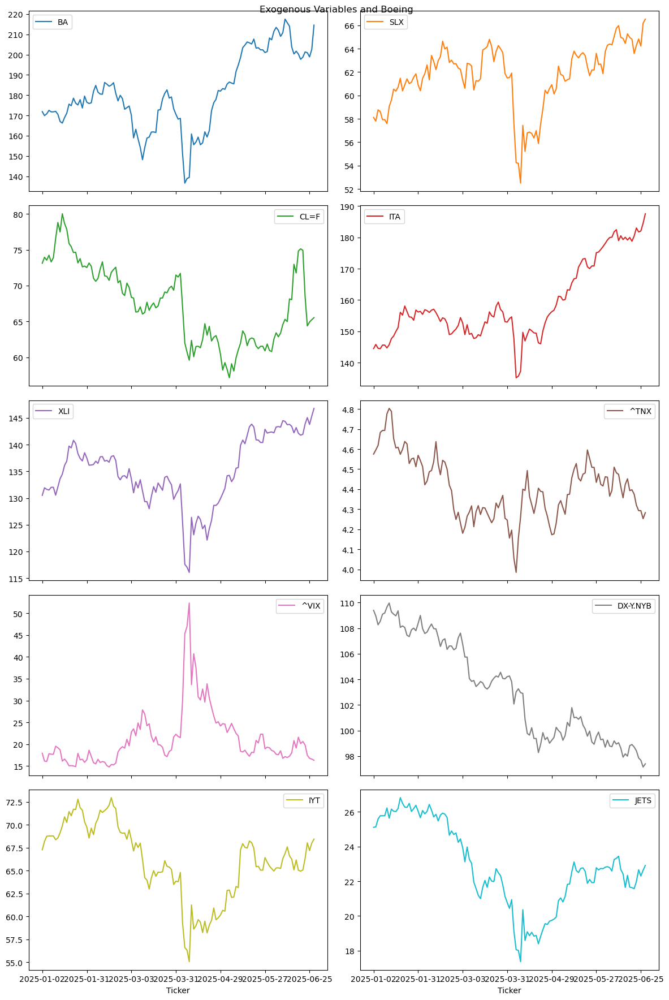

In [26]:
# Basic visual EDA
df.plot(subplots=True, figsize=(12, 18), layout=(5, 2), title="Exogenous Variables and Boeing")
plt.tight_layout()
plt.show()

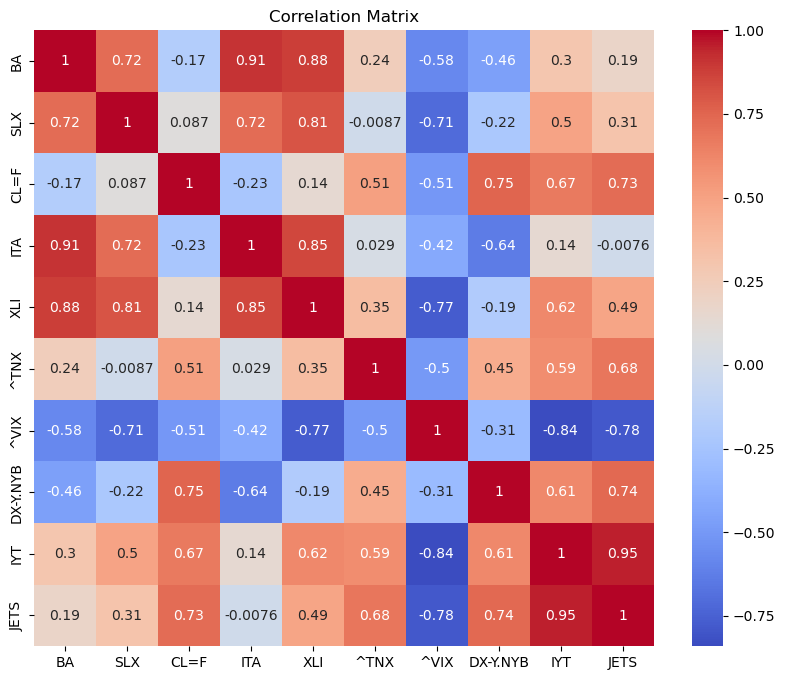

In [27]:
#correlation heatmap
corr = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

Some very promising variables... some quite weak. Interestingly some variable are very different to how the presented in 2020/21, very different shock this time. But some virtually giving the same correlation.
- ^VIX, ITA virtually the same and IYT very similar
- JETS, CL=F very very different, DX-Y quite different too

#### Checking for stationality

In [30]:
#ADF tests
#Ho: Time series is non-stationary
#Ha: Time series is stationary 
#for each ticker, if p is less than 0.05 the test was significant and we reject Ho.. thus stationary


# Initialize result list
adf_results = []

# Looping over each column (including Boeing and exogenous variables)
for column in df.columns:
    series = df[column].dropna()
    
    try:
        result = adfuller(series)
        adf_results.append({
            'Variable': column,
            'ADF Statistic': result[0],
            'p-value': result[1],
            'Stationary': 'Yes' if result[1] < 0.05 else 'No'
        })
    except Exception as e:
        adf_results.append({
            'Variable': column,
            'ADF Statistic': None,
            'p-value': None,
            'Stationary': 'Error',
            'Error': str(e)
        })

# converting results to DataFrame
adf_df = pd.DataFrame(adf_results)
print(adf_df)

   Variable  ADF Statistic   p-value Stationary
0        BA      -0.829196  0.810395         No
1       SLX      -2.113114  0.239274         No
2      CL=F      -2.173338  0.216064         No
3       ITA      -0.030995  0.955893         No
4       XLI      -1.225035  0.662735         No
5      ^TNX      -2.248091  0.189256         No
6      ^VIX      -2.515429  0.111765         No
7  DX-Y.NYB      -0.892514  0.790428         No
8       IYT      -1.655173  0.454344         No
9      JETS      -1.211746  0.668523         No


Need to ensure all are stationary before doing granger tests to avoid getting spurious results, inflated p-values, or invalid inference.

The Granger test assumes:
- Time series are covariance stationary
- constant mean/variance over time


In [33]:
# Getting first difference for all bar ^VIX
# making copy of original DataFrame
df_diff = df.copy()

# List of non-stationary series from ADF output
non_stationary = ['BA', 'SLX', 'CL=F', 'ITA', 'XLI', '^TNX', 'DX-Y.NYB', 'IYT', 'JETS', '^VIX']
stationary = [] 

# Difference only non-stationary series
df_diff_nonstat = df[non_stationary].diff()

# Drop NaNs from differenced data
df_diff_nonstat = df_diff_nonstat.dropna()

# Slice ^VIX data to match df_diff_nonstat index exactly
df_vix_clean = df.loc[df_diff_nonstat.index, stationary]

# Concatenate differenced and stationary series
df_diff = pd.concat([df_diff_nonstat, df_vix_clean], axis=1)

# Check the final DataFrame
print(df_diff.head())

                  BA       SLX      CL=F       ITA       XLI   ^TNX  DX-Y.NYB  \
Ticker                                                                          
2025-01-03 -1.970001 -0.320000  0.830002  1.336517  1.411346  0.021 -0.440002   
2025-01-06  0.880005  0.970001 -0.400002 -1.226791 -0.288239  0.022 -0.689995   
2025-01-07  1.729996 -0.150002  0.690002 -0.129669 -0.129196  0.065  0.279999   
2025-01-08 -0.750000 -0.689999 -0.930000  1.156967  0.516830  0.010  0.549995   
2025-01-09  0.000000  0.000000  0.599998  0.000000  0.000000  0.000  0.090004   

                 IYT      JETS      ^VIX  
Ticker                                    
2025-01-03  0.914597  0.029999 -1.800001  
2025-01-06  0.566658  0.450001 -0.089998  
2025-01-07  0.029831  0.190001  1.779999  
2025-01-08  0.000000  0.000000 -0.119999  
2025-01-09  0.000000  0.000000  0.000000  


In [36]:
#checking for stationality again (same hypotheses)

# Initialize result list
adf_results = []

# Using the differenced DataFrame
for column in df_diff.columns:
    series = df_diff[column].dropna()

    try:
        result = adfuller(series)
        adf_results.append({
            'Variable': column,
            'ADF Statistic': result[0],
            'p-value': result[1],
            'Stationary': 'Yes' if result[1] < 0.05 else 'No'
        })
    except Exception as e:
        adf_results.append({
            'Variable': column,
            'ADF Statistic': None,
            'p-value': None,
            'Stationary': 'Error',
            'Error': str(e)
        })

# converting to dataframe and show
adf_df = pd.DataFrame(adf_results)
print(adf_df)

   Variable  ADF Statistic       p-value Stationary
0        BA      -9.425849  5.349517e-16        Yes
1       SLX     -12.333769  6.340398e-23        Yes
2      CL=F      -6.168261  6.904913e-08        Yes
3       ITA      -7.316433  1.225833e-10        Yes
4       XLI      -6.807223  2.161299e-09        Yes
5      ^TNX     -10.252717  4.442272e-18        Yes
6  DX-Y.NYB     -11.605909  2.581509e-21        Yes
7       IYT     -12.090578  2.127272e-22        Yes
8      JETS     -13.887665  6.048174e-26        Yes
9      ^VIX     -12.319841  6.790103e-23        Yes


### Granger Causality test 
Looking for strongest candidates for exogeneous variables for this period

In [40]:
# Setting max lag for Granger test
MAX_LAG = 30

# Initialize result list
granger_results = []

# Looping through each exogenous variable
for exo_var in df_diff.columns:
    if exo_var == 'BA':
        continue  # Skip target itself

    try:
        # Subset DataFrame for this test (BA and current exogenous var)
        test_data = df_diff[['BA', exo_var]].dropna()

        # Granger causality test
        result = grangercausalitytests(test_data, maxlag=MAX_LAG, verbose=False)

        # Extract p-values for each lag
        p_values = [round(result[i + 1][0]['ssr_ftest'][1], 4) for i in range(MAX_LAG)]

        # Store min p-value and associated variable
        granger_results.append({
            'Exogenous Variable': exo_var,
            'Min p-value': min(p_values),
            'Lag with Min p': p_values.index(min(p_values)) + 1,
            'Causal (p < 0.05)': 'Yes' if min(p_values) < 0.05 else 'No'
        })

    except Exception as e:
        granger_results.append({
            'Exogenous Variable': exo_var,
            'Min p-value': None,
            'Lag with Min p': None,
            'Causal (p < 0.05)': 'Error',
            'Error': str(e)
        })

# Showing results
granger_df = pd.DataFrame(granger_results)
print(granger_df.sort_values("Min p-value"))

  Exogenous Variable  Min p-value  Lag with Min p Causal (p < 0.05)
8               ^VIX       0.0109              11               Yes
4               ^TNX       0.0184              25               Yes
0                SLX       0.0304              10               Yes
2                ITA       0.0536              14                No
5           DX-Y.NYB       0.0650               1                No
1               CL=F       0.0651               5                No
3                XLI       0.0671              24                No
6                IYT       0.2122               4                No
7               JETS       0.4435               1                No


Only ^VIX is showing any causal relationship this time (at max ag 5)- lags are too short so testing wth longer

In [42]:
# Define target variable
target = 'BA'

# Define exogenous variables to test.. including borderline too
variables_to_test = ['^VIX', '^TNX', 'SLX', 'ITA']

max_lag = 10 #trying lower max lag

# Run tests one by one for detailed output
for var in variables_to_test:
    print(f"\n Granger Causality Test: {var} ➡ {target} (Lags 1–{max_lag})")
    test_data = df_diff[[target, var]].dropna()
    grangercausalitytests(test_data, maxlag=max_lag, verbose=True)


 Granger Causality Test: ^VIX ➡ BA (Lags 1–10)

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3804  , p=0.0385  , df_denom=118, df_num=1
ssr based chi2 test:   chi2=4.4918  , p=0.0341  , df=1
likelihood ratio test: chi2=4.4104  , p=0.0357  , df=1
parameter F test:         F=4.3804  , p=0.0385  , df_denom=118, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2825  , p=0.1066  , df_denom=115, df_num=2
ssr based chi2 test:   chi2=4.7635  , p=0.0924  , df=2
likelihood ratio test: chi2=4.6714  , p=0.0967  , df=2
parameter F test:         F=2.2825  , p=0.1066  , df_denom=115, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.8012  , p=0.1511  , df_denom=112, df_num=3
ssr based chi2 test:   chi2=5.7413  , p=0.1249  , df=3
likelihood ratio test: chi2=5.6071  , p=0.1324  , df=3
parameter F test:         F=1.8012  , p=0.1511  , df_denom=112, df_num=3

Granger Causality
number of lags (no zero) 4


In [44]:
# Define target variable
target = 'BA'

# Define exogenous variables to test.. including borderline too
variables_to_test = ['^VIX', '^TNX', 'SLX', 'ITA']

max_lag = 30 #perhaps should go with lower than 11 lag for ^VIX

# Run tests one by one for detailed output
for var in variables_to_test:
    print(f"\n Granger Causality Test: {var} ➡ {target} (Lags 1–{max_lag})")
    test_data = df_diff[[target, var]].dropna()
    grangercausalitytests(test_data, maxlag=max_lag, verbose=True)


 Granger Causality Test: ^VIX ➡ BA (Lags 1–30)

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3804  , p=0.0385  , df_denom=118, df_num=1
ssr based chi2 test:   chi2=4.4918  , p=0.0341  , df=1
likelihood ratio test: chi2=4.4104  , p=0.0357  , df=1
parameter F test:         F=4.3804  , p=0.0385  , df_denom=118, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2825  , p=0.1066  , df_denom=115, df_num=2
ssr based chi2 test:   chi2=4.7635  , p=0.0924  , df=2
likelihood ratio test: chi2=4.6714  , p=0.0967  , df=2
parameter F test:         F=2.2825  , p=0.1066  , df_denom=115, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.8012  , p=0.1511  , df_denom=112, df_num=3
ssr based chi2 test:   chi2=5.7413  , p=0.1249  , df=3
likelihood ratio test: chi2=5.6071  , p=0.1324  , df=3
parameter F test:         F=1.8012  , p=0.1511  , df_denom=112, df_num=3

Granger Causality
number of lags (no zero) 4


In [46]:
#getting ready to visualize lags
# using the higher max lag for Granger test, decided to stick with these...
# no best/sensible this time
MAX_LAG = 30

# Initialize result list
granger_results_30 = []

# Loop through each exogenous variable
for exo_var in df_diff.columns:
    if exo_var == 'BA':
        continue  # Skipping the dependent variable

    try:
        # Prepare input data
        test_data = df_diff[['BA', exo_var]].dropna()

        # Run Granger causality test
        result = grangercausalitytests(test_data, maxlag=MAX_LAG, verbose=False)

        # Extract p-values across lags
        p_values = [round(result[i + 1][0]['ssr_ftest'][1], 4) for i in range(MAX_LAG)]

        # Store the lowest p-value and associated lag
        granger_results_30.append({
            'Exogenous Variable': exo_var,
            'Min p-value': min(p_values),
            'Lag with Min p': p_values.index(min(p_values)) + 1,
            'Causal (p < 0.05)': 'Yes' if min(p_values) < 0.05 else 'No',
            'All p-values': p_values #storing to plot later
        })

    except Exception as e:
        granger_results_30.append({
            'Exogenous Variable': exo_var,
            'Min p-value': None,
            'Lag with Min p': None,
            'Causal (p < 0.05)': 'Error',
            'Error': str(e)
        })

# Display results
granger_df_20 = pd.DataFrame(granger_results_30)
print(granger_df_20.sort_values("Min p-value"))

  Exogenous Variable  Min p-value  Lag with Min p Causal (p < 0.05)  \
8               ^VIX       0.0109              11               Yes   
4               ^TNX       0.0184              25               Yes   
0                SLX       0.0304              10               Yes   
2                ITA       0.0536              14                No   
5           DX-Y.NYB       0.0650               1                No   
1               CL=F       0.0651               5                No   
3                XLI       0.0671              24                No   
6                IYT       0.2122               4                No   
7               JETS       0.4435               1                No   

                                        All p-values  
8  [0.0385, 0.1066, 0.1511, 0.0658, 0.0664, 0.023...  
4  [0.1344, 0.3128, 0.4694, 0.6106, 0.6243, 0.719...  
0  [0.6276, 0.7643, 0.7897, 0.8751, 0.4028, 0.498...  
2  [0.4163, 0.6805, 0.1117, 0.2131, 0.2321, 0.329...  
5  [0.065, 0.1

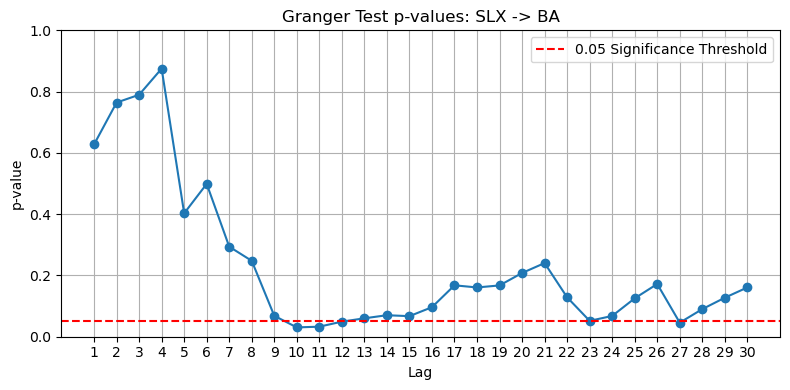

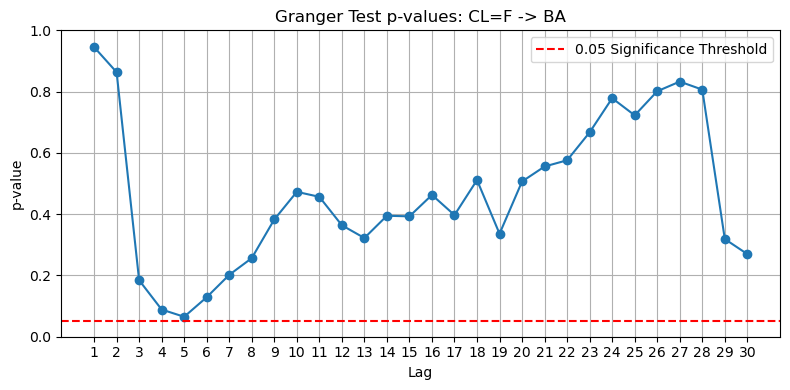

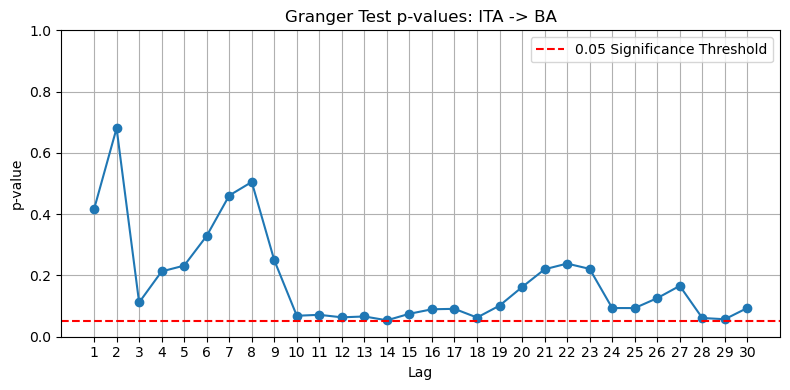

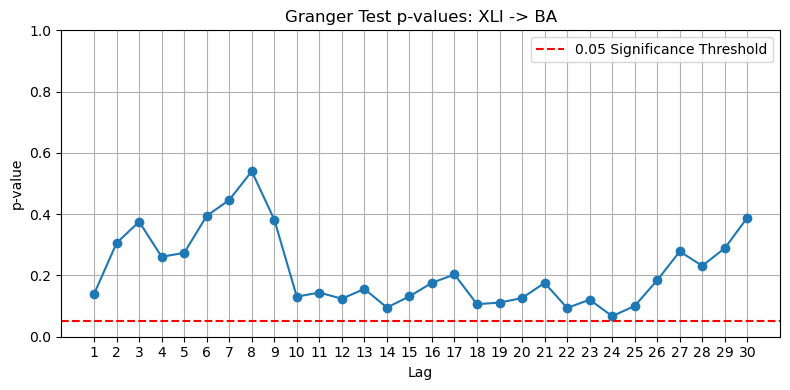

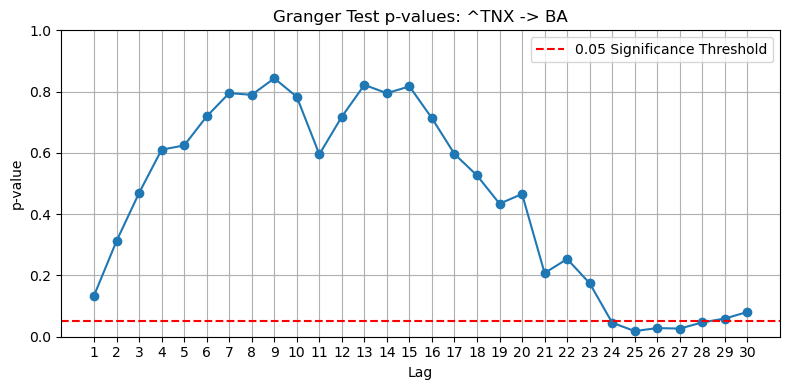

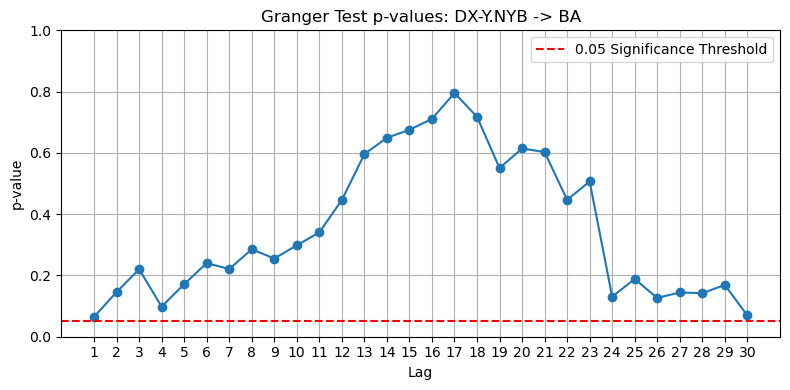

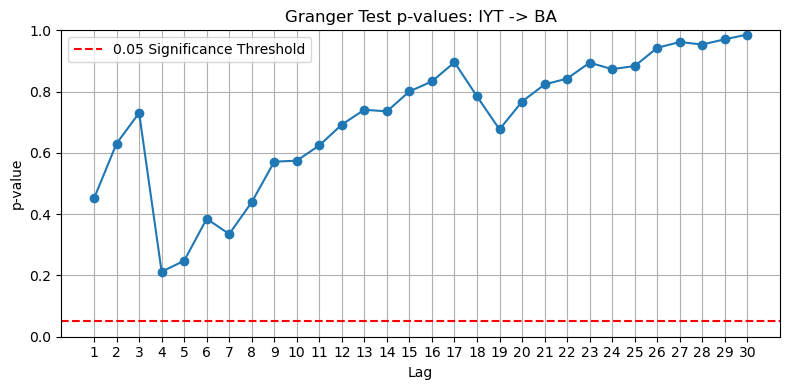

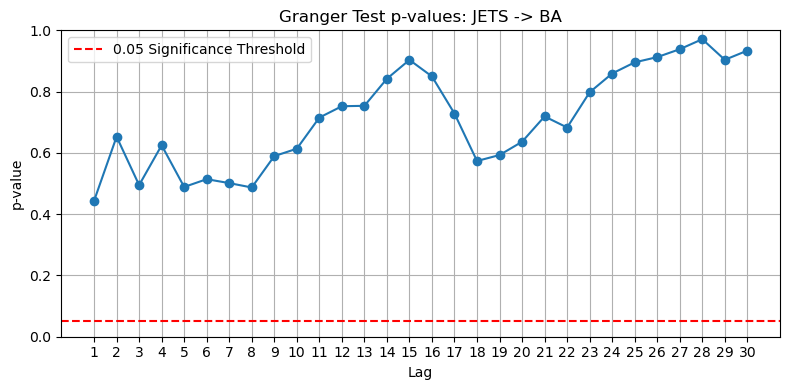

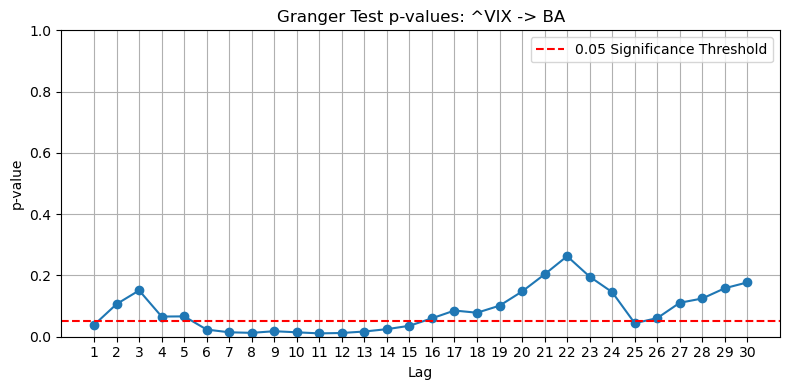

In [49]:
# plotting p-values across lags for each exogenous variable
for result in granger_results_30:
    if 'All p-values' not in result:
        continue  # skipping when p-values not stored due to error

    plt.figure(figsize=(8, 4))
    plt.plot(range(1, MAX_LAG + 1), result['All p-values'], marker='o')
    plt.axhline(y=0.05, color='red', linestyle='--', label='0.05 Significance Threshold')
    plt.title(f"Granger Test p-values: {result['Exogenous Variable']} -> BA")
    plt.xlabel("Lag")
    plt.ylabel("p-value")
    plt.xticks(range(1, MAX_LAG + 1))
    plt.ylim(0, 1)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

- CL=F had appeared to have moderate causality at lag 5... but looking at it's plot it would appear it was just a fluke... will not incude in ARIMA models
- XLI appears to be less "flukey"... potentially worth including at lag 24.. although very large lag
- ^TNX definitely worth including at lag 25
- 14 for ITA... flat along here so worth including although not quite at p value
- confident no to JETS and IYT
- stick with lag 11 for ^VIX

## Final verdict
- XLI- 24 (moderate)
- ^TNX 25
- ITA 14 (moderate)
- ^VIX 11
- SLX 10

## Building ARIMA model

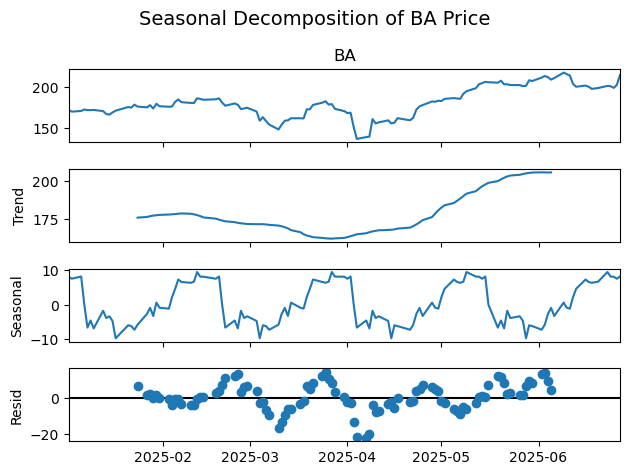

In [54]:
#already know it needs to be differenced once for stationlity
#looking at seasonality

# getting BA price series
ba_series = df['BA'].dropna()
ba_series.index = pd.to_datetime(ba_series.index)

# looking at daily seasonality 
decomposition = seasonal_decompose(ba_series, model='additive', period=30)
decomposition.plot()
plt.suptitle('Seasonal Decomposition of BA Price', fontsize=14)
plt.tight_layout()
plt.show()

Looks like there is a strong argument for SARIMA model here, could be monthly seasonality. Residuals suggest exo variables could be helpful. Trend def not stationary so the differncing makes sense as we knew)

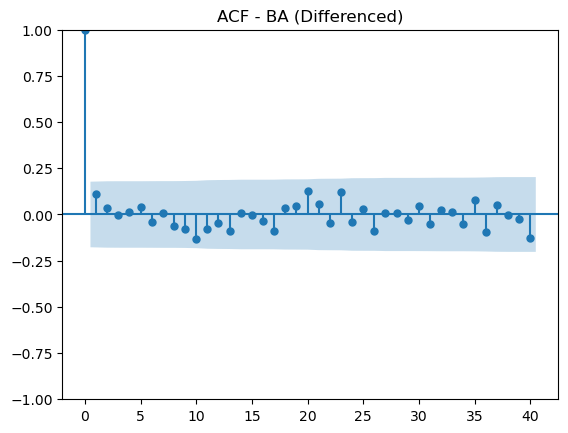

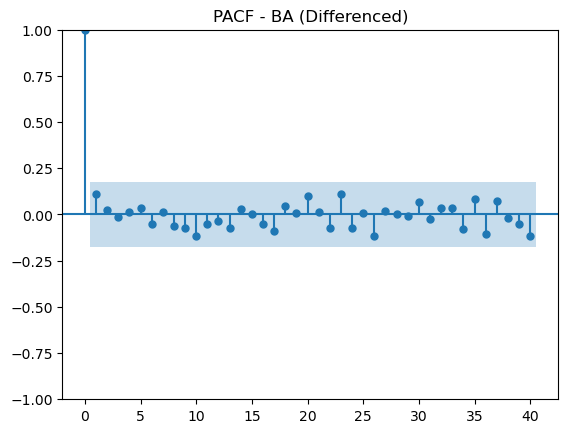

In [57]:
#ACF PACF plots
# First difference
ba_diff = ba_series.diff().dropna()

# Plot ACF & PACF
plot_acf(ba_diff, lags=40)
plt.title('ACF - BA (Differenced)')
plt.show()

plot_pacf(ba_diff, lags=40)
plt.title('PACF - BA (Differenced)')
plt.show()

Looks like (1,1,1) could be best again... Will use auto arima to see if this is confirmed

In [60]:
auto_model = auto_arima(ba_series, seasonal=True, m=30, #swapped out and tested for different business days
                        stepwise=True, trace=True,
                        suppress_warnings=True, max_order=10)

print(auto_model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[30] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(0,1,0)(0,0,0)[30] intercept   : AIC=723.287, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[30] intercept   : AIC=725.196, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[30] intercept   : AIC=725.274, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[30]             : AIC=721.987, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[30] intercept   : AIC=724.996, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[30] intercept   : AIC=724.969, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[30] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(1,1,0)(0,0,0)[30] intercept   : AIC=723.645, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[30] intercept   : AIC=723.748, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[30] intercept   : AIC=725.581, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[30]          
Total fit time: 3.500 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  123
Mod

In [61]:
#grid search for seasonality
def evaluate_sarima_configs(y, order_list, seasonal_order_list, seasonal_period, forecast_horizon=7):
    results = []

    train = y.iloc[:-forecast_horizon]
    test = y.iloc[-forecast_horizon:]

    for order in order_list:
        for seasonal in seasonal_order_list:
            seasonal_order = (seasonal[0], seasonal[1], seasonal[2], seasonal_period)
            try:
                model = SARIMAX(train, order=order, seasonal_order=seasonal_order,
                                enforce_stationarity=False, enforce_invertibility=False)
                model_fit = model.fit(disp=False)

                forecast = model_fit.forecast(steps=forecast_horizon)

                rmse = np.sqrt(mean_squared_error(test, forecast))
                mae = mean_absolute_error(test, forecast)

                results.append({
                    'order': order,
                    'seasonal_order': seasonal_order,
                    'RMSE': round(rmse, 2),
                    'MAE': round(mae, 2),
                    'AIC': round(model_fit.aic, 2)
                })

            except Exception as e:
                results.append({
                    'order': order,
                    'seasonal_order': seasonal_order,
                    'RMSE': None,
                    'MAE': None,
                    'AIC': None,
                    'Error': str(e)
                })

    return pd.DataFrame(results)


In [62]:
order_list = [(0, 1, 0), (1, 1, 1), (0, 1, 1),(0,1,2)]
seasonal_order_list = [(1, 0, 0), (0, 0, 1), (1, 0, 1)]

for m in [5, 7, 20, 21, 22, 30]:
    print(f"Evaluating for seasonal period: {m}")
    results = evaluate_sarima_configs(ba_series, order_list, seasonal_order_list, seasonal_period=m)
    print(results.sort_values('RMSE'))

Evaluating for seasonal period: 5
        order seasonal_order  RMSE   MAE     AIC
0   (0, 1, 0)   (1, 0, 0, 5)  6.00  3.64  656.24
9   (0, 1, 2)   (1, 0, 0, 5)  6.07  3.68  658.57
1   (0, 1, 0)   (0, 0, 1, 5)  6.09  3.70  651.21
2   (0, 1, 0)   (1, 0, 1, 5)  6.09  3.72  653.06
6   (0, 1, 1)   (1, 0, 0, 5)  6.09  3.68  657.02
3   (1, 1, 1)   (1, 0, 0, 5)  6.12  3.70  653.80
11  (0, 1, 2)   (1, 0, 1, 5)  6.16  3.75  644.98
8   (0, 1, 1)   (1, 0, 1, 5)  6.17  3.75  648.86
10  (0, 1, 2)   (0, 0, 1, 5)  6.17  3.74  643.04
7   (0, 1, 1)   (0, 0, 1, 5)  6.18  3.73  646.96
5   (1, 1, 1)   (1, 0, 1, 5)  6.24  3.81  650.47
4   (1, 1, 1)   (0, 0, 1, 5)  6.25  3.77  648.63
Evaluating for seasonal period: 7
        order seasonal_order  RMSE   MAE     AIC
1   (0, 1, 0)   (0, 0, 1, 7)  5.73  3.47  641.00
2   (0, 1, 0)   (1, 0, 1, 7)  5.73  3.47  643.00
0   (0, 1, 0)   (1, 0, 0, 7)  5.74  3.48  646.50
10  (0, 1, 2)   (0, 0, 1, 7)  5.79  3.51  633.11
7   (0, 1, 1)   (0, 0, 1, 7)  5.81  3.51  636.90
1

In [42]:
auto_model = auto_arima(ba_series, seasonal=False, m=30,
                        stepwise=True, trace=True,
                        suppress_warnings=True, max_order=10)

print(auto_model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=727.302, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=723.287, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=723.645, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=723.748, Time=0.03 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=721.987, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=725.581, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.615 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  123
Model:               SARIMAX(0, 1, 0)   Log Likelihood                -359.993
Date:                Thu, 31 Jul 2025   AIC                            721.987
Time:                        12:24:22   BIC                            724.791
Sample:                             0   HQIC                           723.126
                

Going to use (1,1,1) and (0,1,0) from auto arima... nothing coming up as significant with seasonality... I may just have too small of a dataset here

I will choose best model based on evealuations and then continue with that model for my exogeneous variables

### ARIMA model choice: (0,1,0) - best aic results
Will try (1,1,1) also as seems strong from plots, although not selected by auto arima, usually a decent benchmark for longer forcasts... Will try (0,1,1) an (1,1,0) too just to see if there is any AR or MA elements that weren't picked up by auto arima

- Seasonal apparent only with grid search:  (1, 1, 1)  (1, 0, 0, 30)  RMSE=5.19  MAE=3.08   AIC 518.66

## Gettning results for Baseline models (no exo variables)
- No seasonality -ARIMAX- (0, 1, 0)
- ARIMA (1,1,1) as benchmark
- ARIMA (1,1,0) and (0,1,1,) to see it and AR or MA structure helps at all
- seasonal as above

In [68]:
#define models

def mean_absolute_percentage_error(y_true, y_pred):
    """Avoids division by zero issues."""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

def rolling_forecast_baseline_model(
    df,
    model_order,
    forecast_horizons,
    train_end_date,
    test_start_date,
    output_csv_path,
    seasonal_order=None
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq('B')
    series = df['BA'].dropna()

    train = series[series.index <= train_end_date]
    test = series[series.index >= test_start_date]

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(0, len(test) - h + 1):
            train_series = pd.concat([train, test.iloc[:i]])

            try:
                model = SARIMAX(
                    train_series,
                    order=model_order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                results = model.fit(disp=False)
                forecast = results.get_forecast(steps=h)
                pred = forecast.predicted_mean.iloc[-1]
                actual = test.iloc[i + h - 1]

                if not np.isnan(pred) and not np.isnan(actual):
                    preds.append(pred)
                    actuals.append(actual)
                    dates.append(test.index[i + h - 1])
            except Exception as e:
                continue

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            model_name = f"SARIMA{model_order}" if seasonal_order else f"ARIMA{model_order}"
            all_metrics.append({
                'model': model_name,
                'seasonal': bool(seasonal_order),
                'horizon': h,
                'rmse': rmse,
                'mae': mae,
                'mape': mape
            })

            # Print results
            print(f"\n{model_name} {'(Seasonal)' if seasonal_order else ''} - Horizon {h}")
            print(f"  RMSE: {rmse:.2f}")
            print(f"  MAE:  {mae:.2f}")
            print(f"  MAPE: {mape:.2f}%")

            # Plot
            plt.figure(figsize=(10, 4))
            plt.plot(dates, actuals, label='Actual')
            plt.plot(dates, preds, label='Forecast')
            plt.title(f"{model_name} {'(Seasonal)' if seasonal_order else ''} - {h}-Day Horizon")
            plt.xlabel('Date')
            plt.ylabel('BA Close Price')
            plt.legend()
            plt.tight_layout()
            plt.show()

    df_metrics = pd.DataFrame(all_metrics)

    if not df_metrics.empty:
        if not os.path.exists(output_csv_path):
            df_metrics.to_csv(output_csv_path, index=False)
        else:
            df_metrics.to_csv(output_csv_path, mode='a', header=False, index=False)
        print(f"\n Saved metrics to {output_csv_path}")

    return df_metrics


ARIMA(0, 1, 0)  - Horizon 1
  RMSE: 4.32
  MAE:  3.16
  MAPE: 1.52%


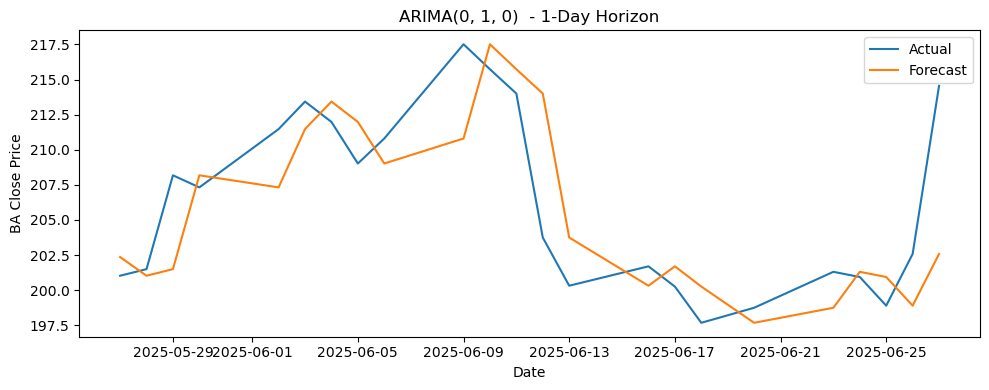


ARIMA(0, 1, 0)  - Horizon 3
  RMSE: 7.32
  MAE:  5.83
  MAPE: 2.81%


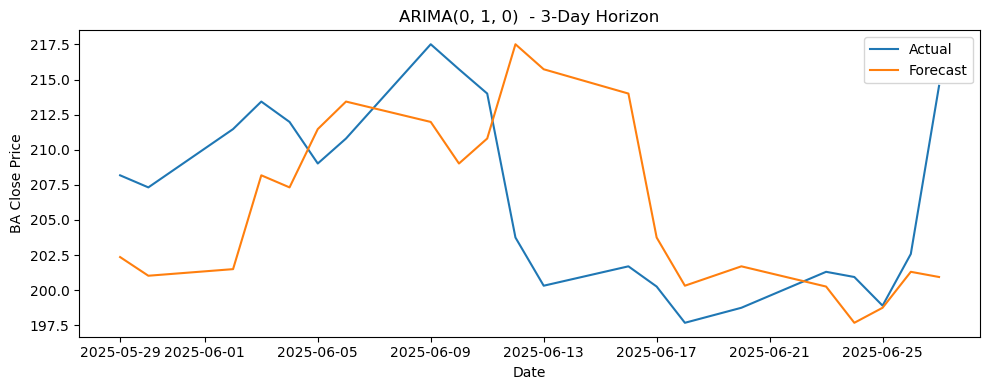


ARIMA(0, 1, 0)  - Horizon 7
  RMSE: 10.46
  MAE:  9.13
  MAPE: 4.45%


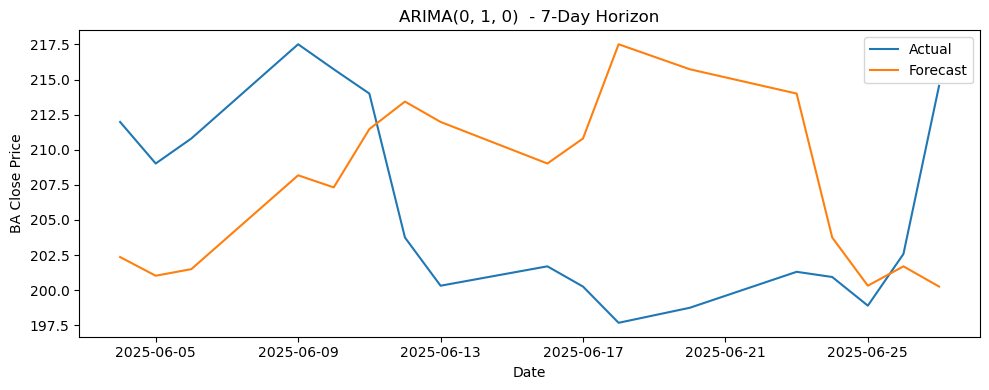


 Saved metrics to baseline_metrics_2025.csv

ARIMA(1, 1, 1)  - Horizon 1
  RMSE: 4.28
  MAE:  3.22
  MAPE: 1.55%


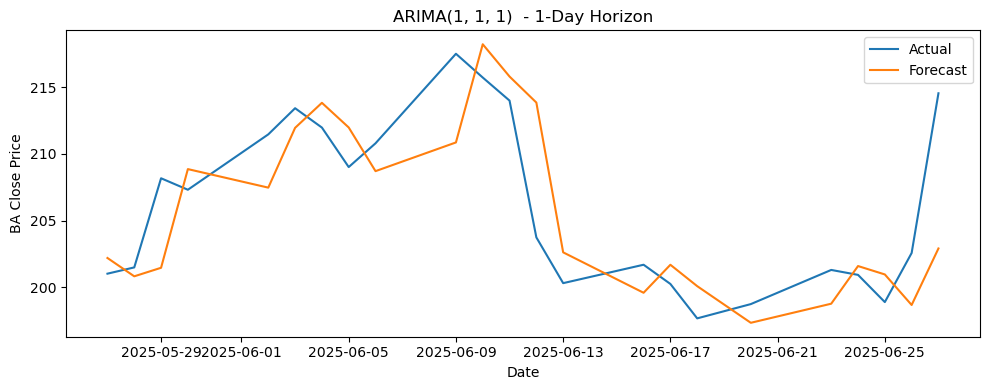


ARIMA(1, 1, 1)  - Horizon 3
  RMSE: 7.42
  MAE:  5.81
  MAPE: 2.80%


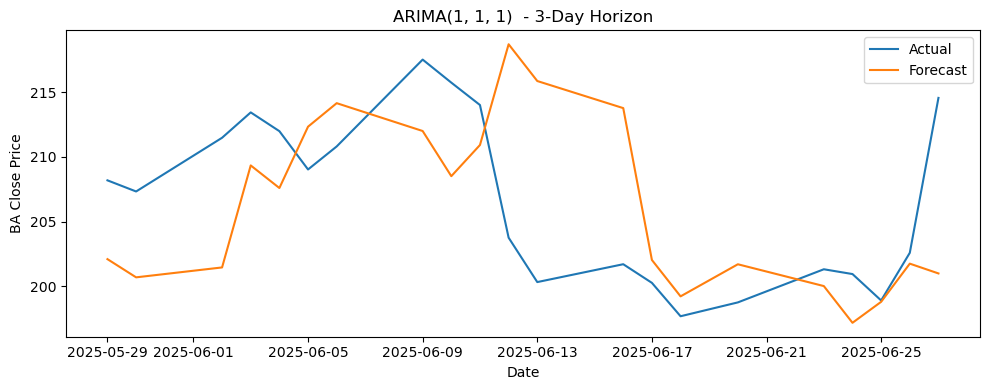


ARIMA(1, 1, 1)  - Horizon 7
  RMSE: 10.58
  MAE:  8.96
  MAPE: 4.37%


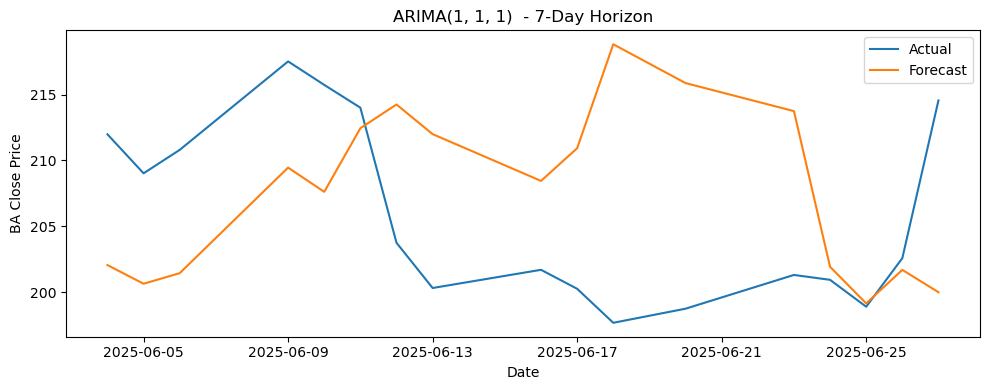


 Saved metrics to baseline_metrics_2025.csv

ARIMA(1, 1, 0)  - Horizon 1
  RMSE: 4.25
  MAE:  3.18
  MAPE: 1.53%


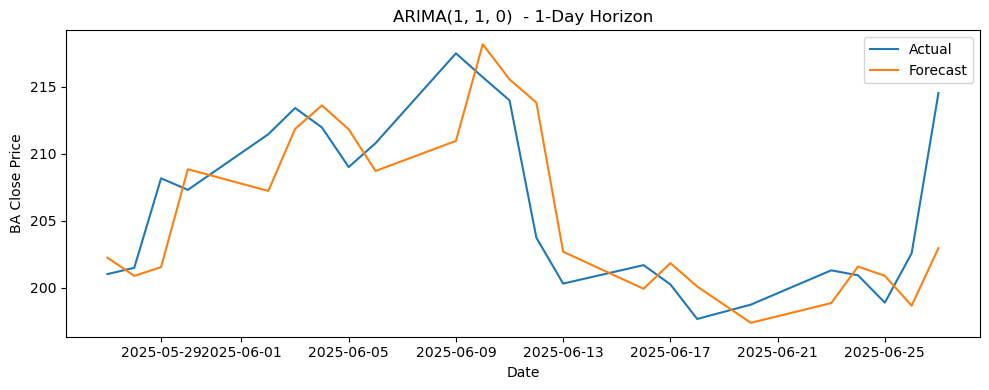


ARIMA(1, 1, 0)  - Horizon 3
  RMSE: 7.36
  MAE:  5.81
  MAPE: 2.80%


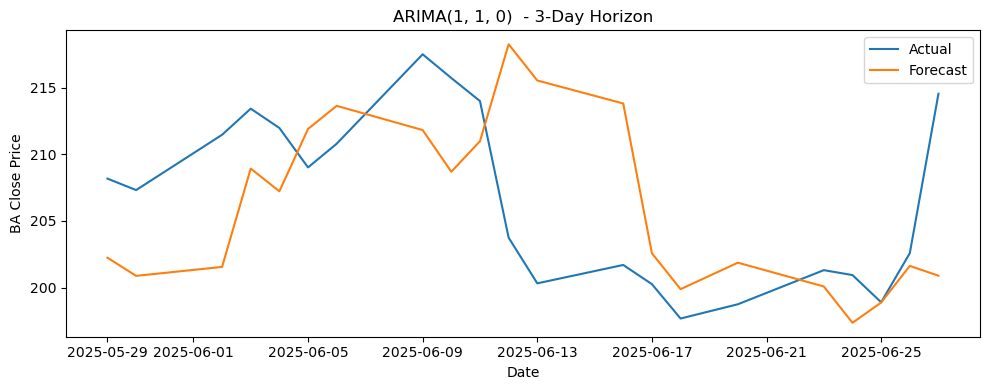


ARIMA(1, 1, 0)  - Horizon 7
  RMSE: 10.48
  MAE:  9.01
  MAPE: 4.39%


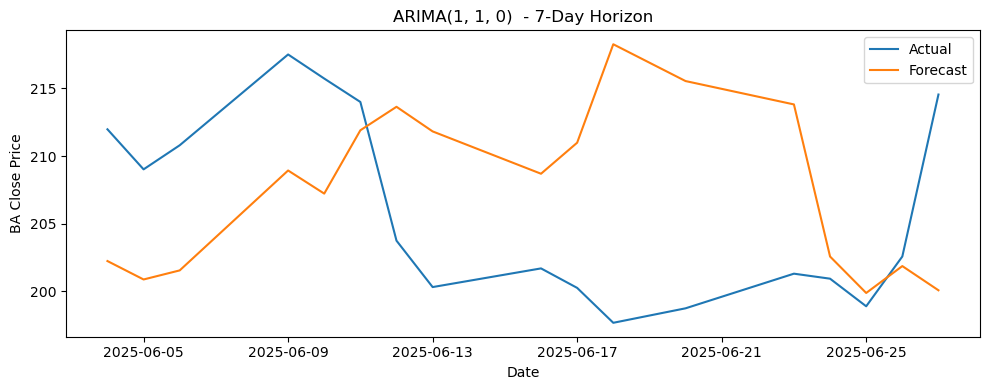


 Saved metrics to baseline_metrics_2025.csv

ARIMA(0, 1, 1)  - Horizon 1
  RMSE: 4.25
  MAE:  3.16
  MAPE: 1.52%


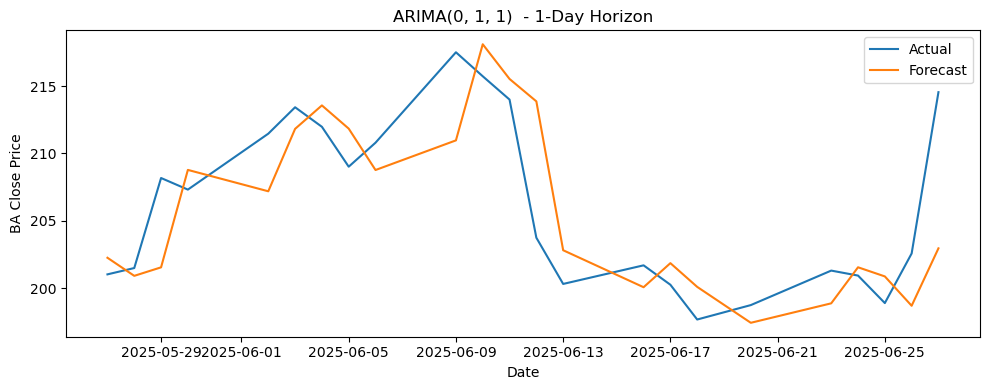


ARIMA(0, 1, 1)  - Horizon 3
  RMSE: 7.35
  MAE:  5.82
  MAPE: 2.81%


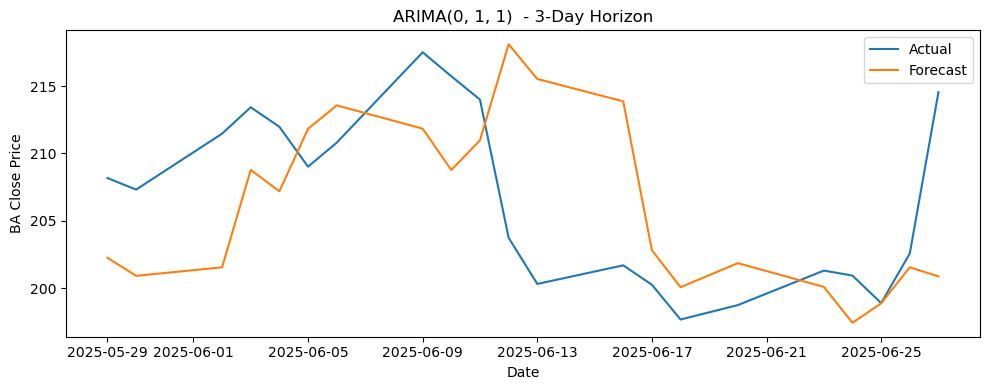


ARIMA(0, 1, 1)  - Horizon 7
  RMSE: 10.47
  MAE:  9.04
  MAPE: 4.41%


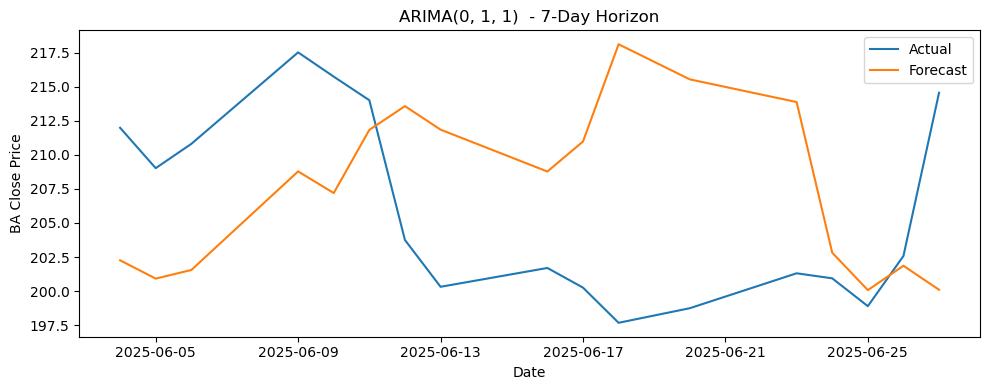


 Saved metrics to baseline_metrics_2025.csv

SARIMA(1, 1, 1) (Seasonal) - Horizon 1
  RMSE: 4.29
  MAE:  3.26
  MAPE: 1.57%


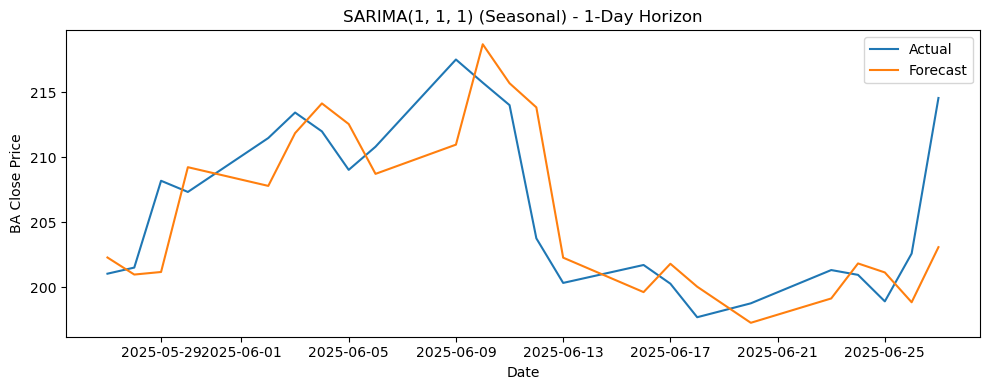


SARIMA(1, 1, 1) (Seasonal) - Horizon 3
  RMSE: 7.39
  MAE:  5.75
  MAPE: 2.78%


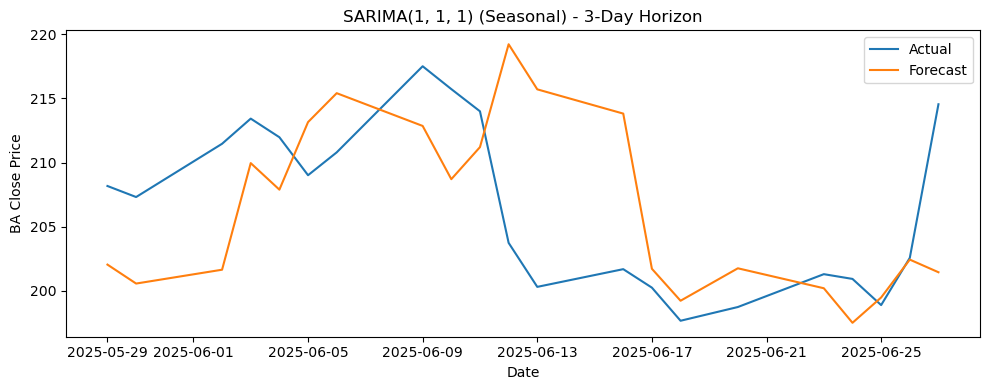


SARIMA(1, 1, 1) (Seasonal) - Horizon 7
  RMSE: 10.56
  MAE:  8.72
  MAPE: 4.26%


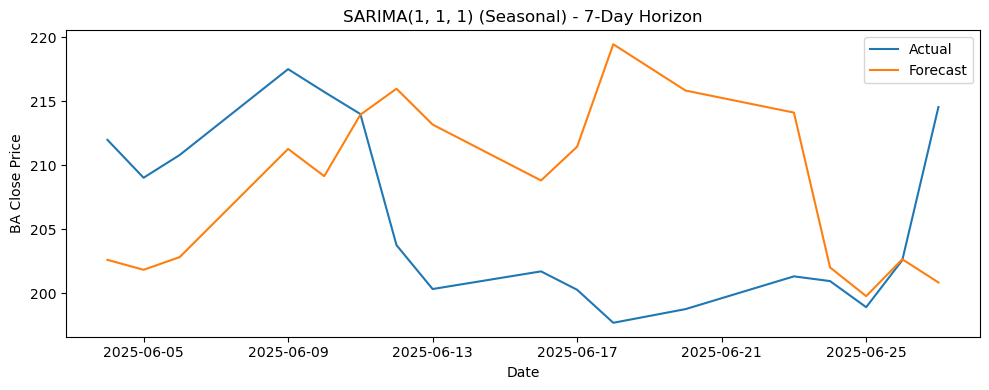


 Saved metrics to baseline_metrics_2025.csv


In [70]:
#running baseline functions
forecast_horizons = [1, 3, 7]
train_end = "2025-05-23"  # 80 20 split
test_start = "2025-05-27" 

# ARIMA(0,1,0) - baseline non-seasonal
baseline_arima_010 = rolling_forecast_baseline_model(
    df=df,
    model_order=(0, 1, 0),
    forecast_horizons=forecast_horizons,
    train_end_date=train_end,
    test_start_date=test_start,
    output_csv_path="baseline_metrics_2025.csv",
    seasonal_order=None
)

# ARIMA(1,1,1) - baseline non-seasonal
baseline_arima_111 = rolling_forecast_baseline_model(
    df=df,
    model_order=(1, 1, 1),
    forecast_horizons=forecast_horizons,
    train_end_date=train_end,
    test_start_date=test_start,
    output_csv_path="baseline_metrics_2025.csv",
    seasonal_order=None
)
# ARIMA(1,1,0) - baseline non-seasonal
baseline_arima_110 = rolling_forecast_baseline_model(
    df=df,
    model_order=(1, 1, 0),
    forecast_horizons=forecast_horizons,
    train_end_date=train_end,
    test_start_date=test_start,
    output_csv_path="baseline_metrics_2025.csv",
    seasonal_order=None
)
# ARIMA(0,1,1) - baseline non-seasonal
baseline_arima_011 = rolling_forecast_baseline_model(
    df=df,
    model_order=(0, 1, 1),
    forecast_horizons=forecast_horizons,
    train_end_date=train_end,
    test_start_date=test_start,
    output_csv_path="baseline_metrics_2025.csv",
    seasonal_order=None
)
#SARIMA (1,1,1)(1,0,0)[30] - baseline seasonal
baseline_seasonal = rolling_forecast_baseline_model(
    df=df,
    model_order=(1, 1, 1),
    forecast_horizons=forecast_horizons,
    train_end_date=train_end,
    test_start_date=test_start,
    output_csv_path="baseline_metrics_2025.csv",
    seasonal_order=(1, 0, 0, 30)
)

### Using exo variables with ARIMA
### Selected Exogenous Variables and Lags for 2025 Forecasting

| Variable | Lag | Granger Result     | Notes                                           |
|----------|-----|--------------------|-------------------------------------------------|
| XLI      | 24  | Moderate           | P-value slightly above 0.05 but graph promising |
| ^TNX     | 25  | Strong             | Statistically significant at multiple lags      |
| ITA      | 14  | Moderate           | Near significance with clear lag peak           |
| ^VIX     | 11  | Strong             | Consistent significance and visual support      |
| SLX      | 10  | Strong             | Strong result at lag 10                         |

In [101]:
# Define sensible lag choices
exog_lags = {
    '^VIX': 11,
    '^TNX': 25,
    'ITA': 14,
    'XLI': 24,
    'SLX': 10
}


# CHOOSE which to use in this cell
exog_vars = exog_lags

### Testing grouped variable's impact on ARIMAX model

In [104]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

def rolling_forecast_sarimax_with_metrics(
    target_df,
    exog_df,
    exog_lags,
    model_order,
    forecast_horizons,
    train_end_date,
    test_start_date,
    output_csv_path,
    seasonal_order=None,
    plot=True,
    append_csv=True
):
    # Align indices
    target_df = target_df.copy()
    target_df.index = pd.to_datetime(target_df.index)
    target_df = target_df.asfreq('B')

    exog_df = exog_df.copy()
    exog_df.index = pd.to_datetime(exog_df.index)
    exog_df = exog_df.asfreq('B')

    # Generate lagged exogenous variables
    for var, lag in exog_lags.items():
        exog_df[f'{var}_lag{lag}'] = exog_df[var].shift(lag)

    exog_df.dropna(inplace=True)

    exog_cols = [f'{var}_lag{lag}' for var, lag in exog_lags.items()]

    # Align target to the lagged exog index
    target = target_df.loc[exog_df.index]
    exog = exog_df[exog_cols]

    train_y = target[target.index <= train_end_date]
    test_y = target[target.index >= test_start_date]
    train_X = exog[exog.index <= train_end_date]
    test_X = exog[exog.index >= test_start_date]

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(0, len(test_y) - h + 1):
            y_train = pd.concat([train_y, test_y.iloc[:i]])
            X_train = pd.concat([train_X, test_X.iloc[:i]])
            X_forecast = test_X.iloc[i:i + h]

            try:
                model = SARIMAX(
                    y_train,
                    exog=X_train,
                    order=model_order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                results = model.fit(disp=False)
                forecast = results.get_forecast(steps=h, exog=X_forecast)

                pred = forecast.predicted_mean.iloc[-1]
                actual = test_y.iloc[i + h - 1]

                if not np.isnan(pred) and not np.isnan(actual):
                    preds.append(pred)
                    actuals.append(actual)
                    dates.append(test_y.index[i + h - 1])
            except:
                continue

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            all_metrics.append({
                'model': f"SARIMAX{model_order}" + (f" + Season{seasonal_order}" if seasonal_order else ""),
                'horizon': h,
                'rmse': rmse,
                'mae': mae,
                'mape': mape,
                'exog_vars': ','.join(exog_cols)
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label='Actual')
                plt.plot(dates, preds, label='Forecast')
                plt.title(f"SARIMAX{model_order}{' + Seasonal' if seasonal_order else ''} Horizon={h}")
                plt.xlabel('Date')
                plt.ylabel('BA Price')
                plt.legend()
                plt.tight_layout()
                plt.show()

            print(f"Horizon {h}: RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")

    df_metrics = pd.DataFrame(all_metrics)
    if append_csv and os.path.exists(output_csv_path):
        df_existing = pd.read_csv(output_csv_path)
        df_combined = pd.concat([df_existing, df_metrics], ignore_index=True)
        df_combined.to_csv(output_csv_path, index=False)
    else:
        df_metrics.to_csv(output_csv_path, index=False)

    print(f"\n Metrics saved to: {output_csv_path}")
    return df_metrics

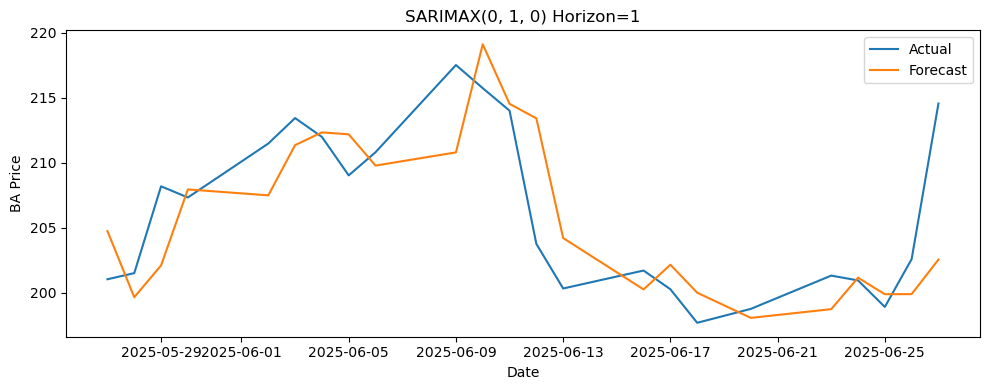

Horizon 1: RMSE=4.28, MAE=3.12, MAPE=1.50


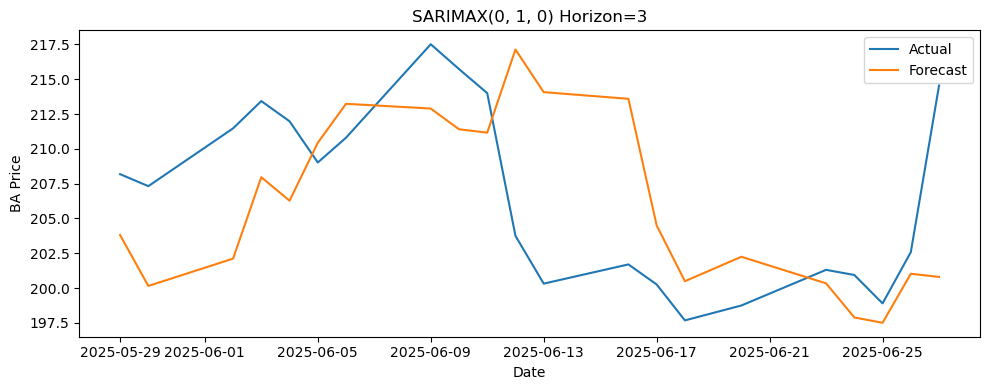

Horizon 3: RMSE=7.00, MAE=5.62, MAPE=2.72


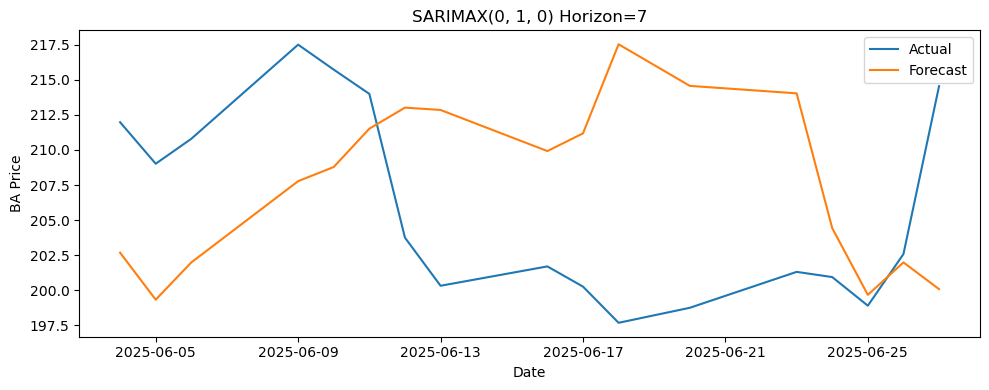

Horizon 7: RMSE=10.48, MAE=9.16, MAPE=4.46

 Metrics saved to: grouped_arimax_2025.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(0, 1, 0)",1,4.282325,3.123429,1.503035,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."
1,"SARIMAX(0, 1, 0)",3,6.995793,5.618152,2.715250,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."
2,"SARIMAX(0, 1, 0)",7,10.478085,9.155796,4.463989,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."


In [106]:
# grouped exo variables 
rolling_forecast_sarimax_with_metrics(
    target_df=df['BA'],           # original data, with raw BA values
    exog_df=df_diff,        # differenced exogenous variables.. if stationary, not diff-ed 
    exog_lags=exog_lags,
    model_order=(0, 1, 0),
    forecast_horizons=[1, 3, 7],
    train_end_date = "2025-05-23",
    test_start_date = "2025-05-27" ,
    seasonal_order=None,
    output_csv_path="grouped_arimax_2025.csv",
    plot=True,
    append_csv=True
)

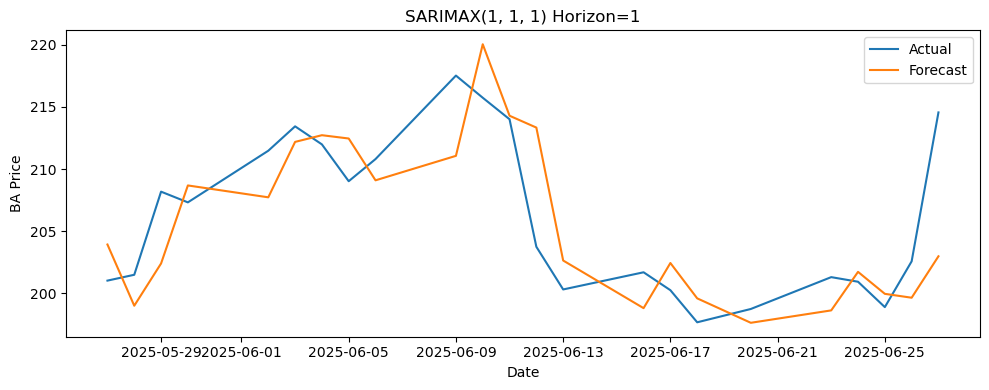

Horizon 1: RMSE=4.21, MAE=3.19, MAPE=1.54


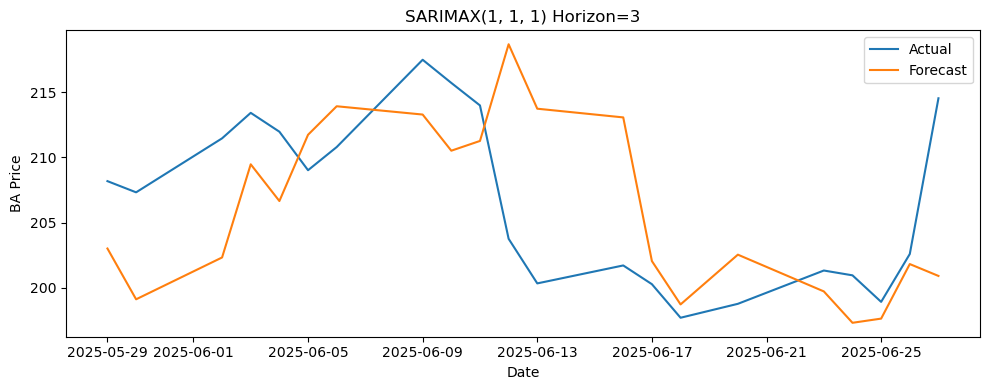

Horizon 3: RMSE=7.07, MAE=5.58, MAPE=2.69


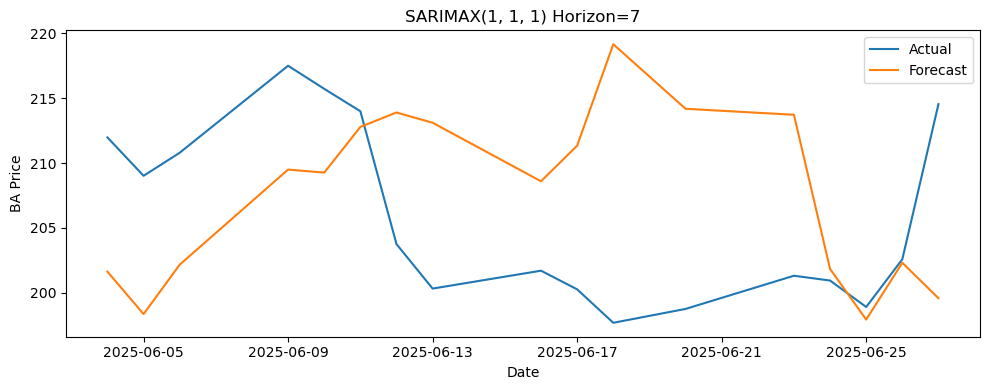

Horizon 7: RMSE=10.63, MAE=8.98, MAPE=4.38

 Metrics saved to: grouped_arimax_2025.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(1, 1, 1)",1,4.207733,3.193969,1.537574,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."
1,"SARIMAX(1, 1, 1)",3,7.065587,5.579187,2.693601,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."
2,"SARIMAX(1, 1, 1)",7,10.629280,8.984116,4.382877,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."


In [107]:
# grouped exo variables 
rolling_forecast_sarimax_with_metrics(
    target_df=df['BA'],           # original data, with raw BA values
    exog_df=df_diff,        # differenced exogenous variables.. if stationary, not diff-ed 
    exog_lags=exog_lags,
    model_order=(1, 1, 1),
    forecast_horizons=[1, 3, 7],
    train_end_date = "2025-05-23",
    test_start_date = "2025-05-27" ,
    seasonal_order=None,
    output_csv_path="grouped_arimax_2025.csv",
    plot=True,
    append_csv=True
)

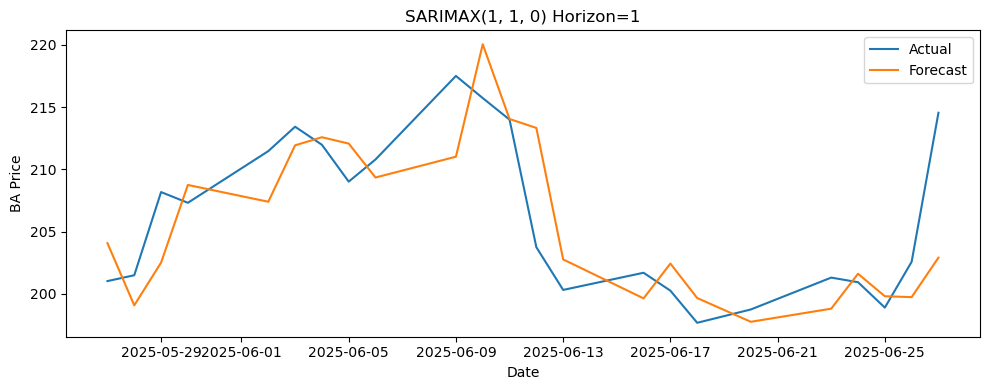

Horizon 1: RMSE=4.19, MAE=3.13, MAPE=1.50


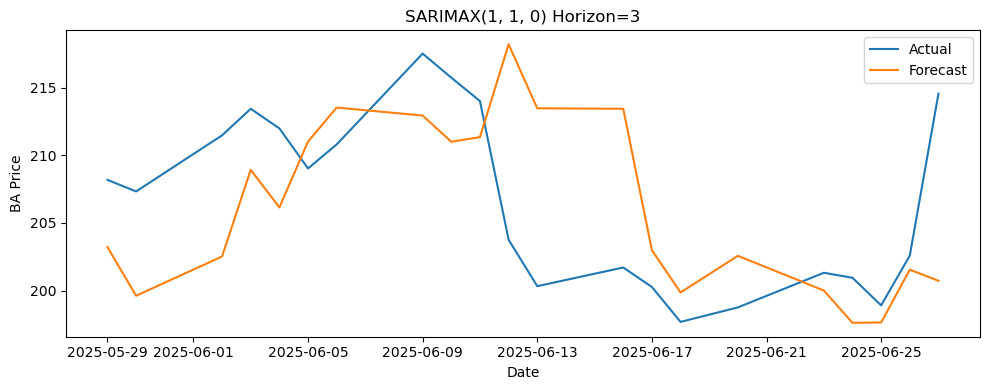

Horizon 3: RMSE=7.01, MAE=5.59, MAPE=2.70


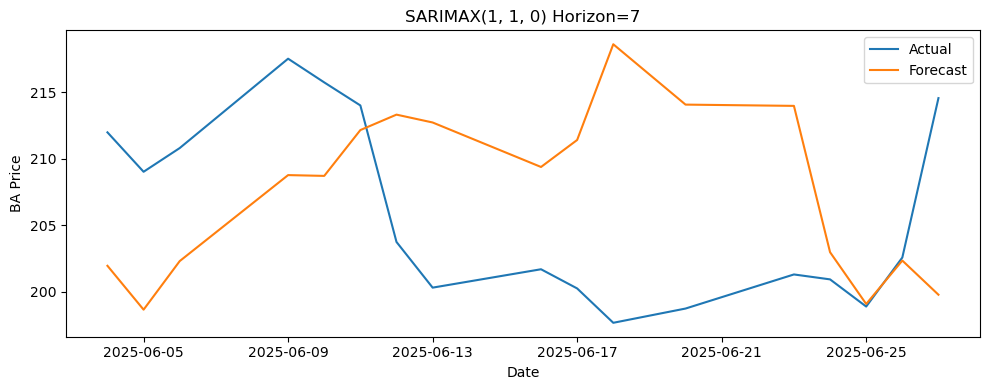

Horizon 7: RMSE=10.55, MAE=9.02, MAPE=4.40

 Metrics saved to: grouped_arimax_2025.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(1, 1, 0)",1,4.187947,3.126569,1.504300,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."
1,"SARIMAX(1, 1, 0)",3,7.014729,5.594811,2.702433,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."
2,"SARIMAX(1, 1, 0)",7,10.547817,9.021358,4.398550,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."


In [109]:
# grouped exo variables 
rolling_forecast_sarimax_with_metrics(
    target_df=df['BA'],           # original data, with raw BA values
    exog_df=df_diff,        # differenced exogenous variables.. if stationary, not diff-ed 
    exog_lags=exog_lags,
    model_order=(1, 1, 0),
    forecast_horizons=[1, 3, 7],
    train_end_date = "2025-05-23",
    test_start_date = "2025-05-27" ,
    seasonal_order=None,
    output_csv_path="grouped_arimax_2025.csv",
    plot=True,
    append_csv=True
)

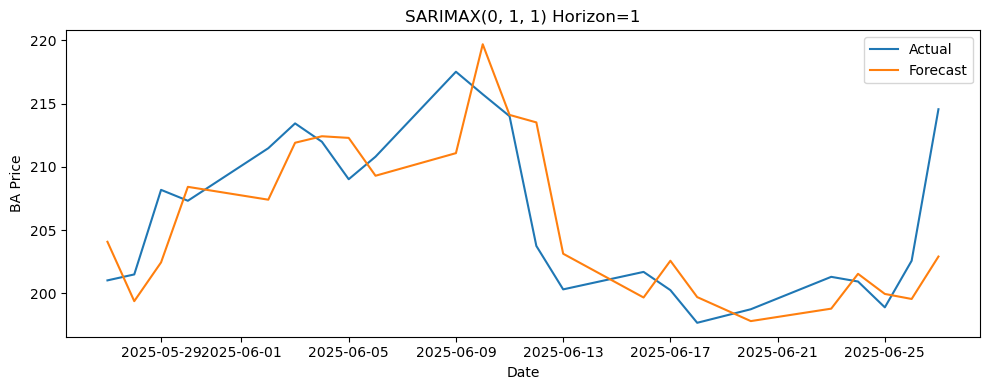

Horizon 1: RMSE=4.21, MAE=3.13, MAPE=1.51


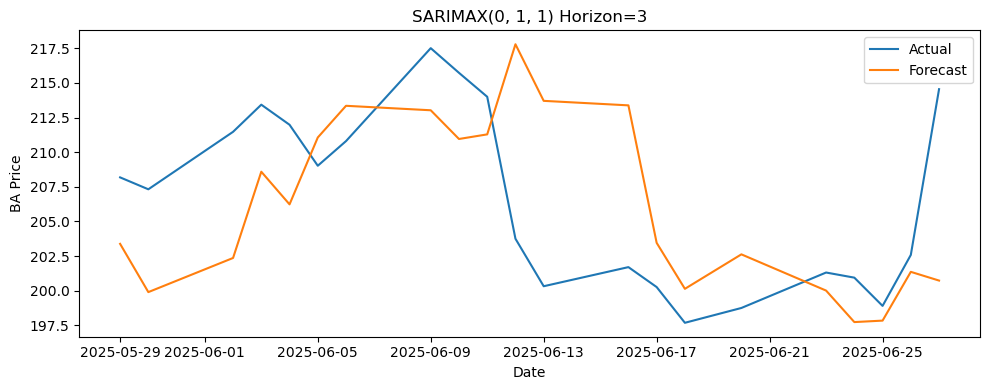

Horizon 3: RMSE=7.00, MAE=5.61, MAPE=2.71


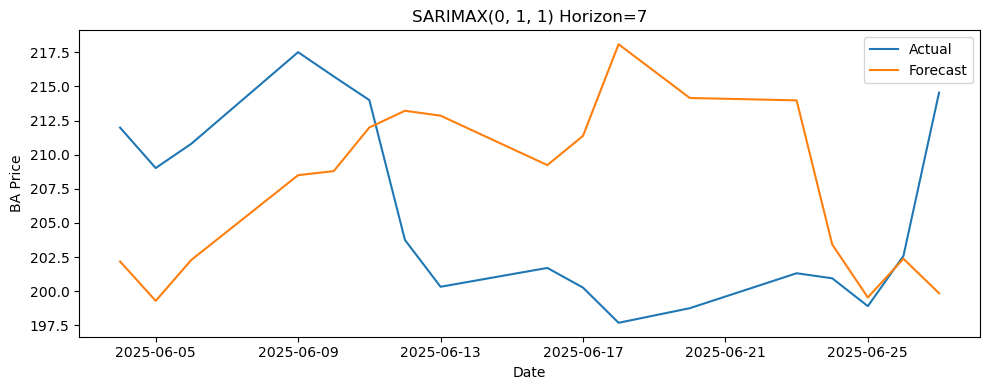

Horizon 7: RMSE=10.46, MAE=9.01, MAPE=4.39

 Metrics saved to: grouped_arimax_2025.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(0, 1, 1)",1,4.205013,3.129794,1.506590,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."
1,"SARIMAX(0, 1, 1)",3,6.997323,5.606213,2.708357,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."
2,"SARIMAX(0, 1, 1)",7,10.462749,9.009915,4.393223,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."


In [110]:
# grouped exo variables 
rolling_forecast_sarimax_with_metrics(
    target_df=df['BA'],           # original data, with raw BA values
    exog_df=df_diff,        # differenced exogenous variables.. if stationary, not diff-ed 
    exog_lags=exog_lags,
    model_order=(0, 1, 1),
    forecast_horizons=[1, 3, 7],
    train_end_date = "2025-05-23",
    test_start_date = "2025-05-27" ,
    seasonal_order=None,
    output_csv_path="grouped_arimax_2025.csv",
    plot=True,
    append_csv=True
)

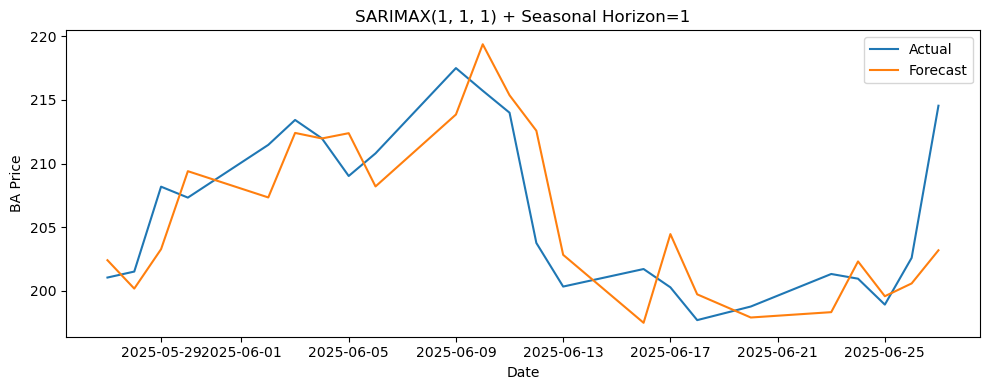

Horizon 1: RMSE=3.99, MAE=3.07, MAPE=1.48


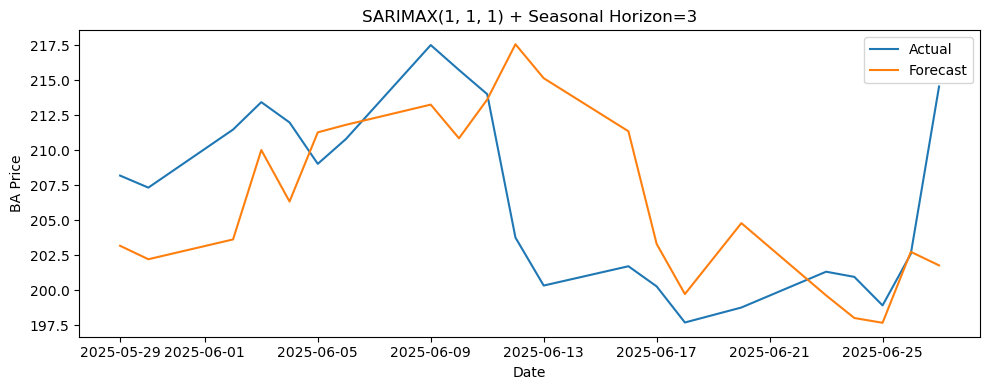

Horizon 3: RMSE=6.67, MAE=5.15, MAPE=2.49


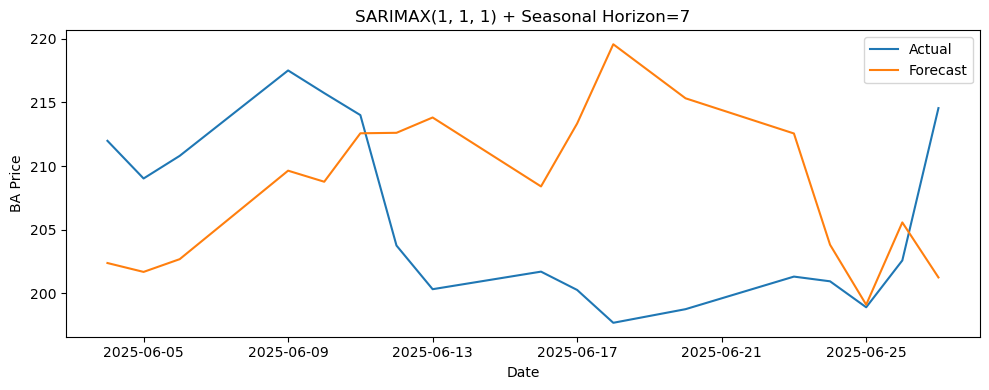

Horizon 7: RMSE=10.50, MAE=8.97, MAPE=4.39

 Metrics saved to: grouped_arimax_2025.csv


,model,horizon,rmse,mae,mape,exog_vars
0,"SARIMAX(1, 1, 1) + Season(1, 0, 0, 30)",1,3.991209,3.068325,1.479826,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."
1,"SARIMAX(1, 1, 1) + Season(1, 0, 0, 30)",3,6.672486,5.145142,2.491621,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."
2,"SARIMAX(1, 1, 1) + Season(1, 0, 0, 30)",7,10.503525,8.972657,4.385335,"^VIX_lag11,^TNX_lag25,ITA_lag14,XLI_lag24,SLX_..."


In [111]:
# grouped exo variables - seasonal
rolling_forecast_sarimax_with_metrics(
    target_df=df['BA'],           # original data, with raw BA values
    exog_df=df_diff,        # differenced exogenous variables.. if stationary, not diff-ed 
    exog_lags=exog_lags,
    model_order=(1, 1, 1),
    forecast_horizons=[1, 3, 7],
    train_end_date = "2025-05-23",
    test_start_date = "2025-05-27" ,
    seasonal_order=(1,0,0,30),
    output_csv_path="grouped_arimax_2025.csv",
    plot=True,
    append_csv=True
)

### Evaluation exo variables individually

In [114]:
# One-by-one exogenous variable SARIMAX evaluation with metrics + seasonal + plots + CSV
def evaluate_single_exog_var_with_metrics(
    target_df,                  # original data, raw BA
    exog_df,                    # differenced/stationary exogenous input
    var_name,
    lag,
    model_order,
    forecast_horizons,
    train_end_date,
    test_start_date,
    output_csv_path,
    seasonal_order=None,
    append_csv=True,
    plot=True
):
    target_df = target_df.copy()
    target_df.index = pd.to_datetime(target_df.index)
    target_df = target_df.asfreq('B')

    exog_df = exog_df.copy()
    exog_df.index = pd.to_datetime(exog_df.index)
    exog_df = exog_df.asfreq('B')

    lagged_col = f'{var_name}_lag{lag}'
    exog_df[lagged_col] = exog_df[var_name].shift(lag)
    exog_df.dropna(inplace=True)

    exog = exog_df[[lagged_col]]
    target = target_df['BA'].loc[exog_df.index]  # align with lagged exog

    train_y = target[target.index <= train_end_date]
    test_y = target[target.index >= test_start_date]
    train_X = exog[exog.index <= train_end_date]
    test_X = exog[exog.index >= test_start_date]

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(0, len(test_y) - h + 1):
            y_train = pd.concat([train_y, test_y.iloc[:i]])
            X_train = pd.concat([train_X, test_X.iloc[:i]])
            X_forecast = test_X.iloc[i:i + h]

            try:
                model = SARIMAX(
                    y_train,
                    exog=X_train,
                    order=model_order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                results = model.fit(disp=False)
                forecast = results.get_forecast(steps=h, exog=X_forecast)
                pred = forecast.predicted_mean.iloc[-1]
                actual = test_y.iloc[i + h - 1]

                if not np.isnan(pred) and not np.isnan(actual):
                    preds.append(pred)
                    actuals.append(actual)
                    dates.append(test_y.index[i + h - 1])
            except:
                continue

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"{var_name} (lag={lag}) - Horizon {h} | RMSE: {rmse:.2f}, MAE: {mae:.2f}, MAPE: {mape:.2f}%")

            all_metrics.append({
                'model': f"SARIMAX{model_order}" + (f" + Season{seasonal_order}" if seasonal_order else ""),
                'exog_var': var_name,
                'lag': lag,
                'horizon': h,
                'rmse': rmse,
                'mae': mae,
                'mape': mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label='Actual')
                plt.plot(dates, preds, label='Forecast')
                plt.title(f"{var_name} (lag={lag}) Horizon={h}{' + Seasonal' if seasonal_order else ''}")
                plt.xlabel("Date")
                plt.ylabel("BA Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

    df_metrics = pd.DataFrame(all_metrics)
    if append_csv and os.path.exists(output_csv_path):
        df_existing = pd.read_csv(output_csv_path)
        df_combined = pd.concat([df_existing, df_metrics], ignore_index=True)
        df_combined.to_csv(output_csv_path, index=False)
    else:
        df_metrics.to_csv(output_csv_path, index=False)

    print(f"\n Metrics for {var_name} saved to: {output_csv_path}")
    return df_metrics

^VIX (lag=11) - Horizon 1 | RMSE: 4.33, MAE: 3.18, MAPE: 1.53%


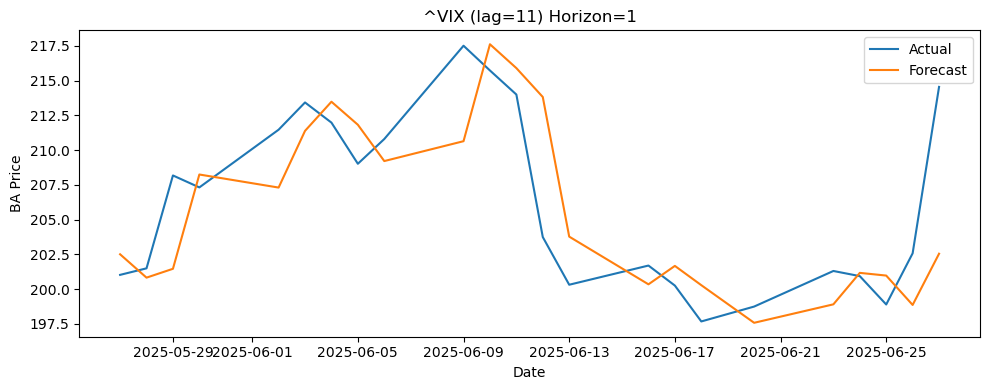

^VIX (lag=11) - Horizon 3 | RMSE: 7.33, MAE: 5.83, MAPE: 2.81%


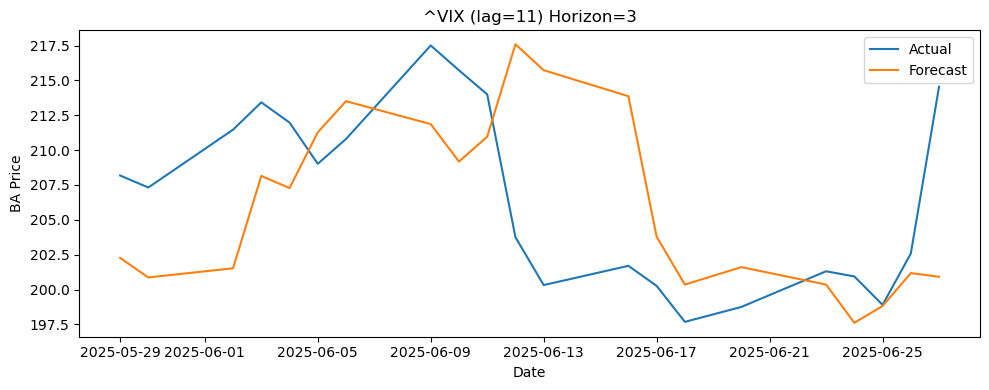

^VIX (lag=11) - Horizon 7 | RMSE: 10.50, MAE: 9.18, MAPE: 4.47%


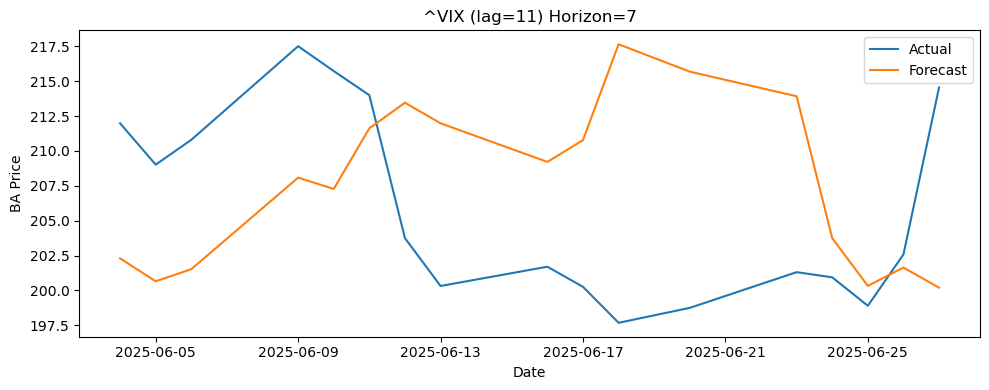


 Metrics for ^VIX saved to: exo_eval_2025.csv
^TNX (lag=25) - Horizon 1 | RMSE: 4.26, MAE: 3.17, MAPE: 1.52%


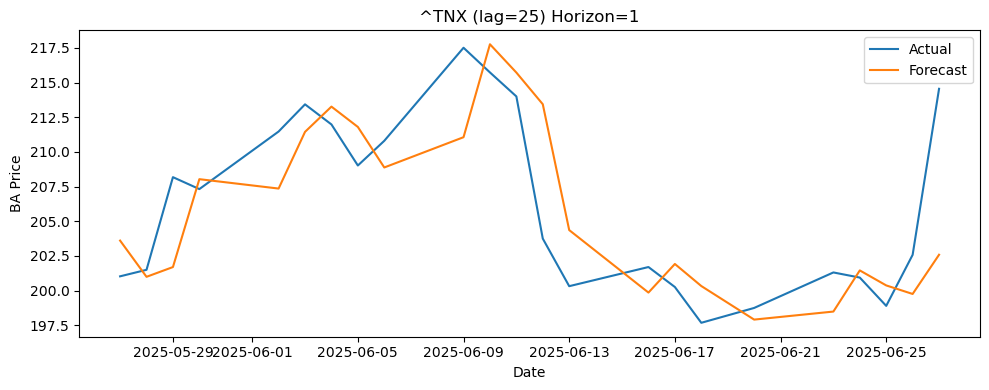

^TNX (lag=25) - Horizon 3 | RMSE: 7.14, MAE: 5.67, MAPE: 2.74%


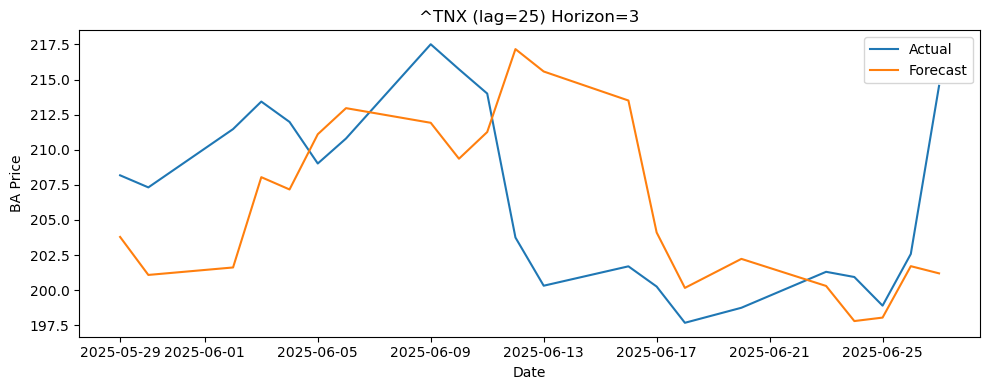

^TNX (lag=25) - Horizon 7 | RMSE: 10.35, MAE: 8.99, MAPE: 4.38%


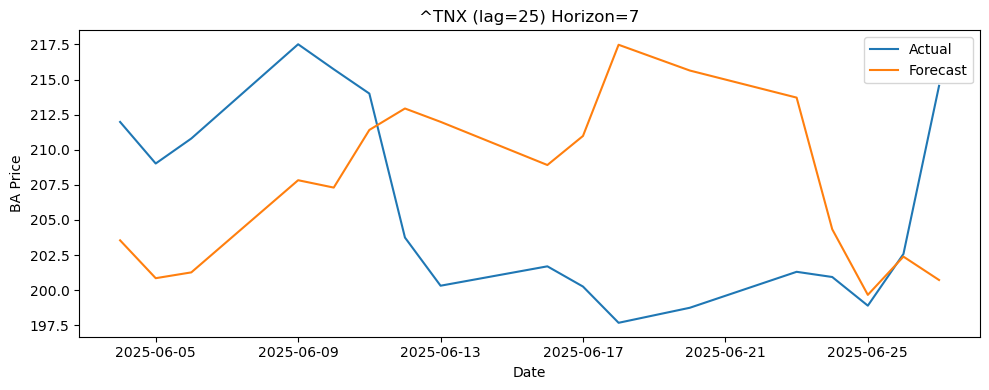


 Metrics for ^TNX saved to: exo_eval_2025.csv
ITA (lag=14) - Horizon 1 | RMSE: 4.26, MAE: 3.18, MAPE: 1.53%


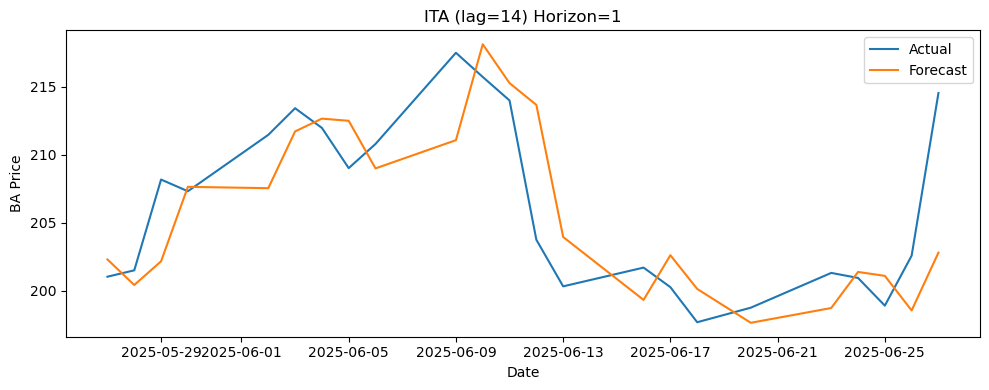

ITA (lag=14) - Horizon 3 | RMSE: 7.11, MAE: 5.69, MAPE: 2.75%


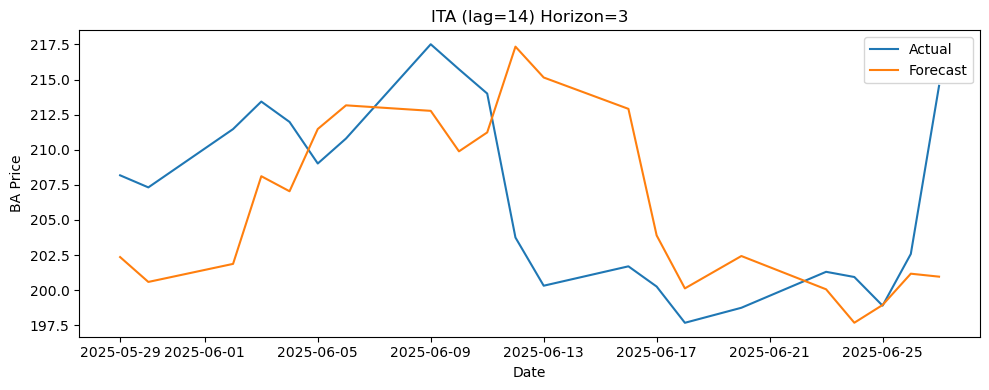

ITA (lag=14) - Horizon 7 | RMSE: 10.36, MAE: 8.99, MAPE: 4.38%


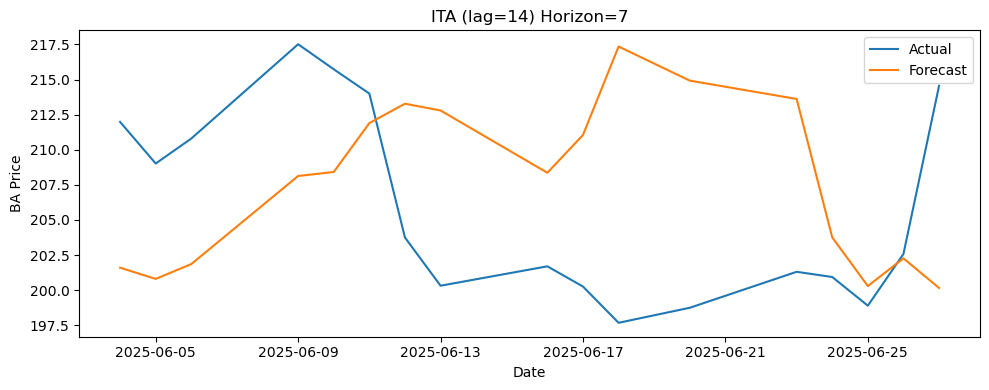


 Metrics for ITA saved to: exo_eval_2025.csv
XLI (lag=24) - Horizon 1 | RMSE: 4.32, MAE: 3.13, MAPE: 1.51%


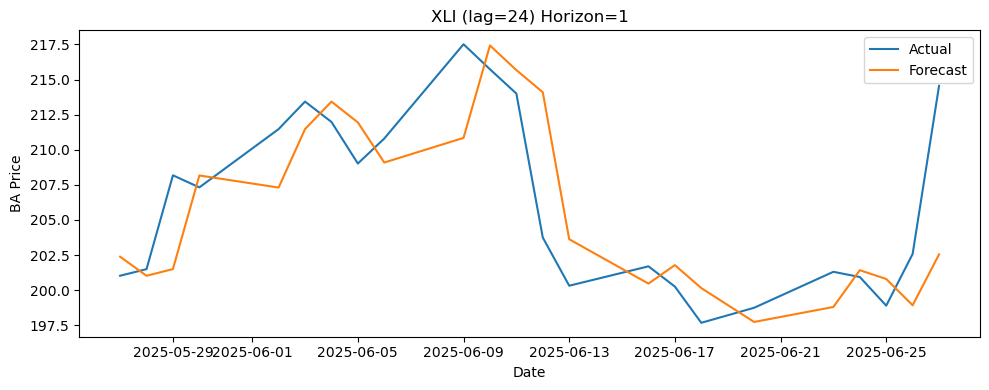

XLI (lag=24) - Horizon 3 | RMSE: 7.31, MAE: 5.82, MAPE: 2.81%


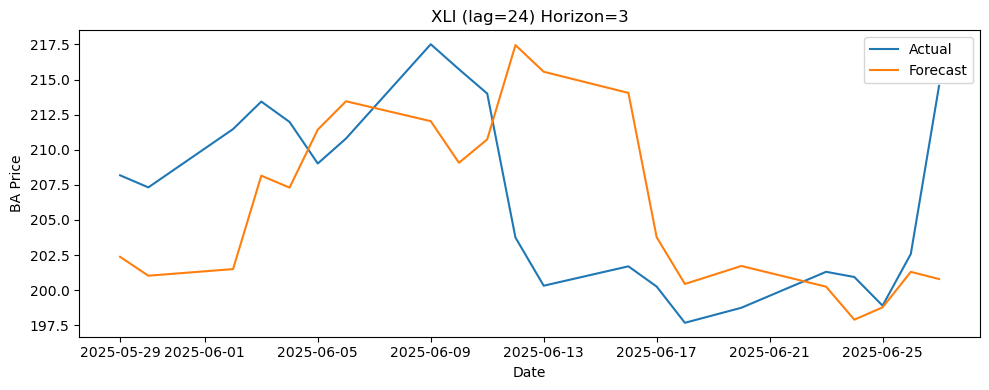

XLI (lag=24) - Horizon 7 | RMSE: 10.45, MAE: 9.15, MAPE: 4.46%


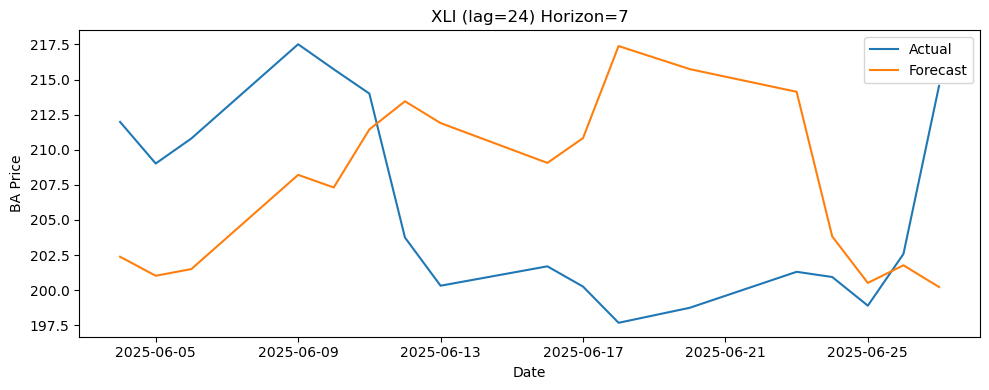


 Metrics for XLI saved to: exo_eval_2025.csv
SLX (lag=10) - Horizon 1 | RMSE: 4.33, MAE: 3.15, MAPE: 1.51%


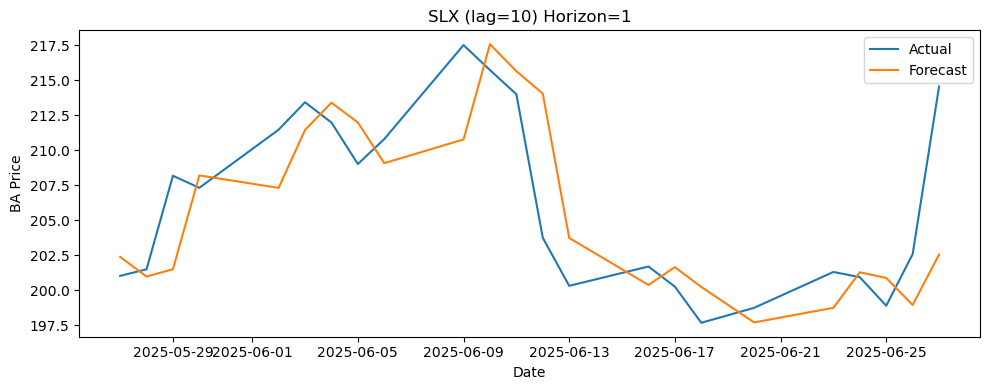

SLX (lag=10) - Horizon 3 | RMSE: 7.32, MAE: 5.84, MAPE: 2.82%


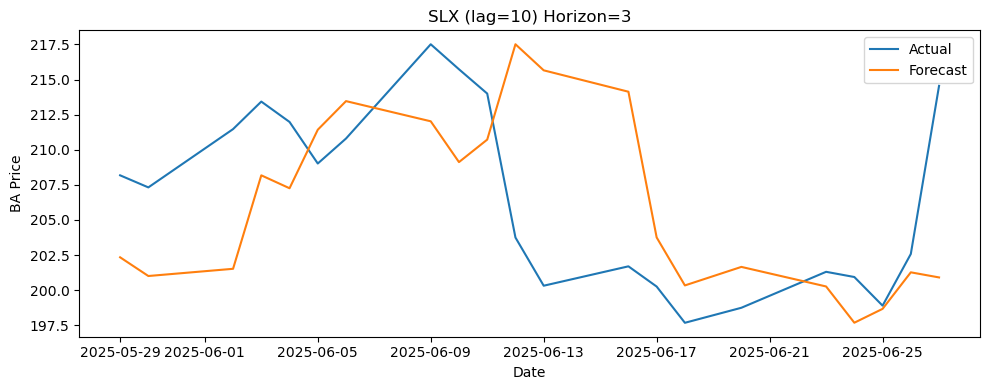

SLX (lag=10) - Horizon 7 | RMSE: 10.47, MAE: 9.16, MAPE: 4.46%


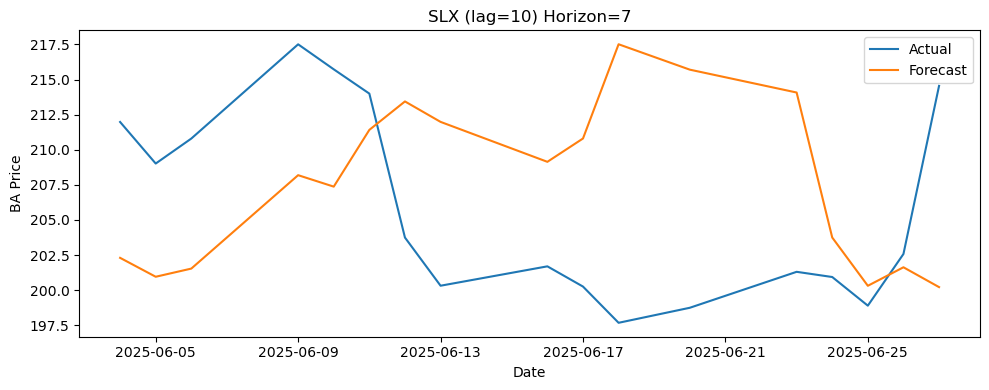


 Metrics for SLX saved to: exo_eval_2025.csv


In [115]:
for var, lag in exog_lags.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original BA data
        exog_df=df_diff,                # stationary exog inputs
        var_name=var,
        lag=lag,
        model_order=(0, 1, 0),
        forecast_horizons=[1, 3, 7],
        train_end_date="2025-05-23",
        test_start_date="2025-05-27",
        output_csv_path="exo_eval_2025.csv",
        seasonal_order=None,
        append_csv=True,
        plot=True
    )

^VIX (lag=11) - Horizon 1 | RMSE: 4.27, MAE: 3.24, MAPE: 1.56%


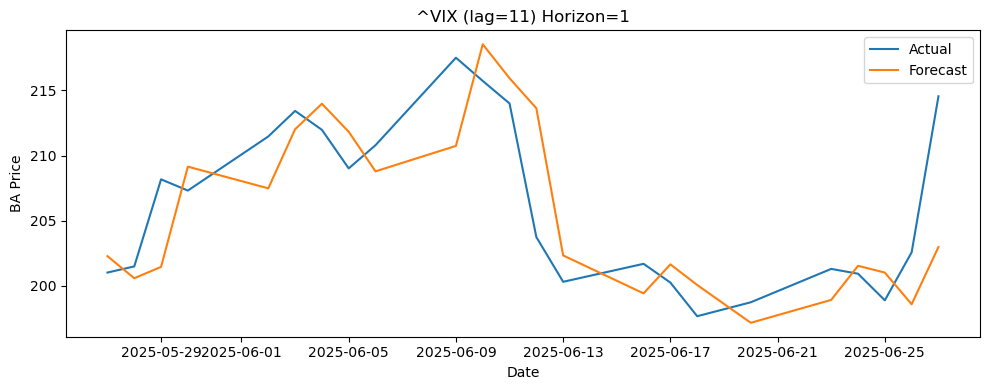

^VIX (lag=11) - Horizon 3 | RMSE: 7.46, MAE: 5.80, MAPE: 2.80%


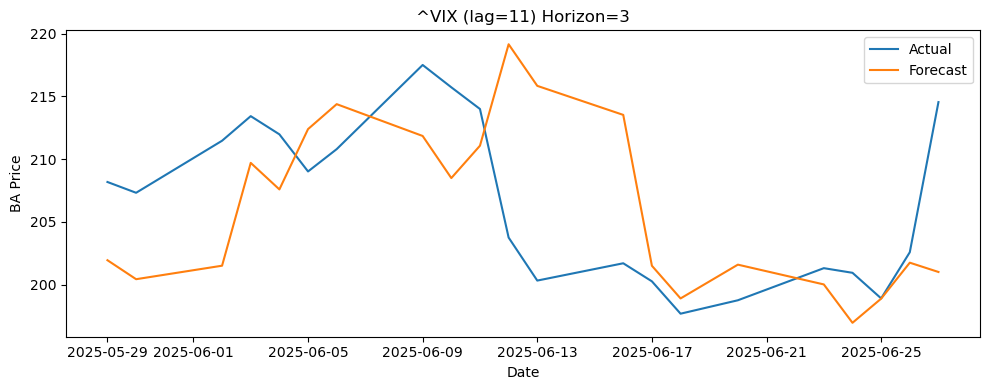

^VIX (lag=11) - Horizon 7 | RMSE: 10.65, MAE: 8.94, MAPE: 4.36%


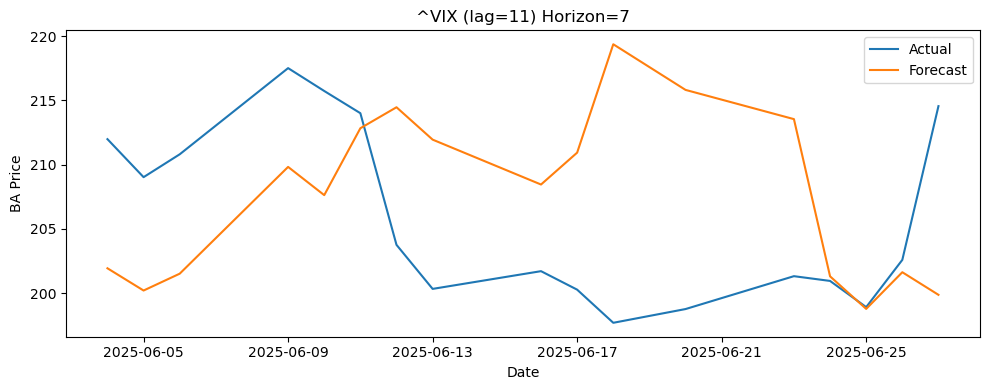


 Metrics for ^VIX saved to: exo_eval_2025.csv
^TNX (lag=25) - Horizon 1 | RMSE: 4.22, MAE: 3.25, MAPE: 1.57%


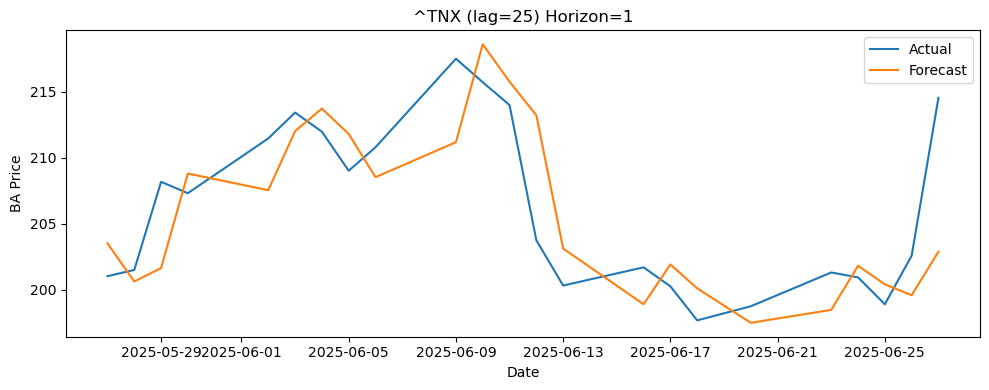

^TNX (lag=25) - Horizon 3 | RMSE: 7.25, MAE: 5.64, MAPE: 2.72%


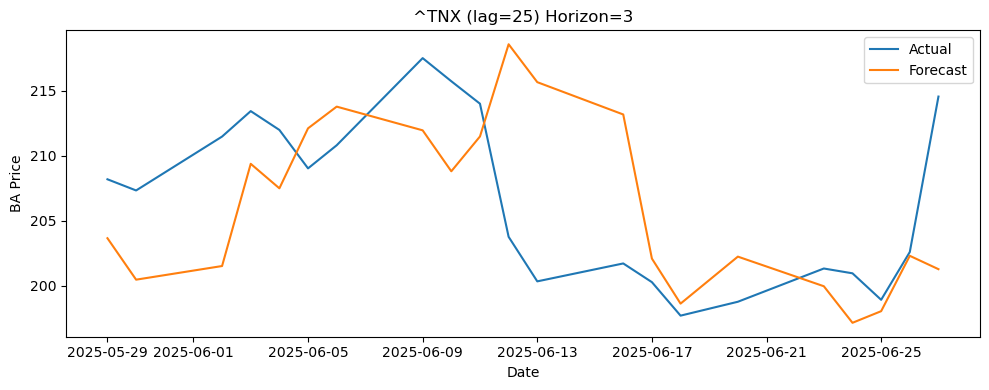

^TNX (lag=25) - Horizon 7 | RMSE: 10.52, MAE: 8.89, MAPE: 4.34%


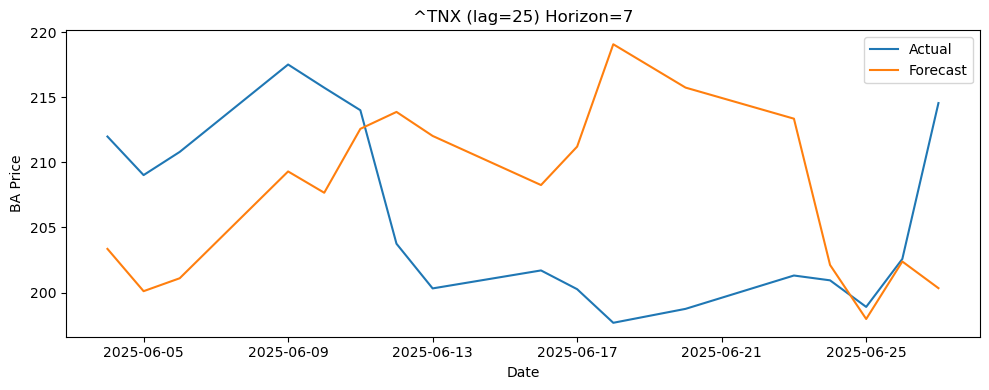


 Metrics for ^TNX saved to: exo_eval_2025.csv
ITA (lag=14) - Horizon 1 | RMSE: 4.22, MAE: 3.23, MAPE: 1.56%


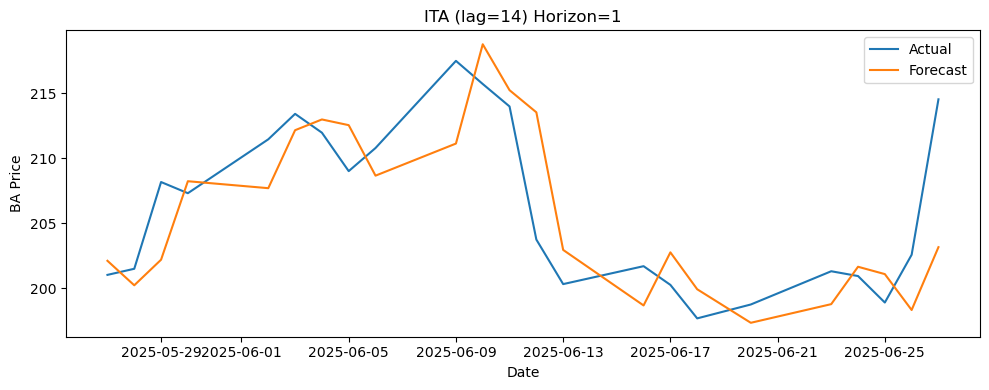

ITA (lag=14) - Horizon 3 | RMSE: 7.19, MAE: 5.69, MAPE: 2.75%


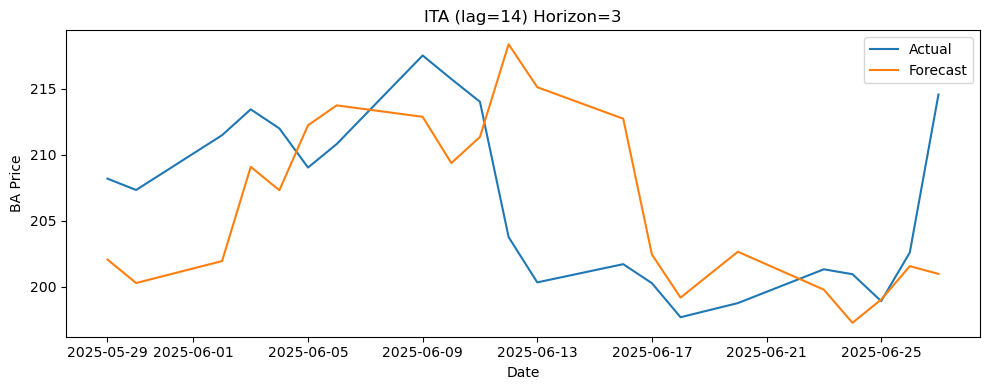

ITA (lag=14) - Horizon 7 | RMSE: 10.46, MAE: 8.82, MAPE: 4.30%


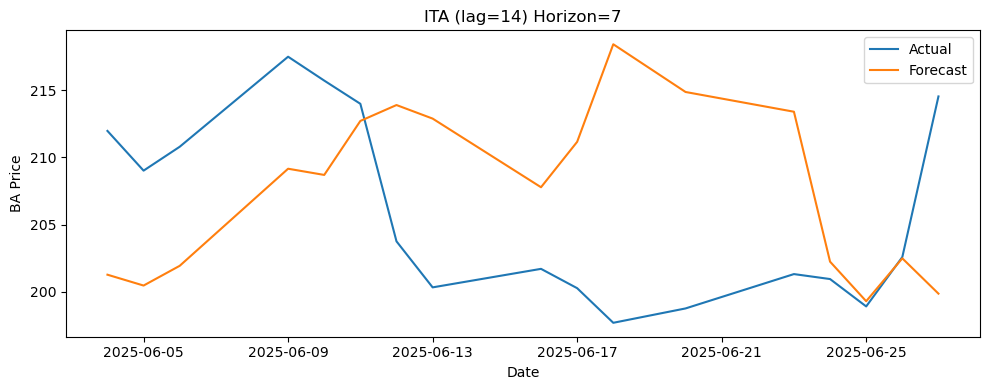


 Metrics for ITA saved to: exo_eval_2025.csv
XLI (lag=24) - Horizon 1 | RMSE: 4.24, MAE: 3.16, MAPE: 1.52%


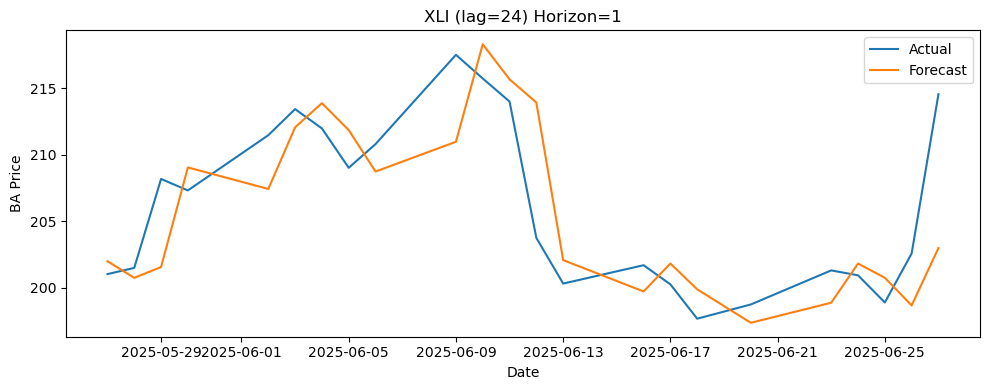

XLI (lag=24) - Horizon 3 | RMSE: 7.42, MAE: 5.80, MAPE: 2.80%


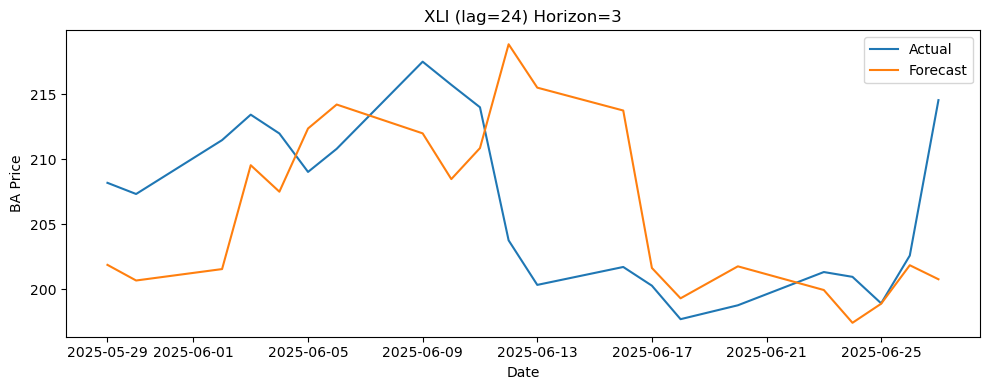

XLI (lag=24) - Horizon 7 | RMSE: 10.58, MAE: 8.94, MAPE: 4.36%


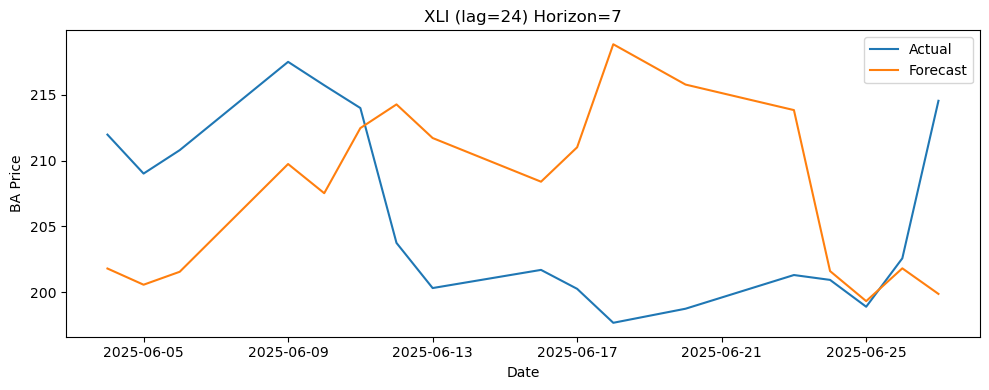


 Metrics for XLI saved to: exo_eval_2025.csv
SLX (lag=10) - Horizon 1 | RMSE: 4.30, MAE: 3.21, MAPE: 1.54%


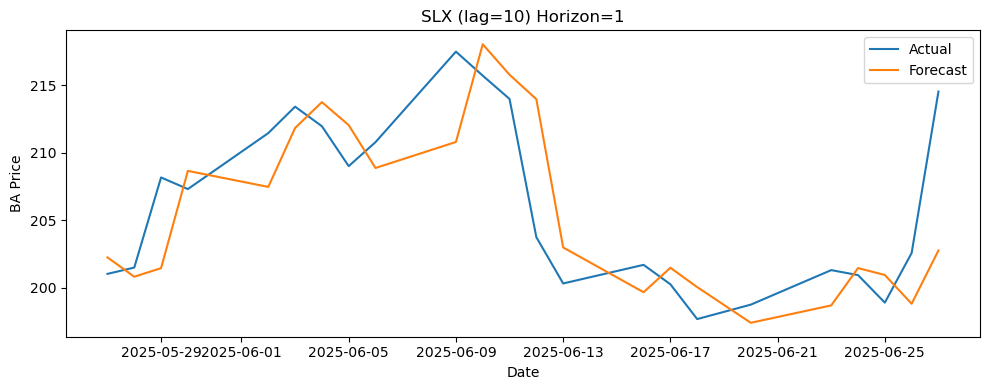

SLX (lag=10) - Horizon 3 | RMSE: 7.41, MAE: 5.83, MAPE: 2.81%


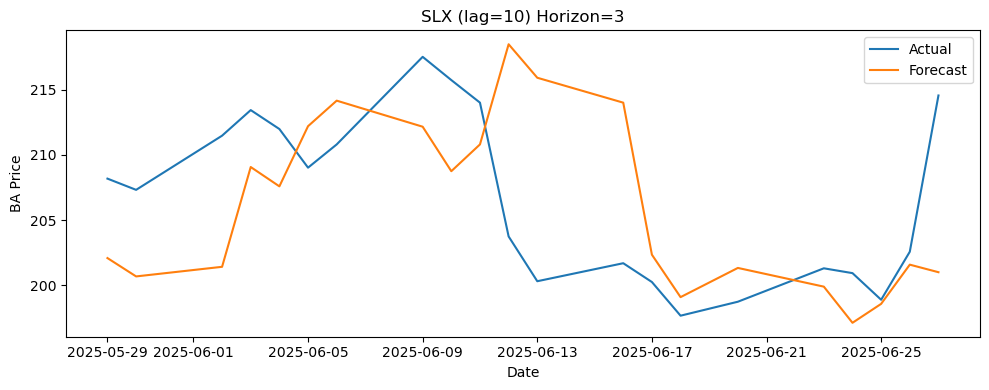

SLX (lag=10) - Horizon 7 | RMSE: 10.64, MAE: 9.05, MAPE: 4.41%


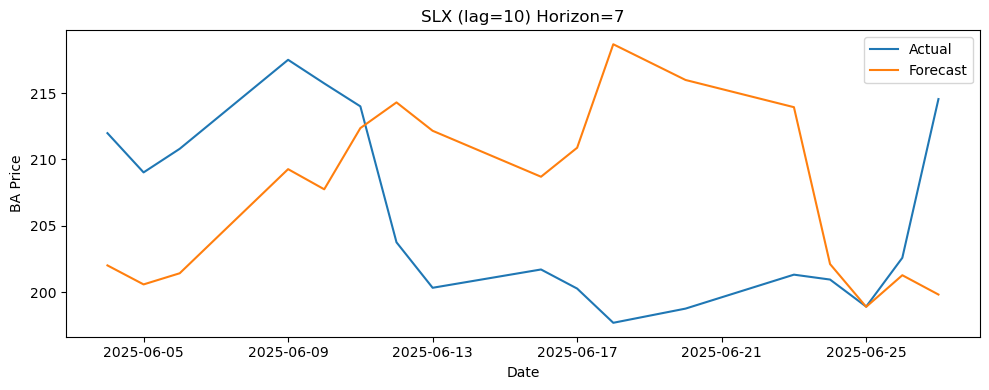


 Metrics for SLX saved to: exo_eval_2025.csv


In [116]:
for var, lag in exog_lags.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original BA data
        exog_df=df_diff,                # stationary exog inputs
        var_name=var,
        lag=lag,
        model_order=(1, 1, 1),
        forecast_horizons=[1, 3, 7],
        train_end_date="2025-05-23",
        test_start_date="2025-05-27",
        output_csv_path="exo_eval_2025.csv",
        seasonal_order=None,
        append_csv=True,
        plot=True
    )

^VIX (lag=11) - Horizon 1 | RMSE: 4.23, MAE: 3.20, MAPE: 1.54%


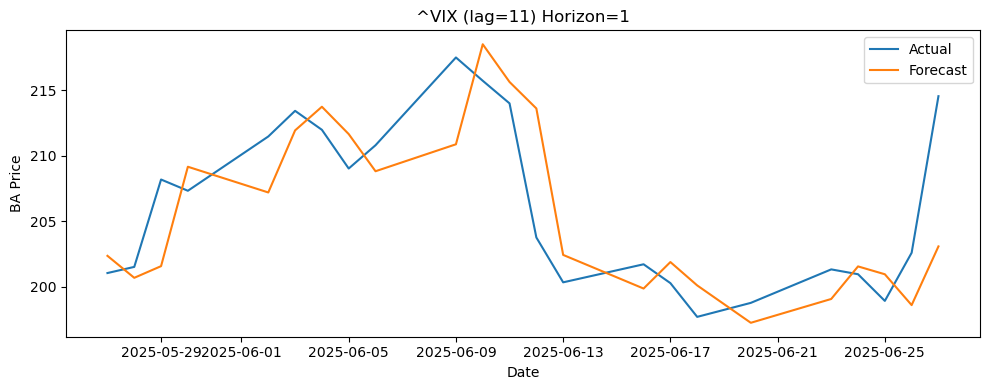

^VIX (lag=11) - Horizon 3 | RMSE: 7.38, MAE: 5.81, MAPE: 2.80%


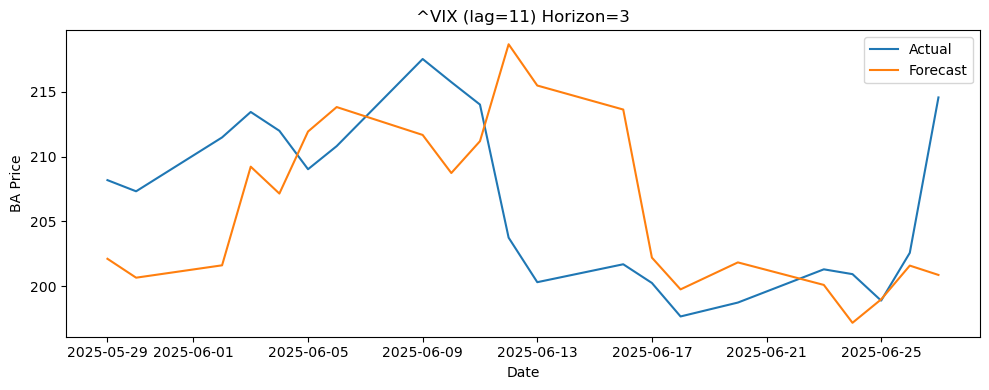

^VIX (lag=11) - Horizon 7 | RMSE: 10.53, MAE: 9.00, MAPE: 4.39%


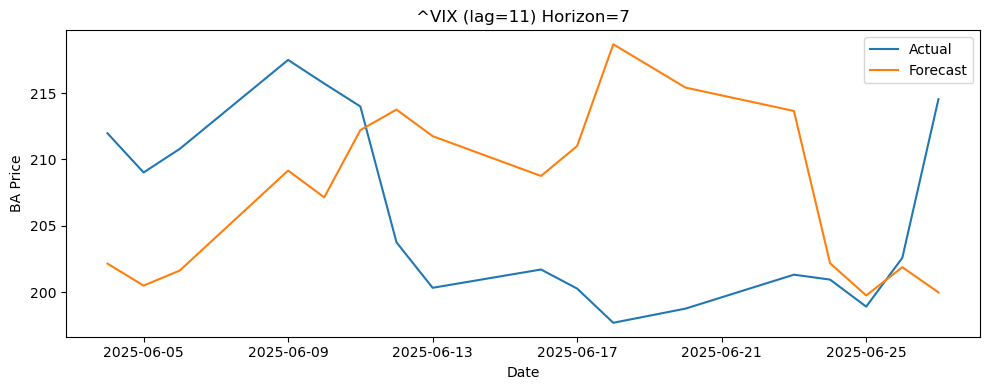


 Metrics for ^VIX saved to: exo_eval_2025.csv
^TNX (lag=25) - Horizon 1 | RMSE: 4.19, MAE: 3.22, MAPE: 1.55%


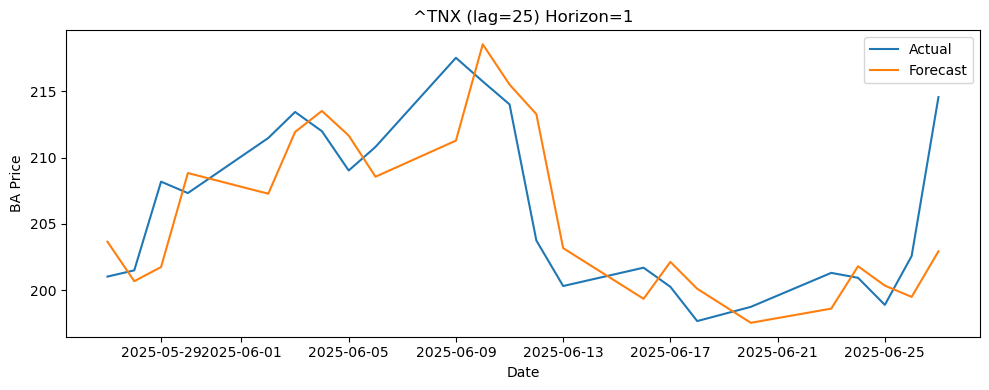

^TNX (lag=25) - Horizon 3 | RMSE: 7.19, MAE: 5.65, MAPE: 2.73%


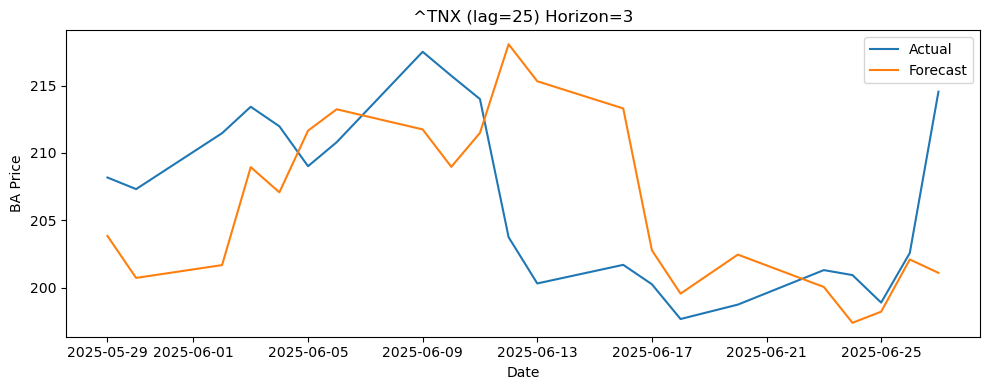

^TNX (lag=25) - Horizon 7 | RMSE: 10.38, MAE: 8.84, MAPE: 4.31%


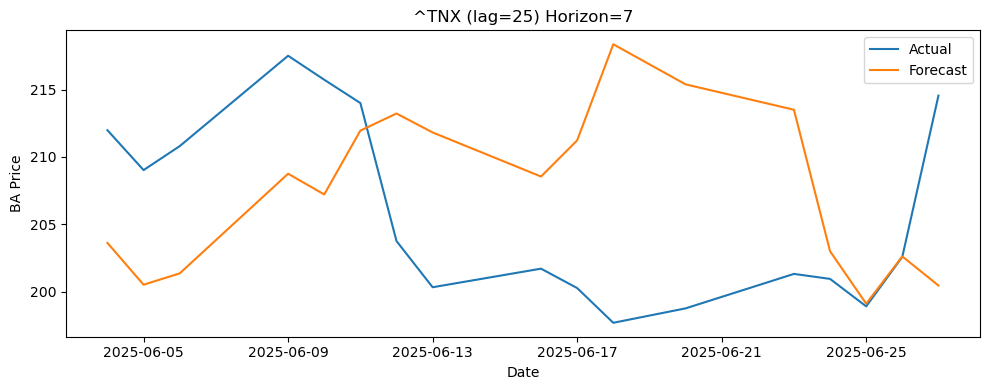


 Metrics for ^TNX saved to: exo_eval_2025.csv
ITA (lag=14) - Horizon 1 | RMSE: 4.20, MAE: 3.20, MAPE: 1.54%


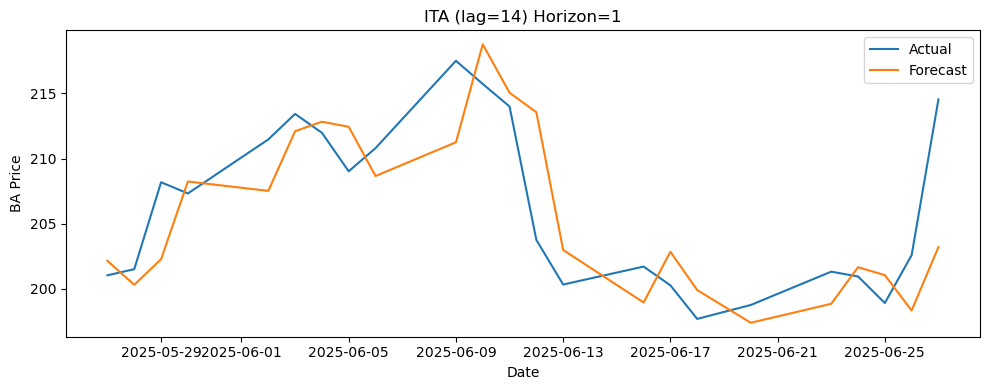

ITA (lag=14) - Horizon 3 | RMSE: 7.14, MAE: 5.69, MAPE: 2.75%


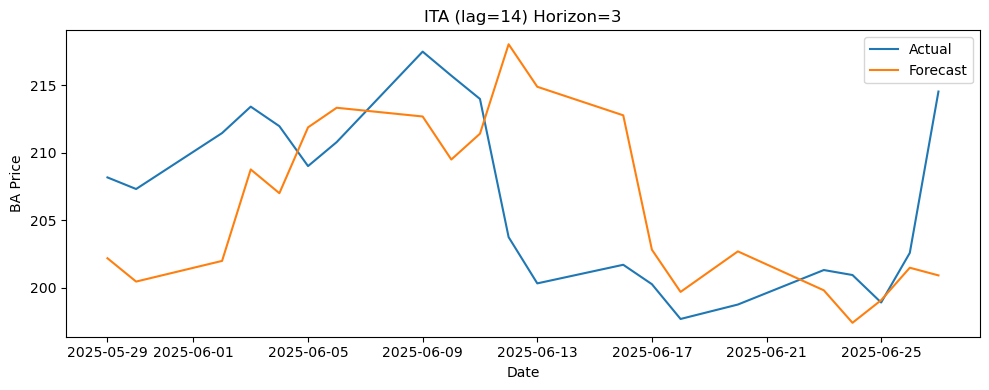

ITA (lag=14) - Horizon 7 | RMSE: 10.39, MAE: 8.87, MAPE: 4.32%


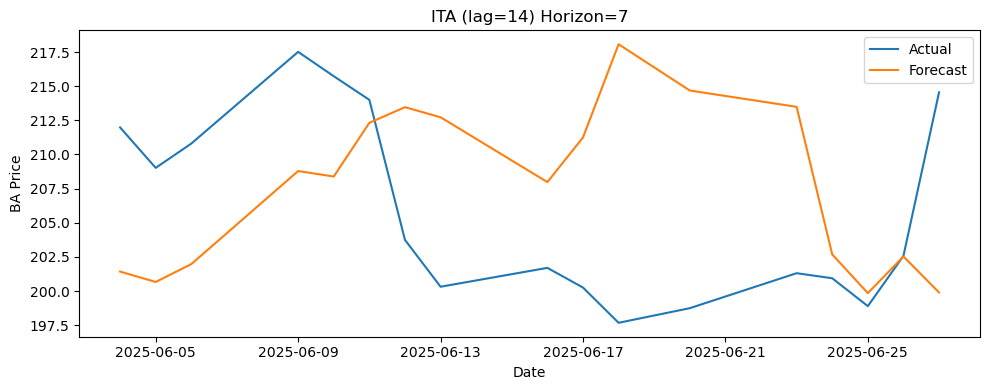


 Metrics for ITA saved to: exo_eval_2025.csv
XLI (lag=24) - Horizon 1 | RMSE: 4.21, MAE: 3.12, MAPE: 1.50%


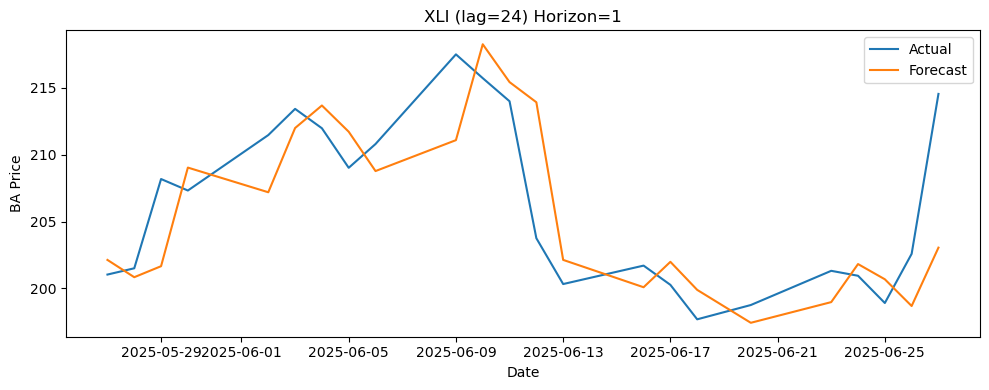

XLI (lag=24) - Horizon 3 | RMSE: 7.35, MAE: 5.79, MAPE: 2.79%


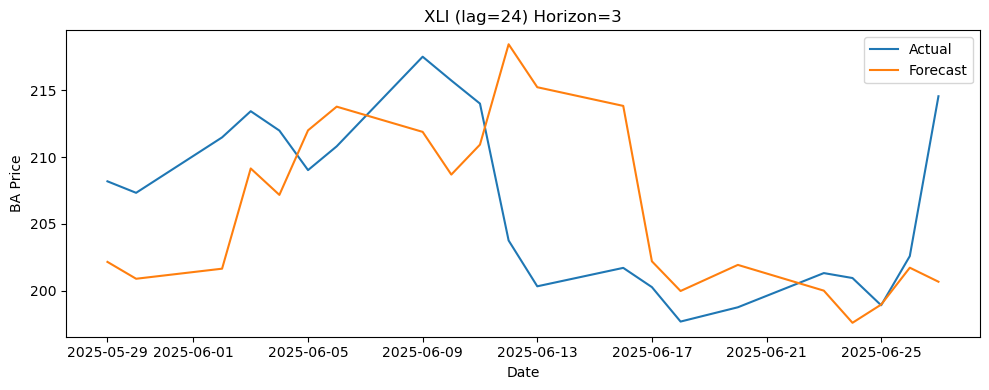

XLI (lag=24) - Horizon 7 | RMSE: 10.49, MAE: 8.99, MAPE: 4.38%


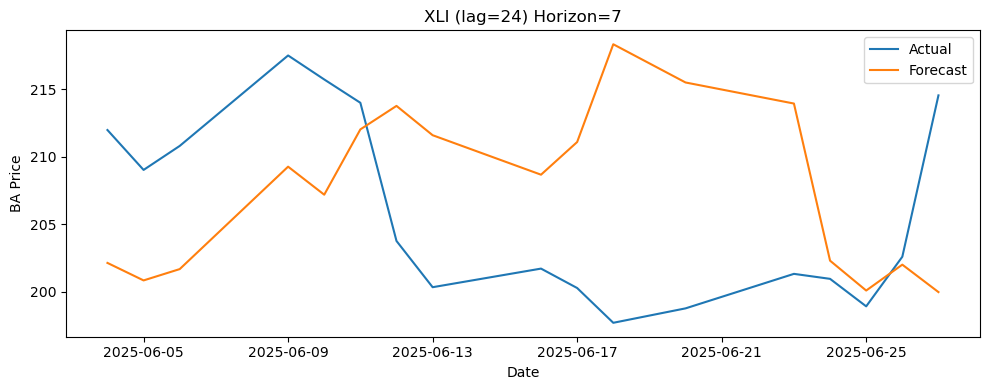


 Metrics for XLI saved to: exo_eval_2025.csv
SLX (lag=10) - Horizon 1 | RMSE: 4.29, MAE: 3.17, MAPE: 1.52%


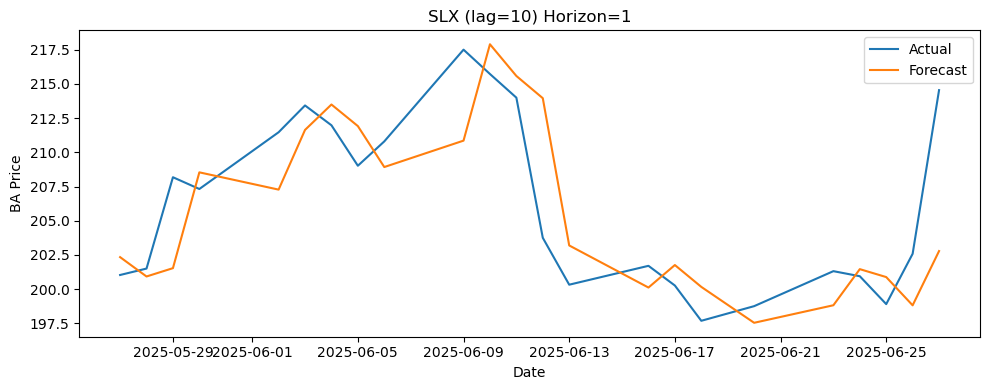

SLX (lag=10) - Horizon 3 | RMSE: 7.34, MAE: 5.82, MAPE: 2.81%


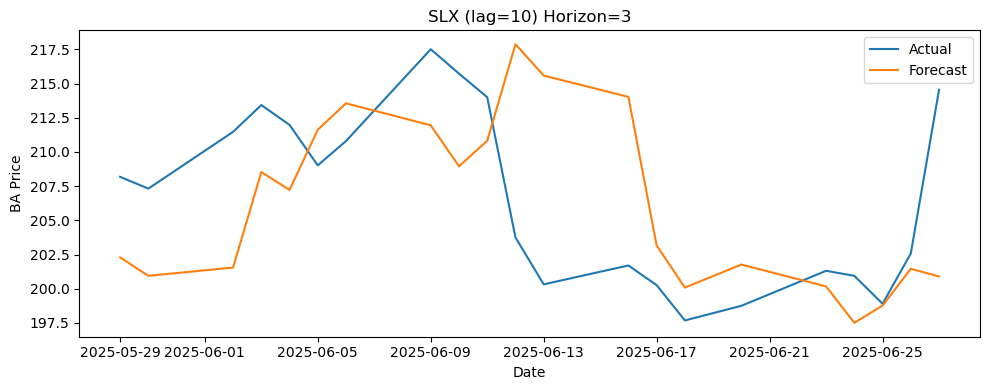

SLX (lag=10) - Horizon 7 | RMSE: 10.48, MAE: 9.09, MAPE: 4.43%


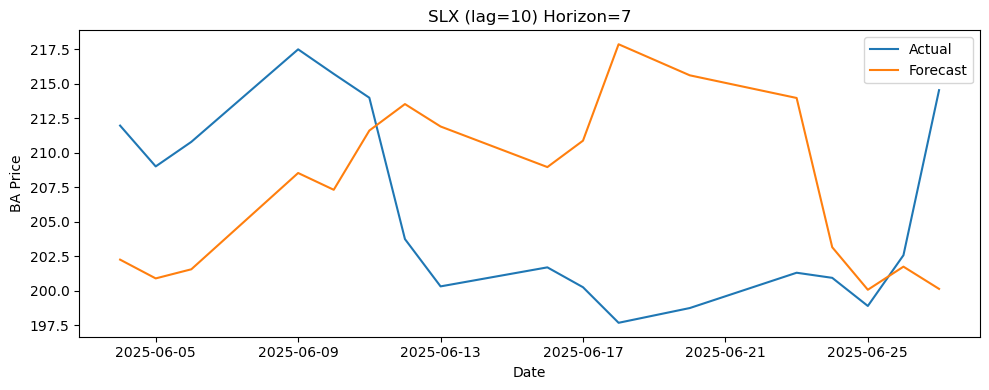


 Metrics for SLX saved to: exo_eval_2025.csv


In [118]:
for var, lag in exog_lags.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original BA data
        exog_df=df_diff,                # stationary exog inputs
        var_name=var,
        lag=lag,
        model_order=(1, 1, 0),
        forecast_horizons=[1, 3, 7],
        train_end_date="2025-05-23",
        test_start_date="2025-05-27",
        output_csv_path="exo_eval_2025.csv",
        seasonal_order=None,
        append_csv=True,
        plot=True
    )

^VIX (lag=11) - Horizon 1 | RMSE: 4.23, MAE: 3.17, MAPE: 1.53%


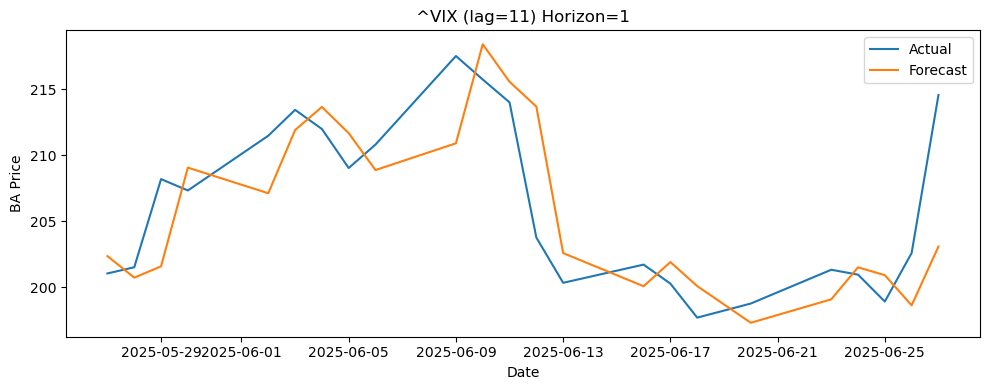

^VIX (lag=11) - Horizon 3 | RMSE: 7.36, MAE: 5.82, MAPE: 2.81%


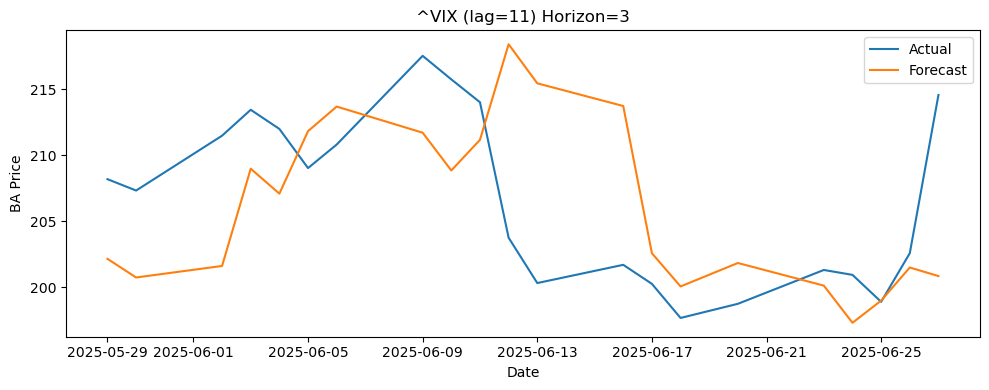

^VIX (lag=11) - Horizon 7 | RMSE: 10.51, MAE: 9.04, MAPE: 4.41%


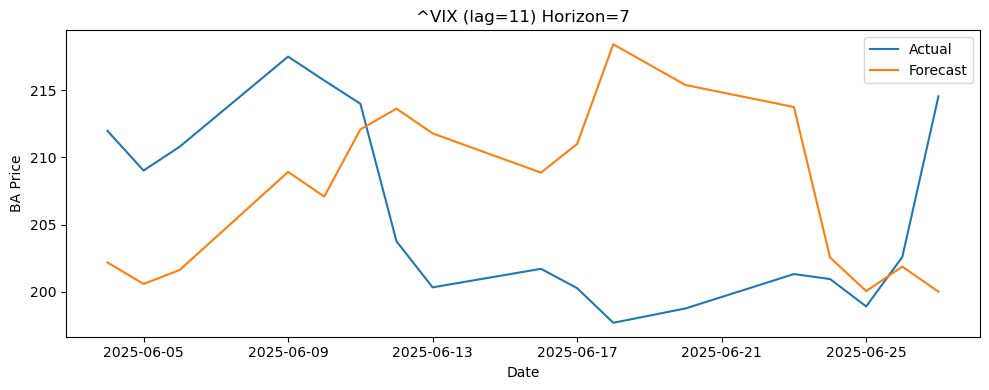


 Metrics for ^VIX saved to: exo_eval_2025.csv
^TNX (lag=25) - Horizon 1 | RMSE: 4.20, MAE: 3.20, MAPE: 1.54%


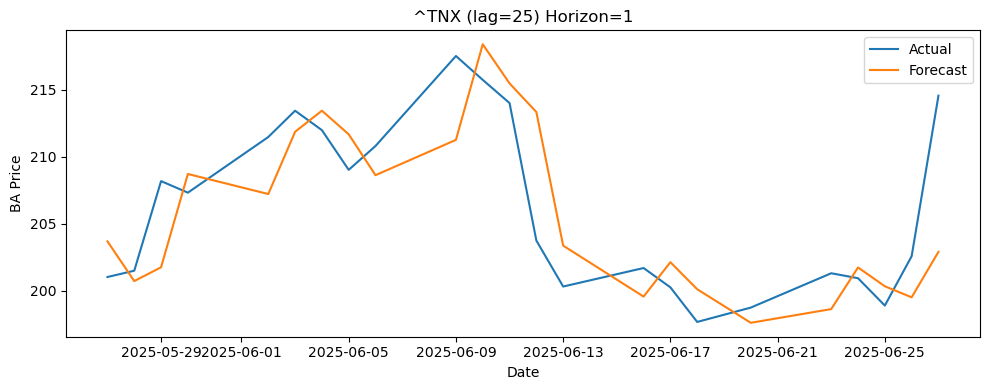

^TNX (lag=25) - Horizon 3 | RMSE: 7.17, MAE: 5.66, MAPE: 2.73%


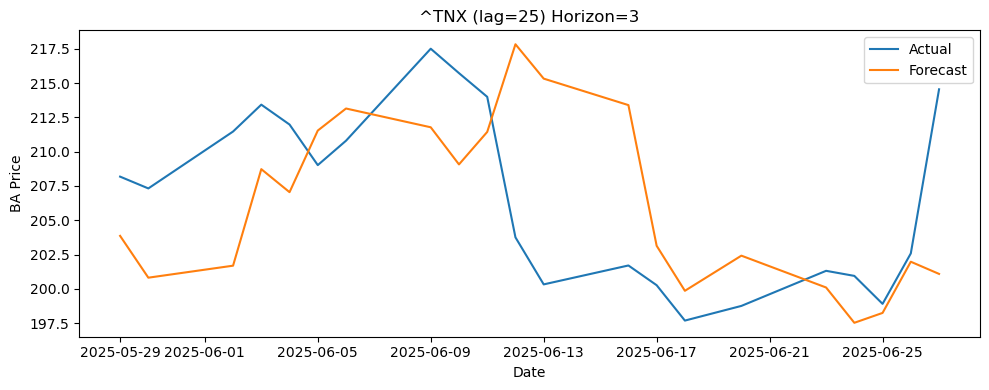

^TNX (lag=25) - Horizon 7 | RMSE: 10.36, MAE: 8.88, MAPE: 4.33%


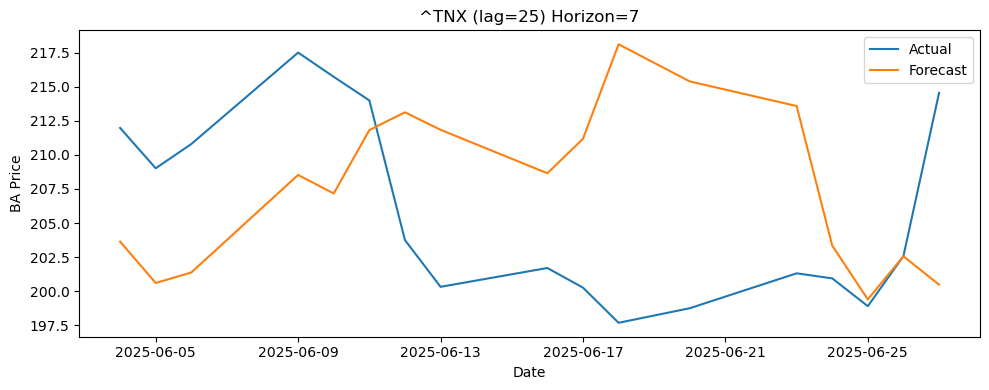


 Metrics for ^TNX saved to: exo_eval_2025.csv
ITA (lag=14) - Horizon 1 | RMSE: 4.19, MAE: 3.18, MAPE: 1.53%


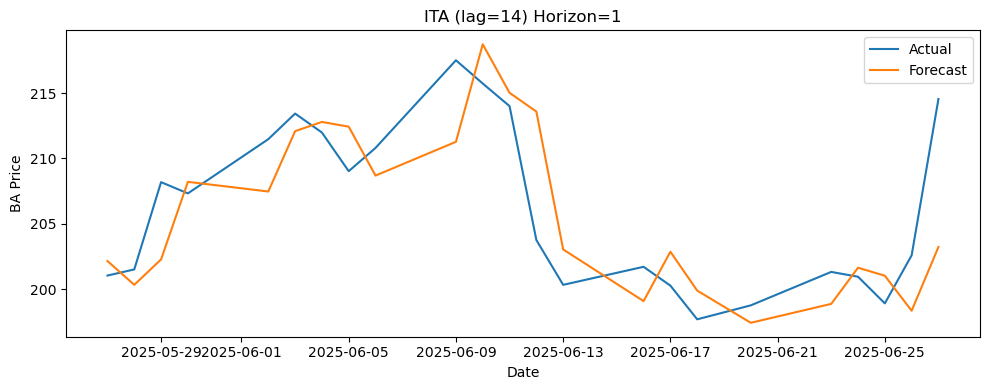

ITA (lag=14) - Horizon 3 | RMSE: 7.14, MAE: 5.70, MAPE: 2.75%


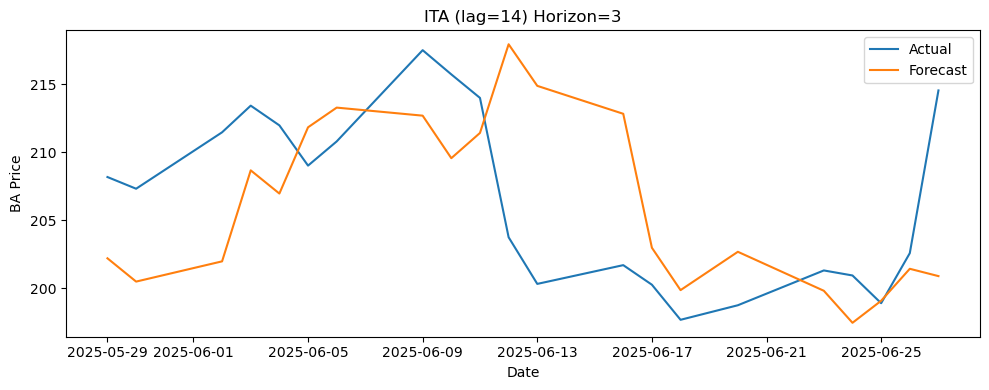

ITA (lag=14) - Horizon 7 | RMSE: 10.39, MAE: 8.89, MAPE: 4.33%


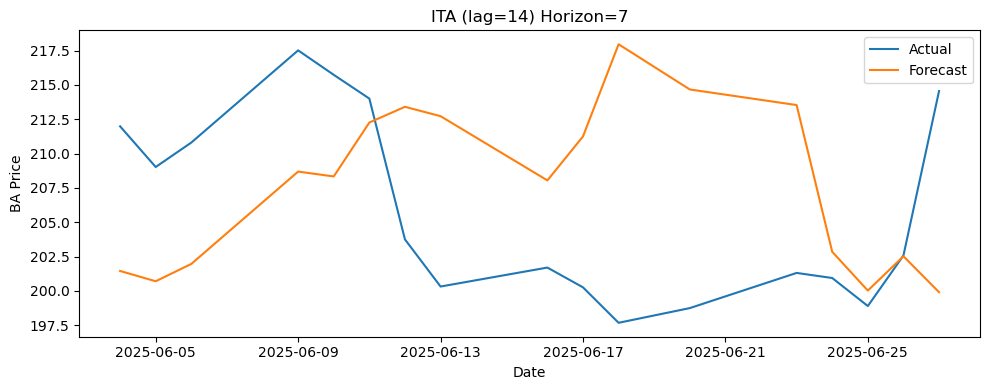


 Metrics for ITA saved to: exo_eval_2025.csv
XLI (lag=24) - Horizon 1 | RMSE: 4.21, MAE: 3.11, MAPE: 1.49%


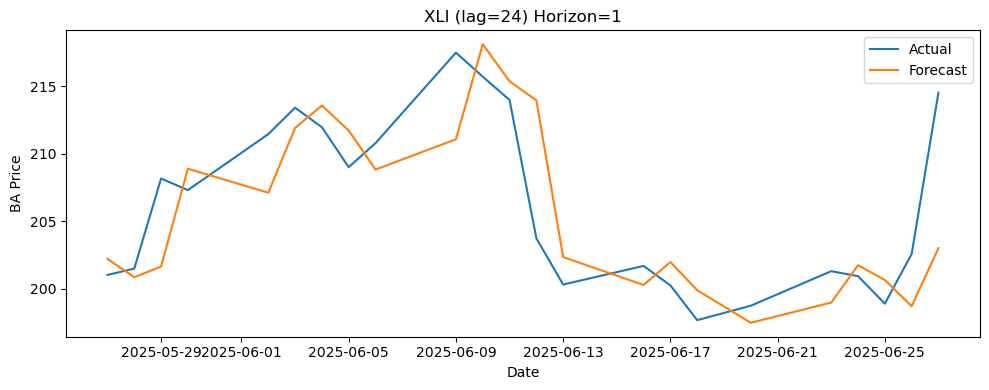

XLI (lag=24) - Horizon 3 | RMSE: 7.33, MAE: 5.80, MAPE: 2.80%


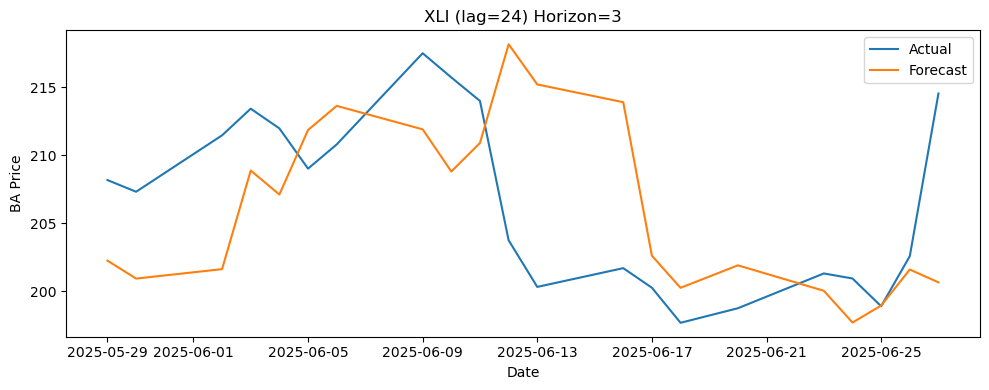

XLI (lag=24) - Horizon 7 | RMSE: 10.47, MAE: 9.03, MAPE: 4.40%


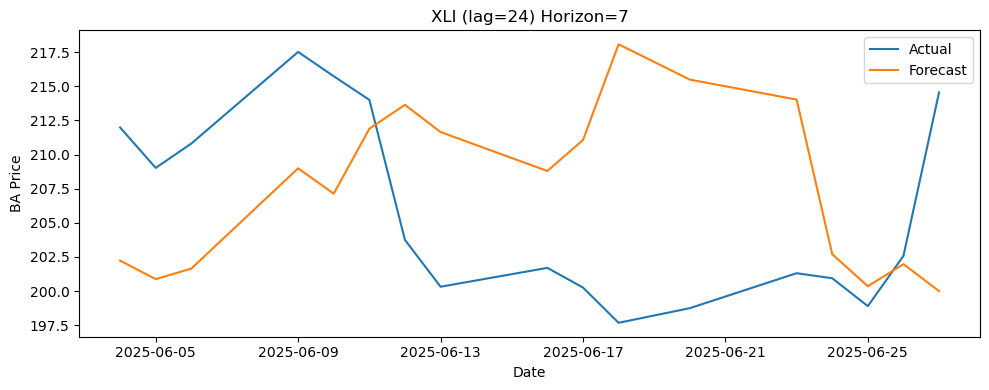


 Metrics for XLI saved to: exo_eval_2025.csv
SLX (lag=10) - Horizon 1 | RMSE: 4.29, MAE: 3.16, MAPE: 1.52%


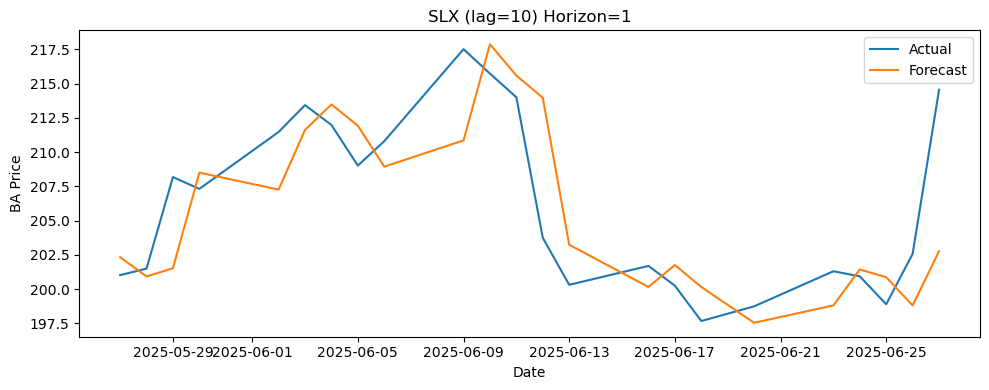

SLX (lag=10) - Horizon 3 | RMSE: 7.33, MAE: 5.82, MAPE: 2.81%


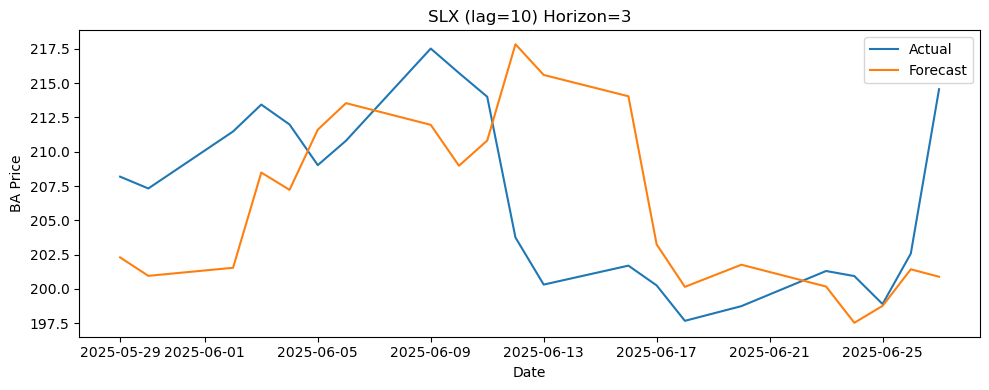

SLX (lag=10) - Horizon 7 | RMSE: 10.48, MAE: 9.10, MAPE: 4.44%


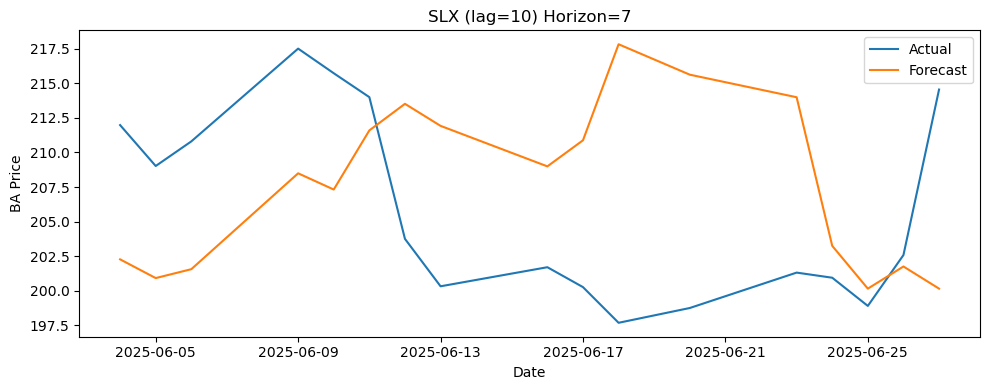


 Metrics for SLX saved to: exo_eval_2025.csv


In [119]:
for var, lag in exog_lags.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original BA data
        exog_df=df_diff,                # stationary exog inputs
        var_name=var,
        lag=lag,
        model_order=(0, 1, 1),
        forecast_horizons=[1, 3, 7],
        train_end_date="2025-05-23",
        test_start_date="2025-05-27",
        output_csv_path="exo_eval_2025.csv",
        seasonal_order=None,
        append_csv=True,
        plot=True
    )

^VIX (lag=11) - Horizon 1 | RMSE: 4.24, MAE: 3.22, MAPE: 1.55%


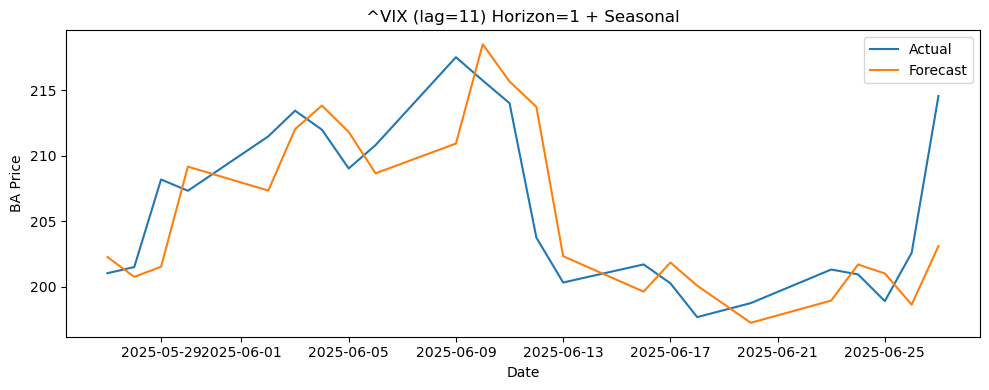

^VIX (lag=11) - Horizon 3 | RMSE: 7.38, MAE: 5.78, MAPE: 2.79%


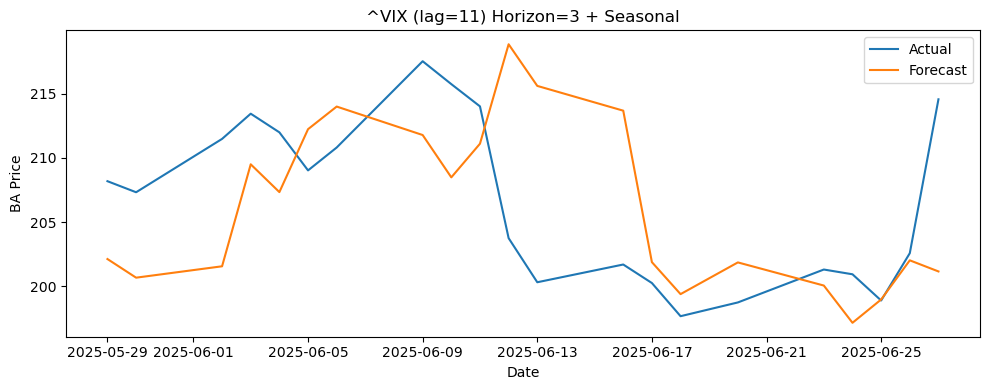

^VIX (lag=11) - Horizon 7 | RMSE: 10.54, MAE: 8.93, MAPE: 4.36%


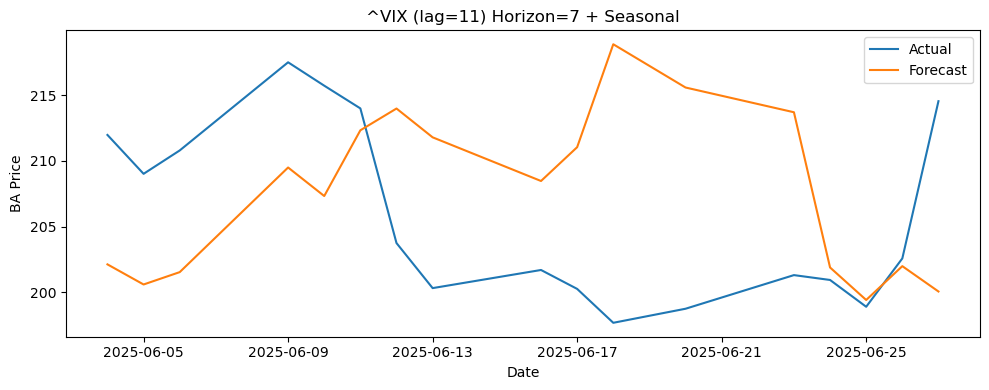


 Metrics for ^VIX saved to: exo_eval_2025.csv
^TNX (lag=25) - Horizon 1 | RMSE: 4.21, MAE: 3.28, MAPE: 1.58%


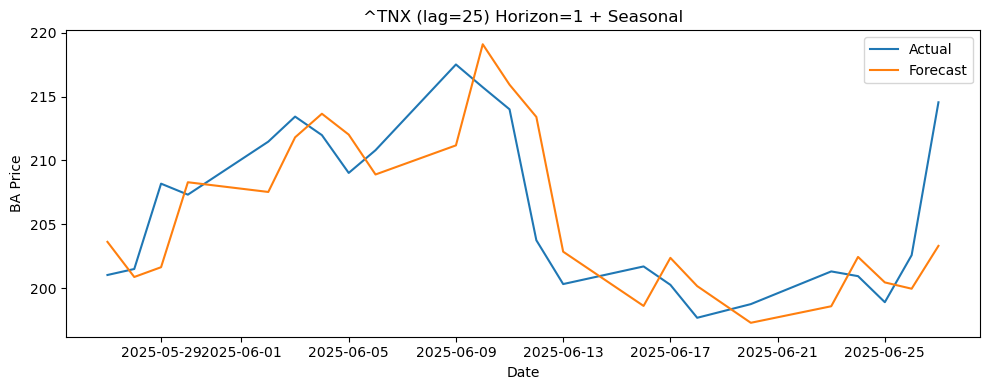

^TNX (lag=25) - Horizon 3 | RMSE: 7.27, MAE: 5.63, MAPE: 2.72%


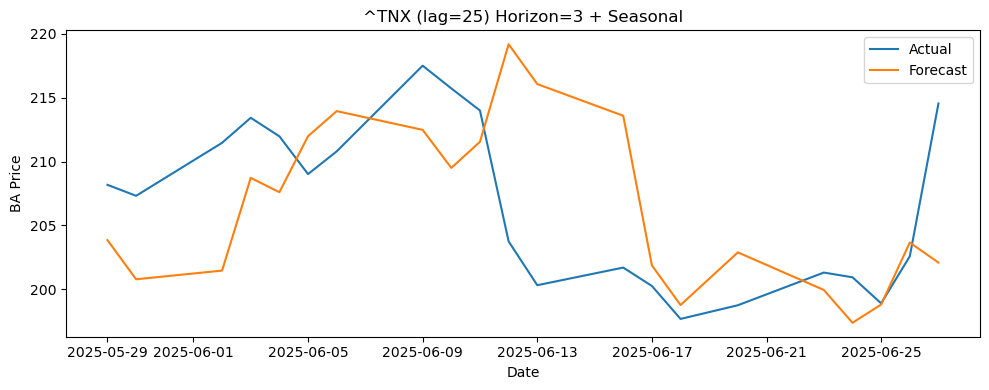

^TNX (lag=25) - Horizon 7 | RMSE: 10.75, MAE: 9.11, MAPE: 4.45%


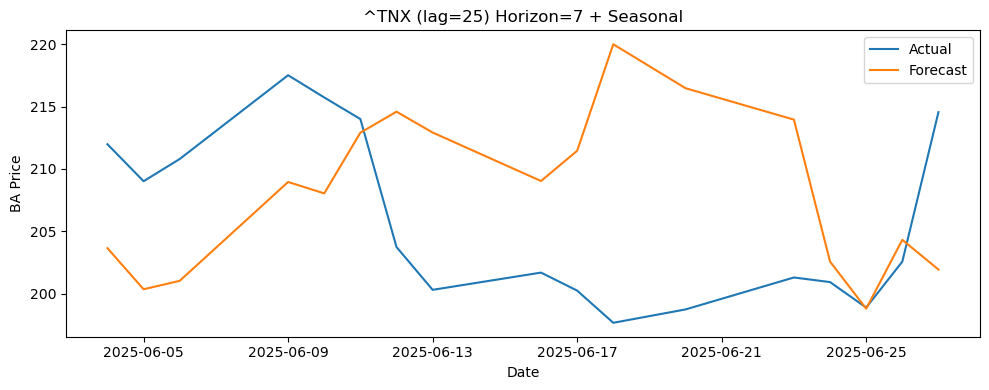


 Metrics for ^TNX saved to: exo_eval_2025.csv
ITA (lag=14) - Horizon 1 | RMSE: 4.21, MAE: 3.27, MAPE: 1.57%


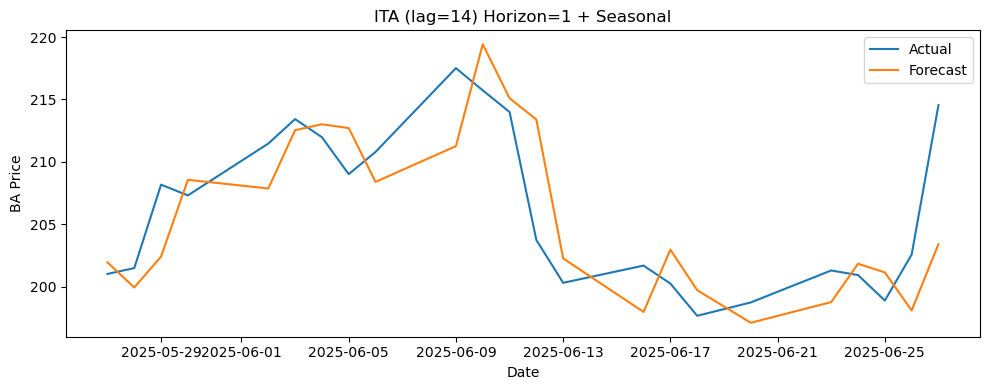

ITA (lag=14) - Horizon 3 | RMSE: 7.23, MAE: 5.63, MAPE: 2.72%


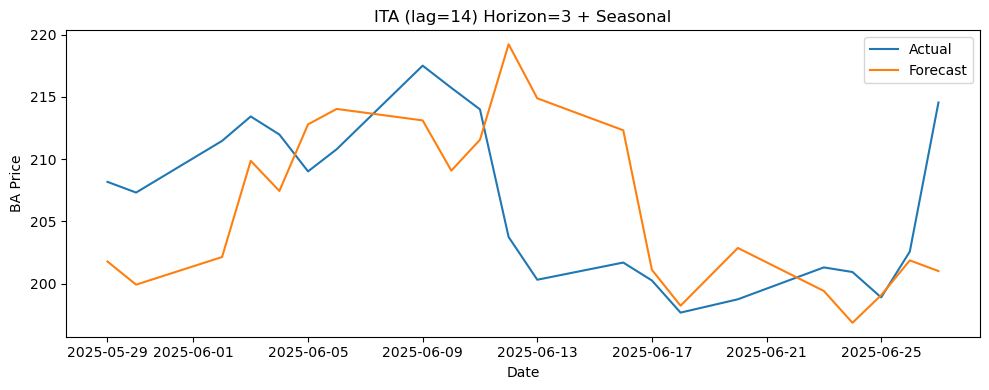

ITA (lag=14) - Horizon 7 | RMSE: 10.57, MAE: 8.74, MAPE: 4.27%


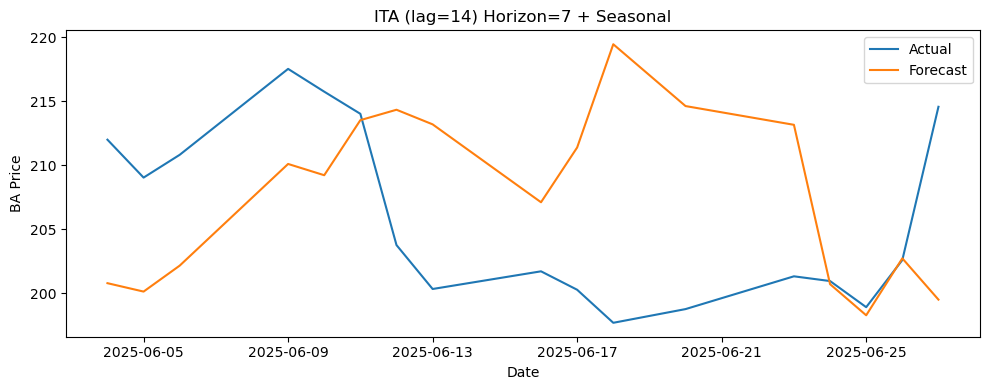


 Metrics for ITA saved to: exo_eval_2025.csv
XLI (lag=24) - Horizon 1 | RMSE: 4.19, MAE: 3.11, MAPE: 1.49%


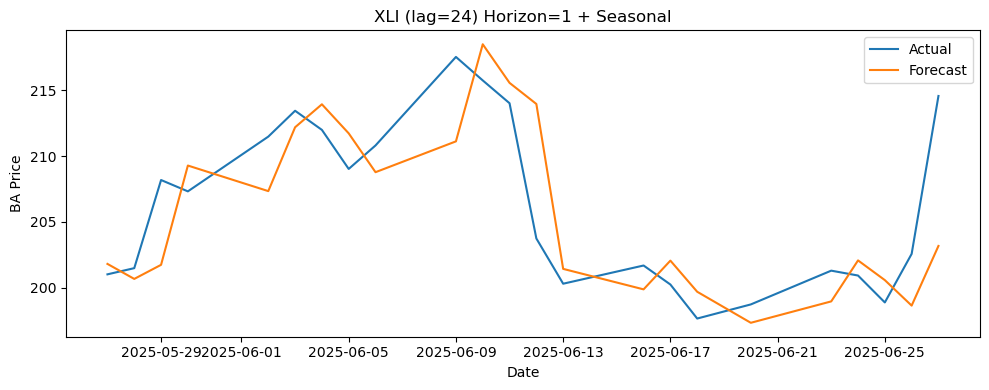

XLI (lag=24) - Horizon 3 | RMSE: 7.41, MAE: 5.79, MAPE: 2.79%


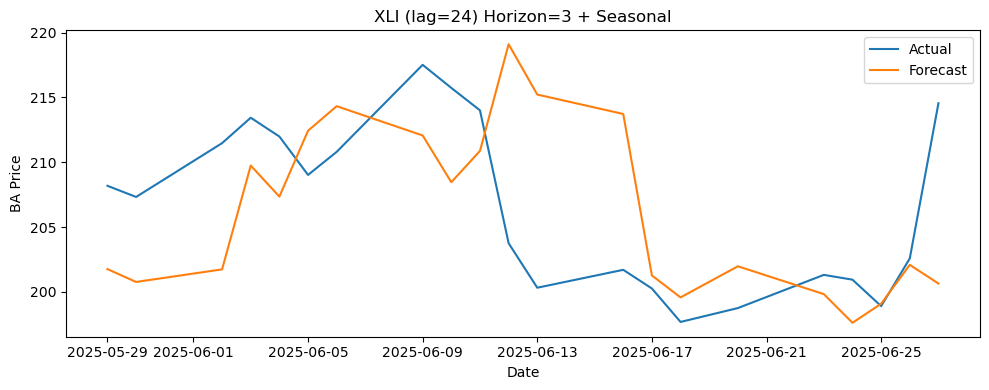

XLI (lag=24) - Horizon 7 | RMSE: 10.60, MAE: 8.94, MAPE: 4.36%


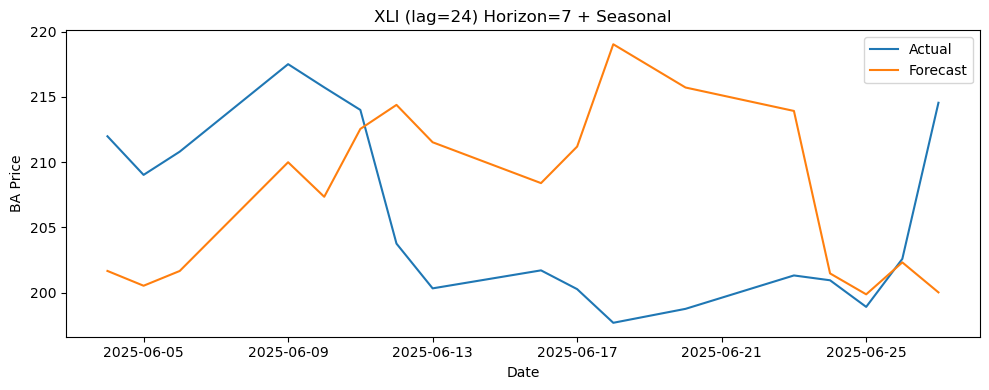


 Metrics for XLI saved to: exo_eval_2025.csv
SLX (lag=10) - Horizon 1 | RMSE: 4.22, MAE: 3.15, MAPE: 1.52%


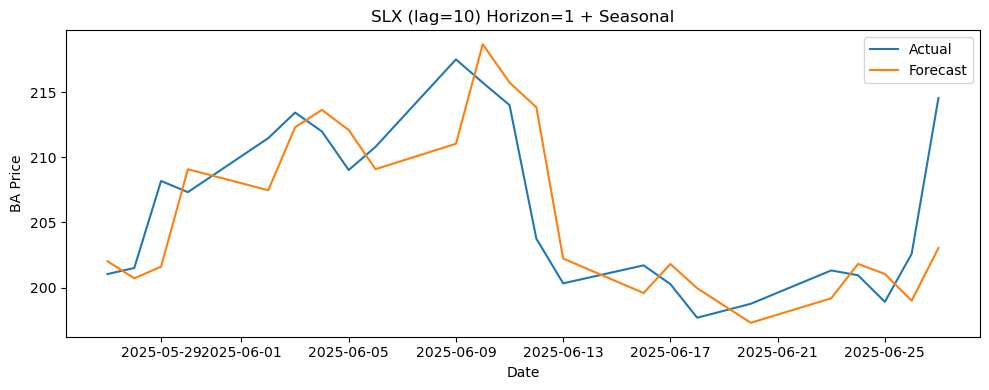

SLX (lag=10) - Horizon 3 | RMSE: 7.38, MAE: 5.70, MAPE: 2.75%


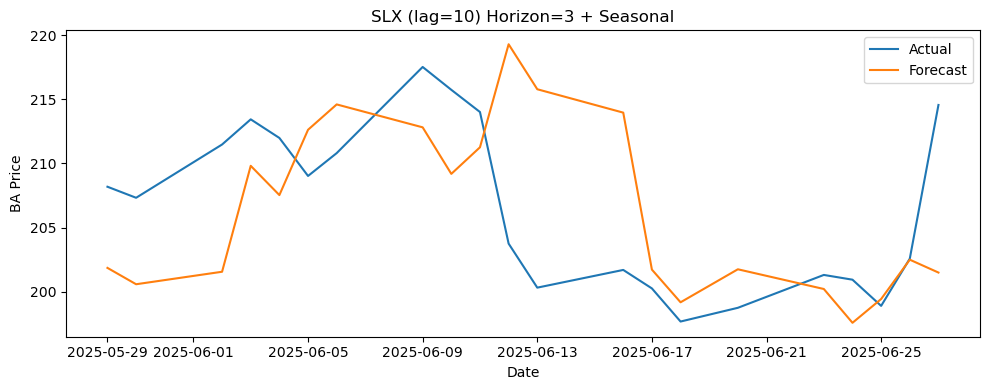

SLX (lag=10) - Horizon 7 | RMSE: 10.76, MAE: 9.02, MAPE: 4.41%


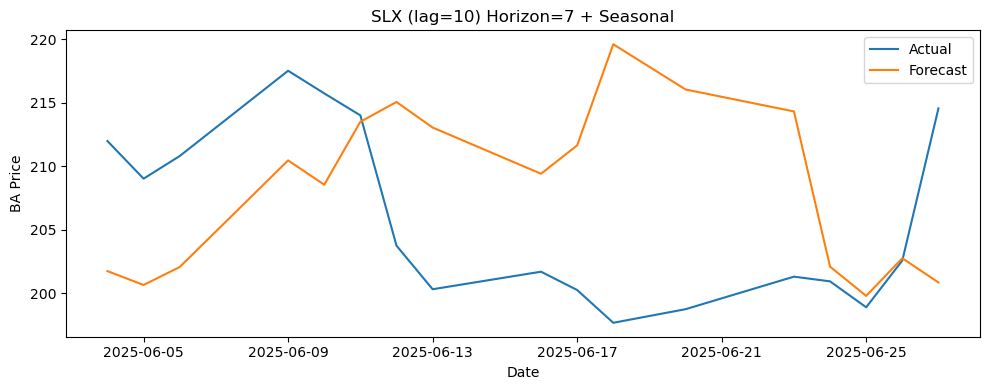


 Metrics for SLX saved to: exo_eval_2025.csv


In [120]:
for var, lag in exog_lags.items():
    evaluate_single_exog_var_with_metrics(
        target_df=df,                   # original BA data
        exog_df=df_diff,                # stationary exog inputs
        var_name=var,
        lag=lag,
        model_order=(1, 1, 1),
        forecast_horizons=[1, 3, 7],
        train_end_date="2025-05-23",
        test_start_date="2025-05-27",
        output_csv_path="exo_eval_2025.csv",
        seasonal_order=(1,0,0,30),
        append_csv=True,
        plot=True
    )

### Building LSTM baseline model for BA

Very simple architechture first...
- no dropout, 1 layer
- relu, adam, mse loss 

In [124]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100
#initial simple basline model
def create_lstm_baseline_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

def evaluate_lstm_baseline(
    df,
    forecast_horizons=[1, 3, 7],
    train_end = "2025-05-23",  
    test_start = "2025-05-27",
    window_size=30,
    epochs=20,
    output_csv_path="lstm_baseline_metrics_2025.csv",
    plot=True
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq('B')
    series = df['BA'].dropna().to_frame()

    # Scale data
    scaler = MinMaxScaler()
    series_scaled = scaler.fit_transform(series)

    # Split into train/test
    split_train = series.index <= train_end
    split_test = series.index >= test_start

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(window_size, len(series_scaled) - h):
            if not split_test[i + h]:
                continue

            X = series_scaled[i - window_size:i].reshape(1, window_size, 1)
            y = series_scaled[i + h][0]

            # Rebuild model each time to prevent data leakage
            X_train_full = []
            y_train_full = []
            for j in range(window_size, i):
                X_train_full.append(series_scaled[j - window_size:j])
                y_train_full.append(series_scaled[j][0])
            X_train_full = np.array(X_train_full)
            y_train_full = np.array(y_train_full)

            model = create_lstm_baseline_model((window_size, 1))
            model.fit(X_train_full, y_train_full, epochs=epochs, verbose=0)

            pred_scaled = model.predict(X)[0][0]
            pred = scaler.inverse_transform([[pred_scaled]])[0][0]
            actual = series.iloc[i + h][0]

            preds.append(pred)
            actuals.append(actual)
            dates.append(series.index[i + h])

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"Horizon {h}: RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")
            
            all_metrics.append({
                "model": "LSTM (baseline)",
                "horizon": h,
                "rmse": rmse,
                "mae": mae,
                "mape": mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label="Actual")
                plt.plot(dates, preds, label="Forecast")
                plt.title(f"LSTM Baseline Forecast - {h}-Day Horizon")
                plt.xlabel("Date")
                plt.ylabel("BA Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

    df_metrics = pd.DataFrame(all_metrics)
    df_metrics.to_csv(output_csv_path, index=False)
    print(f" Saved baseline LSTM metrics to {output_csv_path}")
    return df_metrics

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
Horizon 1: RMSE=8.21, MAE=7.31, MAPE=3.55


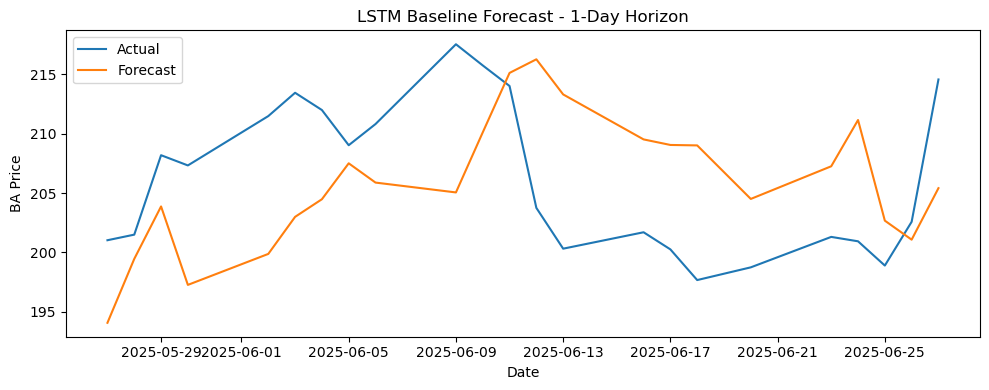

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
Horizon 3: RMSE=10.62, MAE=9.31, MAPE=4.52


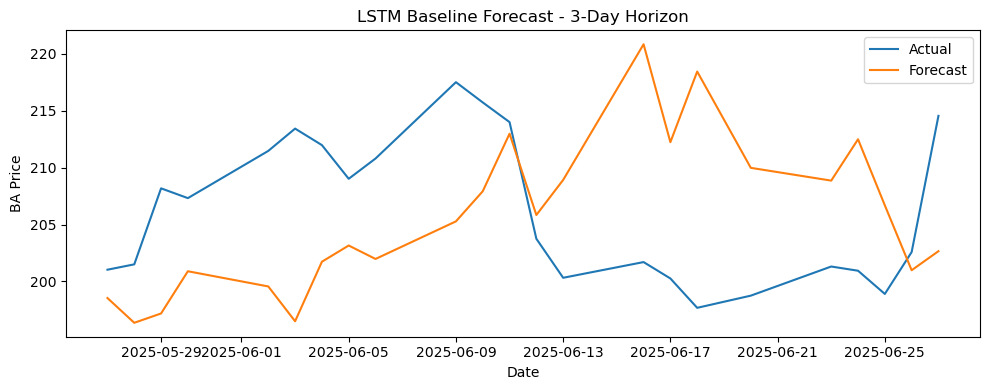

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
Horizon 7: RMSE=12.98, MAE=11.60, MAPE=5.61


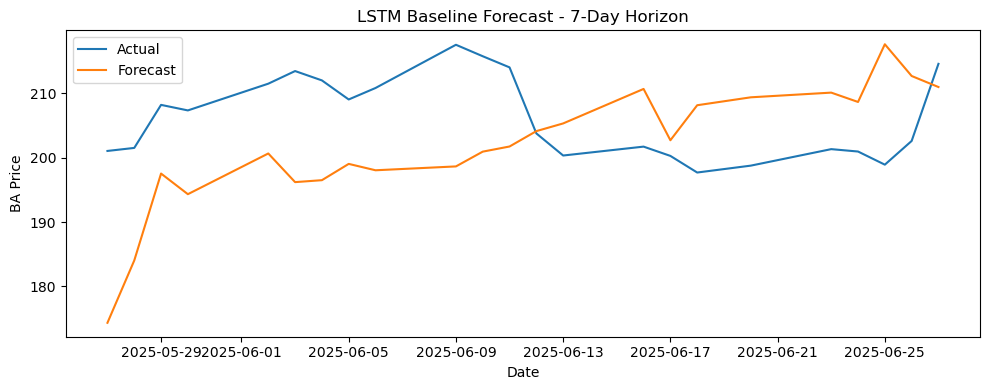

 Saved baseline LSTM metrics to lstm_baseline_metrics_2025.csv


In [125]:
lstm_baseline_results = evaluate_lstm_baseline(
    df=df,
    forecast_horizons=[1, 3, 7],
    train_end="2025-05-23",  
    test_start = "2025-05-27",
    window_size=30,
    epochs=20,
    output_csv_path="lstm_baseline_metrics_2025.csv",
    plot=True
)

Function to evealuate more complex models and model tweaks

In [127]:
def evaluate_lstm_model(
    df,
    model_fn,
    forecast_horizons=[1, 3, 7],
    train_end="2025-05-23",
    test_start="2025-05-27",
    window_size=30,
    epochs=20,
    output_csv_path="lstm_metrics_2025.csv",
    plot=True,
    callbacks=None
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq('B')
    series = df['BA'].dropna().to_frame()

    scaler = MinMaxScaler()
    series_scaled = scaler.fit_transform(series)

    split_train = series.index <= train_end
    split_test = series.index >= test_start

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(window_size, len(series_scaled) - h):
            if not split_test[i + h]:
                continue

            X = series_scaled[i - window_size:i].reshape(1, window_size, 1)
            y = series_scaled[i + h][0]

            X_train_full, y_train_full = [], []
            for j in range(window_size, i):
                X_train_full.append(series_scaled[j - window_size:j])
                y_train_full.append(series_scaled[j][0])
            X_train_full = np.array(X_train_full)
            y_train_full = np.array(y_train_full)

            model = model_fn((window_size, 1))
            model.fit(X_train_full, y_train_full, epochs=epochs, verbose=0, callbacks=callbacks)

            pred_scaled = model.predict(X)[0][0]
            pred = scaler.inverse_transform([[pred_scaled]])[0][0]
            actual = series.iloc[i + h][0]

            preds.append(pred)
            actuals.append(actual)
            dates.append(series.index[i + h])

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"Horizon {h}: RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")

            all_metrics.append({
                "model": model_fn.__name__,
                "horizon": h,
                "rmse": rmse,
                "mae": mae,
                "mape": mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label="Actual")
                plt.plot(dates, preds, label="Forecast")
                plt.title(f"{model_fn.__name__} - {h}-Day Horizon")
                plt.xlabel("Date")
                plt.ylabel("BA Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

    df_metrics = pd.DataFrame(all_metrics)
    df_metrics.to_csv(output_csv_path, index=False)
    print(f"\n Saved metrics to {output_csv_path}")
    return df_metrics

Slightly more complex model for baseline
- using tanh instead of relu
- adding in dropout
- adding in early stopping

In [129]:
def create_lstm_tanh_dropout_model(input_shape):
    model = Sequential()
    model.add(LSTM(64, activation='tanh', input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
Horizon 1: RMSE=11.51, MAE=9.82, MAPE=4.73


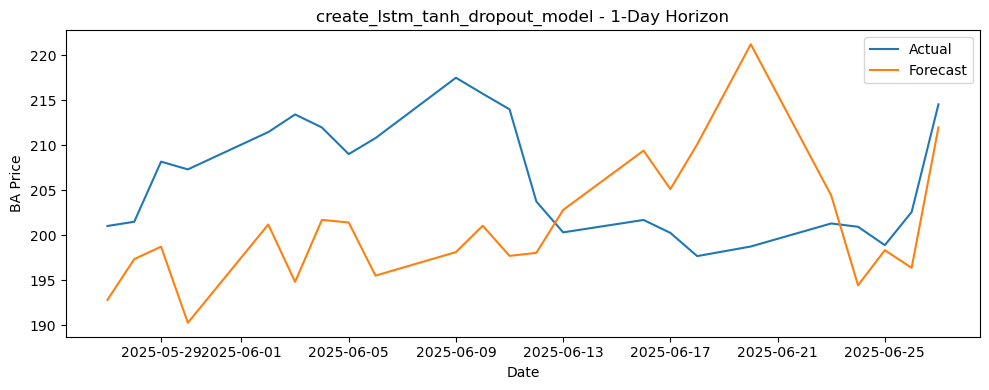

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
Horizon 3: RMSE=11.70, MAE=9.85, MAPE=4.72


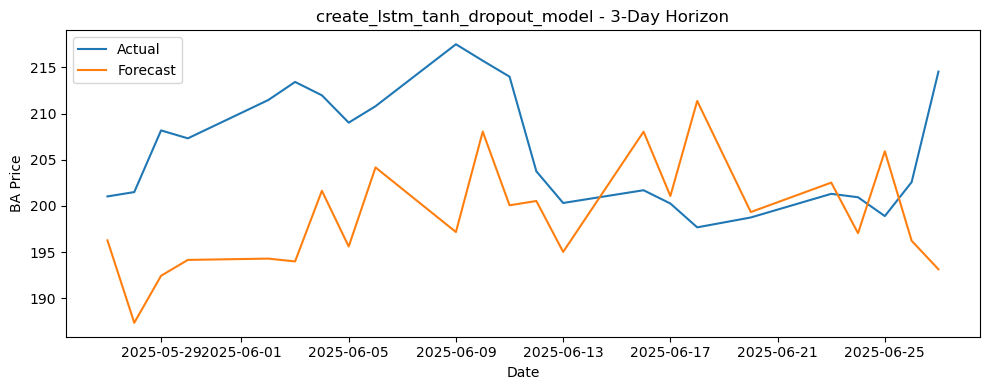

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
Horizon 7: RMSE=12.10, MAE=10.29, MAPE=4.93


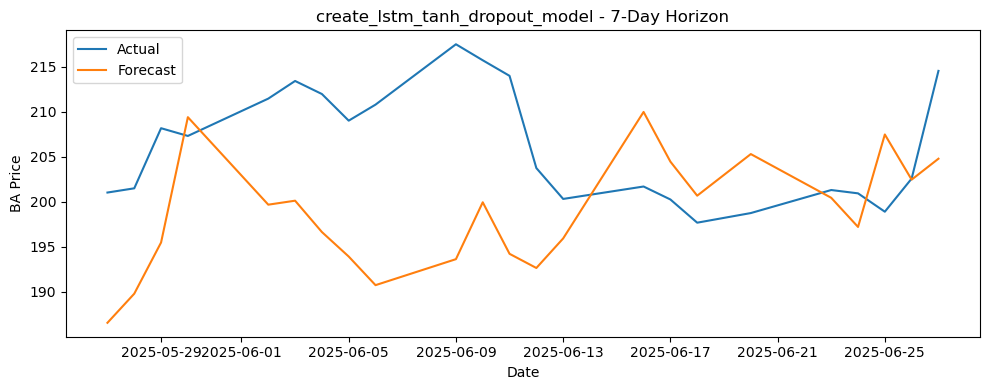


 Saved metrics to lstm_tanh_dropout_2025.csv


,model,horizon,rmse,mae,mape
0,create_lstm_tanh_dropout_model,1,11.514839,9.822352,4.729504
1,create_lstm_tanh_dropout_model,3,11.695888,9.852366,4.720588
2,create_lstm_tanh_dropout_model,7,12.104057,10.288064,4.927205


In [130]:
#call this model with early stopping
early_stop = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_tanh_dropout_model,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_tanh_dropout_2025.csv",
    callbacks=[early_stop]
)

This model proving worse that prvious despite dropout etc. for horizon 1 and 3 but performing slightly better on horizon 7. Going to try same model architecture again...but just swap back in relu for tanh

In [132]:
def create_lstm_relu_dropout_model(input_shape):
    model = Sequential()
    model.add(LSTM(64, activation='relu', input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
Horizon 1: RMSE=11.19, MAE=9.59, MAPE=4.62


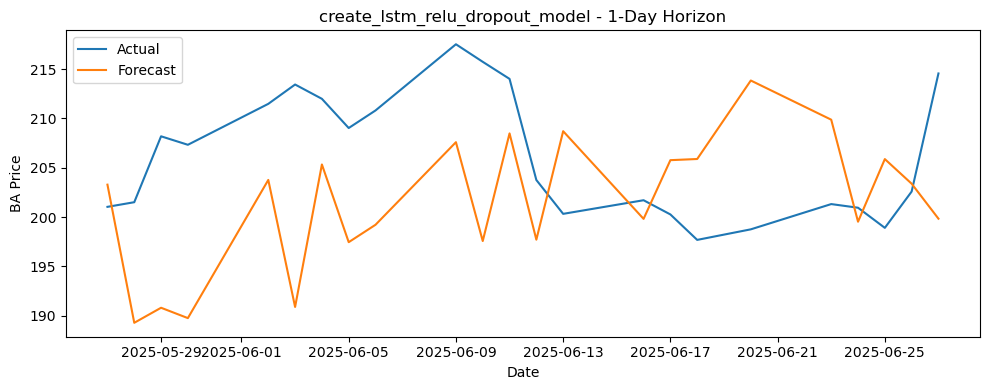

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
Horizon 3: RMSE=13.04, MAE=11.36, MAPE=5.45


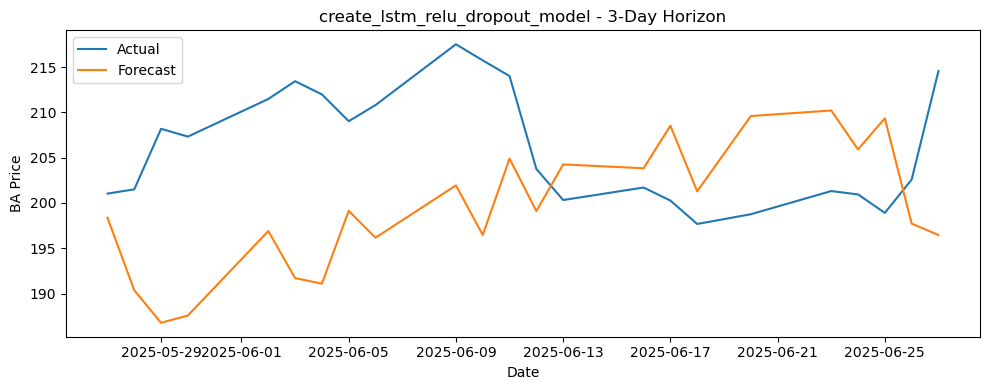

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
Horizon 7: RMSE=15.27, MAE=12.41, MAPE=5.97


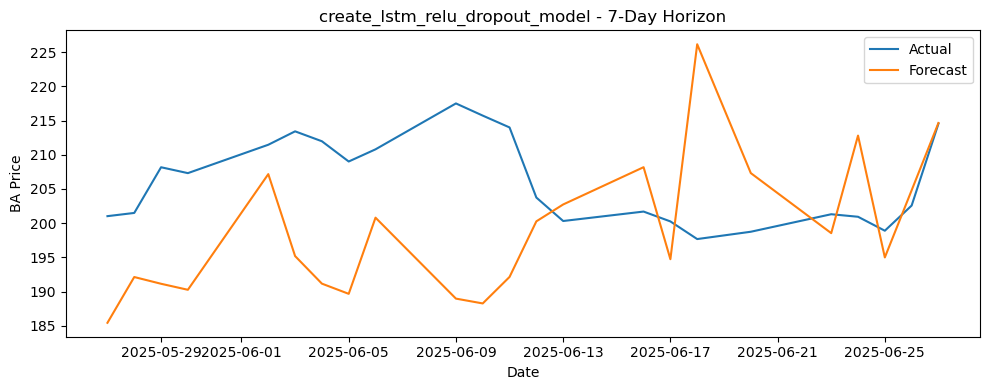


 Saved metrics to lstm_relu_dropout_2025.csv


,model,horizon,rmse,mae,mape
0,create_lstm_relu_dropout_model,1,11.191722,9.593970,4.619037
1,create_lstm_relu_dropout_model,3,13.042565,11.359317,5.446483
2,create_lstm_relu_dropout_model,7,15.266986,12.410387,5.968594


In [133]:
#call this model with early stopping
early_stop = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_relu_dropout_model,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_relu_dropout_2025.csv",
    callbacks=[early_stop]
)

- Tanh definitely performing better than relu across the board
Removing dropout and just swapping out relu for tanh in baseline
- trying without early stopping, then with (commenting out)

Without early stopping metrics:
- Horizon 1: RMSE=11.75, MAE=9.85, MAPE=4.74
- Horizon 3: RMSE=11.88, MAE=9.83, MAPE=4.72
- Horizon 7: RMSE=12.21, MAE=9.57, MAPE=4.55 ... improvement on baseline for horizon 7 only

In [135]:
def create_lstm_baseline_model_tanh(input_shape):
    model = Sequential()
    model.add(LSTM(50, activation='tanh', input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
Horizon 1: RMSE=8.99, MAE=7.83, MAPE=3.75


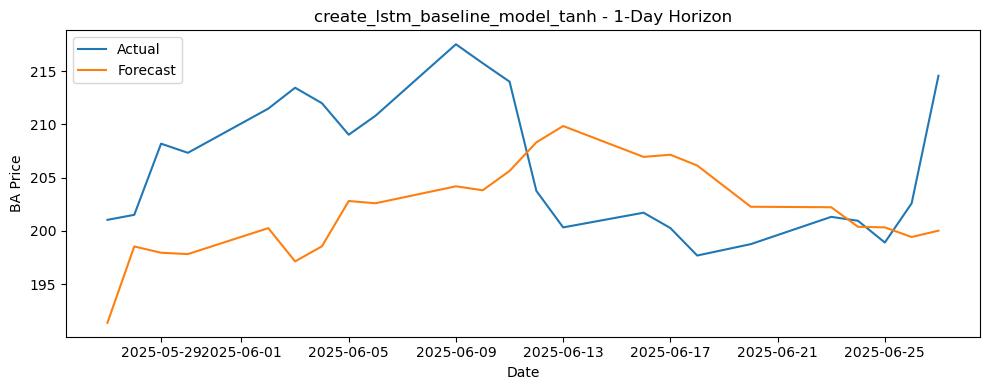

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
Horizon 3: RMSE=9.52, MAE=8.53, MAPE=4.10


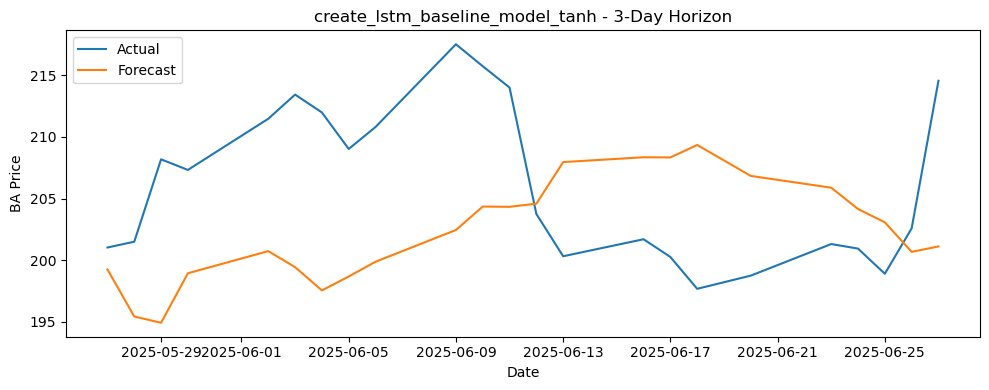

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
Horizon 7: RMSE=11.99, MAE=10.75, MAPE=5.17


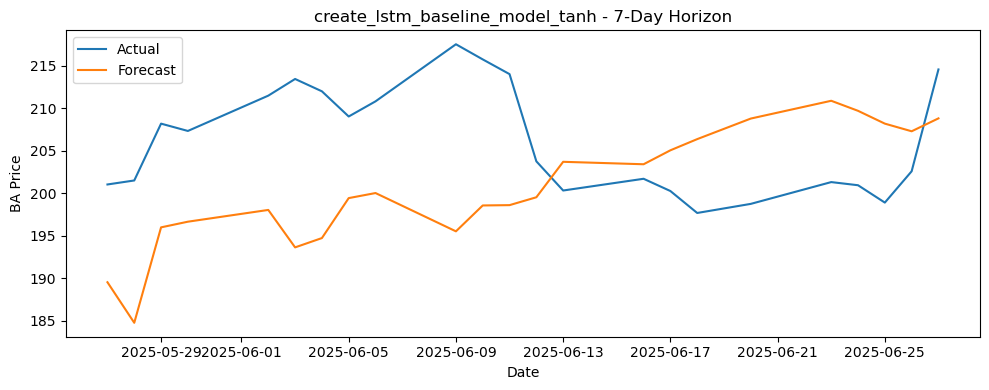


 Saved metrics to lstm_tanh_2025.csv


,model,horizon,rmse,mae,mape
0,create_lstm_baseline_model_tanh,1,8.992923,7.832102,3.754286
1,create_lstm_baseline_model_tanh,3,9.518319,8.532276,4.098888
2,create_lstm_baseline_model_tanh,7,11.991929,10.752551,5.171413


In [136]:
#call this model with early stopping
early_stop = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)
#early stopping had better metrics for all forecasts other than 7 day
evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_baseline_model_tanh,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_tanh_2025.csv",
    callbacks=[early_stop]
)

Trying a deeper model using tanh as this had better outcomes so far

In [138]:
def create_lstm_deep_model_tanh(input_shape):
    model = Sequential()
    model.add(LSTM(64, activation='tanh', return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(LSTM(32, activation='tanh'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
Horizon 1: RMSE=9.24, MAE=8.22, MAPE=3.96


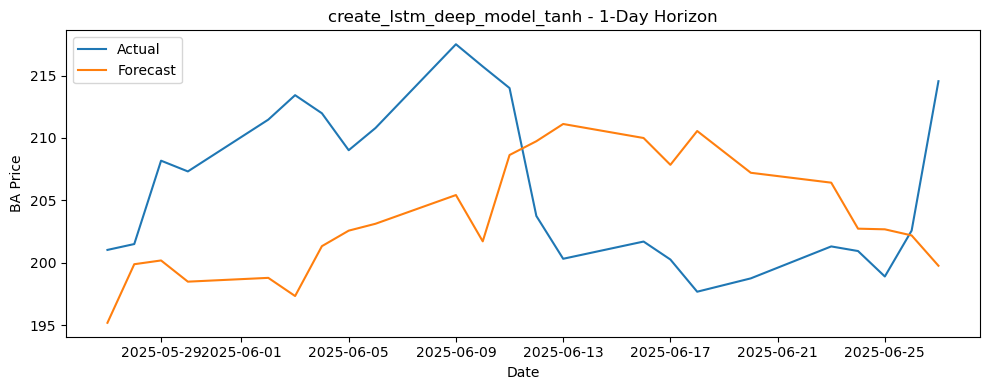

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
Horizon 3: RMSE=9.78, MAE=9.19, MAPE=4.44


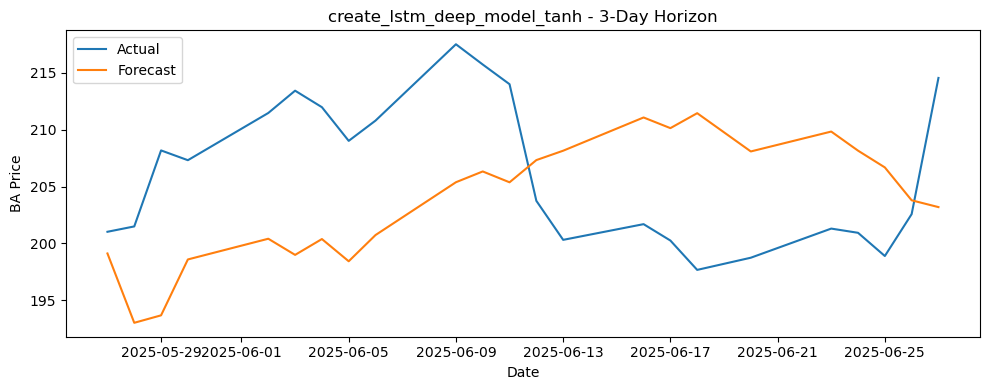

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
Horizon 7: RMSE=12.59, MAE=11.49, MAPE=5.55


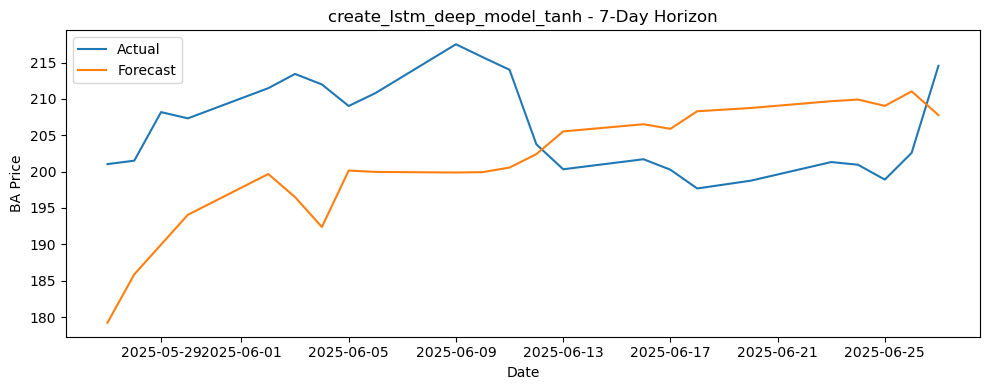


 Saved metrics to lstm_deep_tanh_2025.csv


,model,horizon,rmse,mae,mape
0,create_lstm_deep_model_tanh,1,9.237043,8.224751,3.959793
1,create_lstm_deep_model_tanh,3,9.783373,9.188282,4.439979
2,create_lstm_deep_model_tanh,7,12.586549,11.486493,5.545033


In [139]:
early_stop = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_deep_model_tanh,  
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_deep_tanh_2025.csv",
    callbacks=[early_stop]
)

In [140]:
def create_lstm_deep_model_small_tanh(input_shape):
    model = Sequential()
    model.add(LSTM(32, activation='tanh', return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.1))
    model.add(LSTM(16, activation='tanh'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
Horizon 1: RMSE=10.02, MAE=8.27, MAPE=3.95


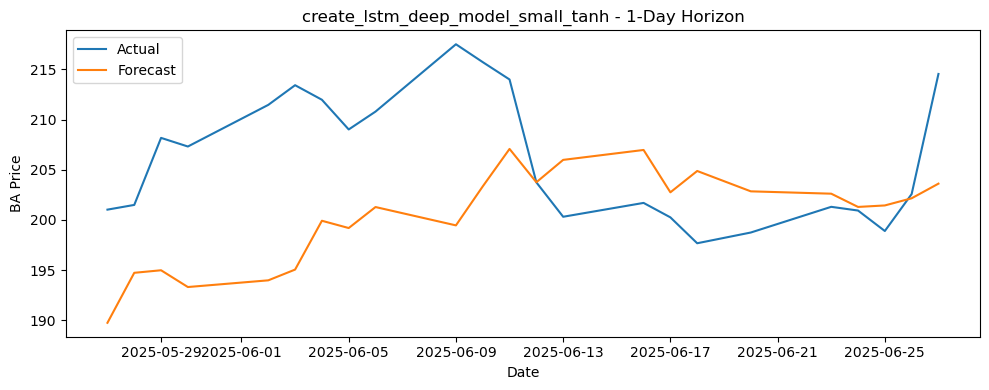

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
Horizon 3: RMSE=12.26, MAE=10.45, MAPE=5.01


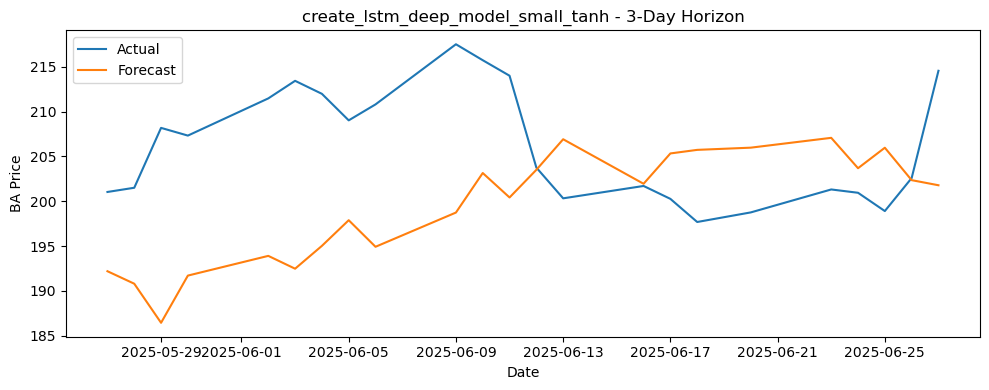

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
Horizon 7: RMSE=14.50, MAE=12.52, MAPE=6.00


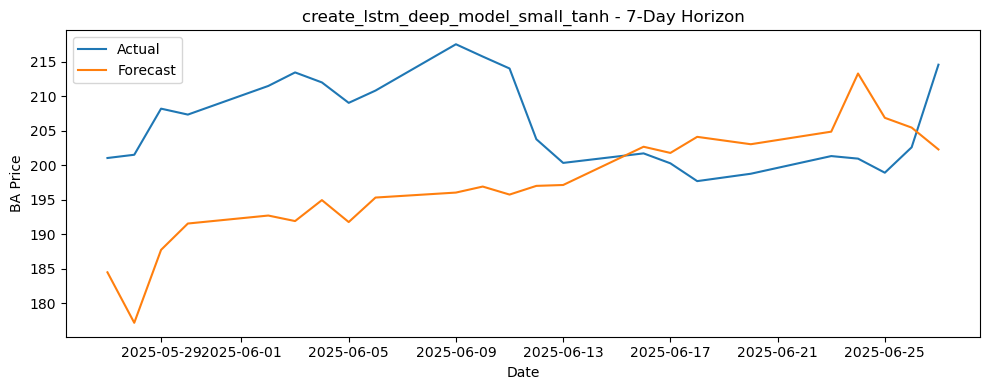


 Saved metrics to lstm_deep_model_small_tanh_2025.csv


,model,horizon,rmse,mae,mape
0,create_lstm_deep_model_small_tanh,1,10.018691,8.267831,3.953131
1,create_lstm_deep_model_small_tanh,3,12.260735,10.451140,5.005170
2,create_lstm_deep_model_small_tanh,7,14.500484,12.519781,6.004549


In [141]:
early_stop = EarlyStopping(monitor='loss', patience=7, restore_best_weights=True)

evaluate_lstm_model(
    df=df,
    model_fn=create_lstm_deep_model_small_tanh,  
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_deep_model_small_tanh_2025.csv",
    callbacks=[early_stop]
)

deeper version worked better.
trying to use keras tuner to speed up process...

In [143]:
#defining tunable model
class LSTMHyperModel(HyperModel):
    def __init__(self, input_shape):
        self.input_shape = input_shape

    def build(self, hp):
        model = Sequential()
        model.add(
            LSTM(
                units=hp.Int("units_1", min_value=16, max_value=128, step=16),
                activation=hp.Choice("activation_1", ["relu", "tanh"]),
                return_sequences=hp.Boolean("return_seq"),
                input_shape=self.input_shape
            )
        )
        if hp.Boolean("add_second_layer"):
            model.add(Dropout(hp.Float("dropout_1", 0.0, 0.4, step=0.1)))
            model.add(
                LSTM(
                    units=hp.Int("units_2", min_value=16, max_value=64, step=16),
                    activation=hp.Choice("activation_2", ["relu", "tanh"]),
                )
            )
        model.add(Dense(1))
        model.compile(
            optimizer="adam",
            loss="mse",
            metrics=["mae"]
        )
        return model


In [144]:
#wrappper for keras tuning

def tune_lstm_model(input_shape):
    tuner = RandomSearch(
        LSTMHyperModel(input_shape),
        objective='val_loss',
        max_trials=10,
        executions_per_trial=1,
        directory='tuning',
        project_name='lstm_tuning',
        seed = seed
    )

    # Dummy data to tune on (required)
    X_dummy = np.random.rand(100, input_shape[0], input_shape[1])
    y_dummy = np.random.rand(100)

    tuner.search(X_dummy, y_dummy, epochs=5, validation_split=0.2, verbose=1)
    
    best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]
    best_model = tuner.hypermodel.build(best_hp)
    return best_model, best_hp

Reloading Tuner from tuning\lstm_tuning\tuner0.json
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Horizon 1: RMSE=8.31, MAE=5.80, MAPE=2.81


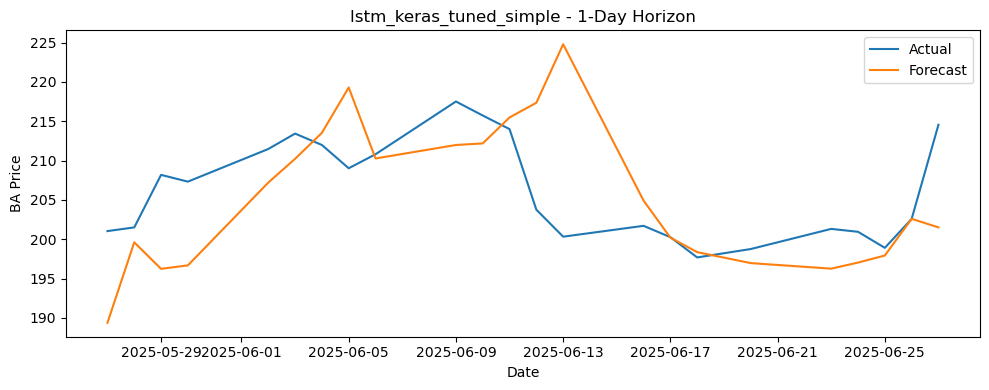

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Horizon 3: RMSE=8.39, MAE=6.81, MAPE=3.32


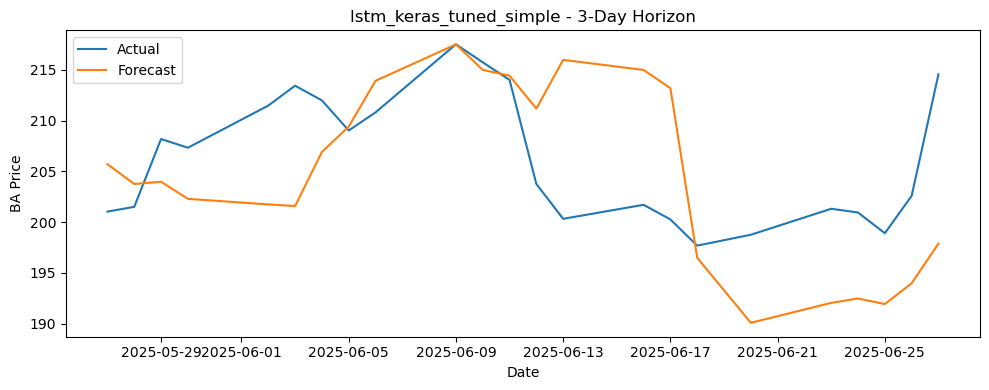

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Horizon 7: RMSE=10.97, MAE=9.83, MAPE=4.76


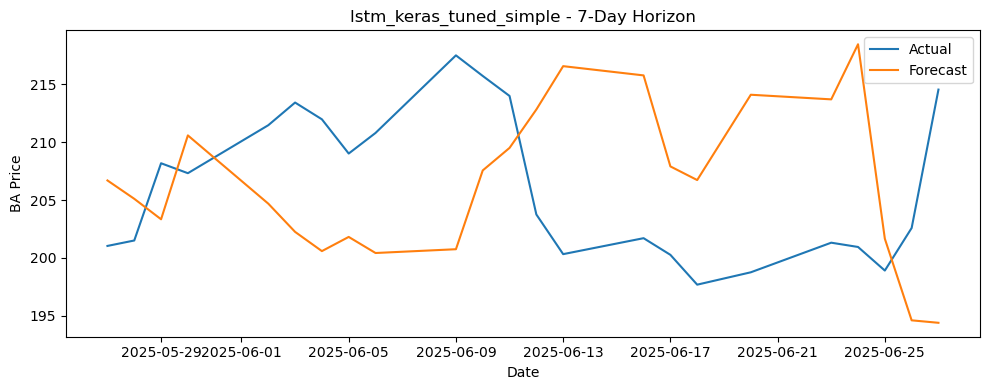


 Saved metrics to lstm_keras_tuner_metrics_2025.csv


,model,horizon,rmse,mae,mape
0,lstm_keras_tuned_simple,1,8.308010,5.797840,2.813270
1,lstm_keras_tuned_simple,3,8.392064,6.808954,3.323491
2,lstm_keras_tuned_simple,7,10.970367,9.828795,4.764493


In [145]:
#adapting evaluating function to accept a pre built model
input_shape = (30, 1)  
best_model_simple, best_hp_simple = tune_lstm_model(input_shape)

# Wrapper to pass to evaluator
def lstm_keras_tuned_simple(input_shape):
    return best_model_simple  # built from simple tuner
    
evaluate_lstm_model(
    df=df,
    model_fn=lstm_keras_tuned_simple,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_keras_tuner_metrics_2025.csv",
    callbacks=[EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)]
)

basline model still better on horizon 1... but performs much better for all others

In [147]:
#defining hypermodel for keras tuner

class LSTMHyperModel(HyperModel):
    def __init__(self, input_shape):
        self.input_shape = input_shape

    def build(self, hp):
        model = Sequential()

        # First LSTM layer
        activation_1 = hp.Choice("activation_1", ["relu", "tanh", "leaky_relu"])
        units_1 = hp.Int("units_1", min_value=16, max_value=128, step=16)
        return_seq = hp.Boolean("return_seq_1")

        if activation_1 == "leaky_relu":
            model.add(LSTM(units_1, activation=None, return_sequences=return_seq, input_shape=self.input_shape))
            model.add(LeakyReLU(alpha=hp.Float("leaky_relu_alpha_1", 0.01, 0.3, step=0.05)))
        else:
            model.add(LSTM(units_1, activation=activation_1, return_sequences=return_seq, input_shape=self.input_shape))

        # Optional second LSTM layer — only if first returns sequences
        if return_seq and hp.Boolean("add_second_lstm"):
            model.add(Dropout(hp.Float("dropout_1", 0.0, 0.4, step=0.1)))
            units_2 = hp.Int("units_2", min_value=16, max_value=64, step=16)
            activation_2 = hp.Choice("activation_2", ["relu", "tanh", "leaky_relu"])
            if activation_2 == "leaky_relu":
                model.add(LSTM(units_2, activation=None))
                model.add(LeakyReLU(alpha=hp.Float("leaky_relu_alpha_2", 0.01, 0.3, step=0.05)))
            else:
                model.add(LSTM(units_2, activation=activation_2))

        # Optional final dropout
        if hp.Boolean("add_final_dropout"):
            model.add(Dropout(hp.Float("final_dropout", 0.0, 0.3, step=0.1)))

        # Output layer
        model.add(Dense(1))  # Avoided activation=None/linear choice to keep tuner stable

        # Optimizer
        optimizer_name = hp.Choice("optimizer", ["adam", "rmsprop"])
        learning_rate = hp.Float("learning_rate", 1e-5, 1e-2, sampling="log")
        optimizer = optimizers.Adam(learning_rate) if optimizer_name == "adam" else optimizers.RMSprop(learning_rate)

        model.compile(optimizer=optimizer, loss="mse", metrics=["mae"])
        return model

In [148]:
#preparing input data

# Define window size
window_size = 30

# Prepare scaled BA series
df = df.copy()
df.index = pd.to_datetime(df.index)
df = df.asfreq("B")
series = df["BA"].dropna().to_frame()

scaler = MinMaxScaler()
series_scaled = scaler.fit_transform(series)

# Generate training sequences
X_train, y_train = [], []
for i in range(window_size, int(len(series_scaled) * 0.8)):
    X_train.append(series_scaled[i - window_size:i])
    y_train.append(series_scaled[i][0])

X_train = np.array(X_train)
y_train = np.array(y_train)

In [151]:
# Setup tuner
tuner = RandomSearch(
    LSTMHyperModel(input_shape=(window_size, 1)),
    objective="val_loss",
    max_trials=20,
    executions_per_trial=1,
    directory="lstm_tuning",
    project_name="baseline_tune",
    seed = seed
)

# Run tuning
early_stop = EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True)
tuner.search(X_train, y_train, validation_split=0.2, epochs=20, callbacks=[early_stop])

# Get best model + hyperparameters
best_hp = tuner.get_best_hyperparameters(1)[0]
best_model_complex = tuner.hypermodel.build(best_hp)

# Display best config
print("\n Best Hyperparameter Configuration:")
for k, v in best_hp.values.items():
    print(f"{k}: {v}")

Reloading Tuner from lstm_tuning\baseline_tune\tuner0.json

 Best Hyperparameter Configuration:
activation_1: tanh
units_1: 64
return_seq_1: False
add_second_lstm: False
add_final_dropout: True
output_activation: linear
optimizer: adam
learning_rate: 0.006571970090025509
dropout_1: 0.4
units_2: 64
activation_2: relu
leaky_relu_alpha_1: 0.11
final_dropout: 0.2


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Horizon 1: RMSE=7.14, MAE=5.75, MAPE=2.77


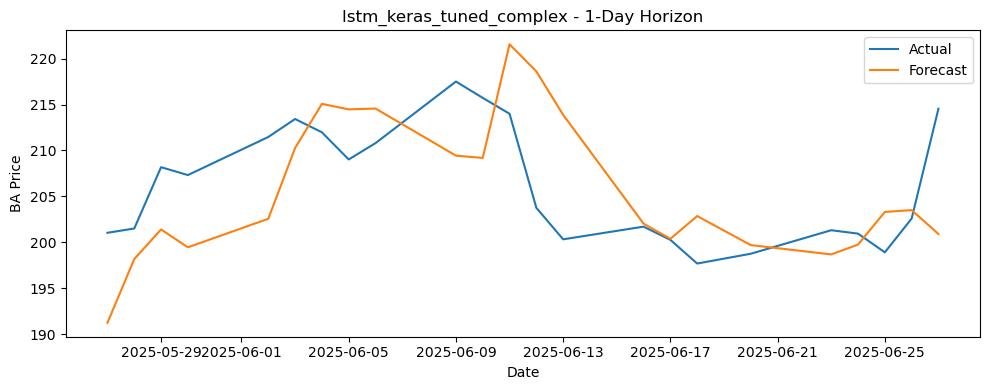

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Horizon 3: RMSE=6.40, MAE=5.19, MAPE=2.52


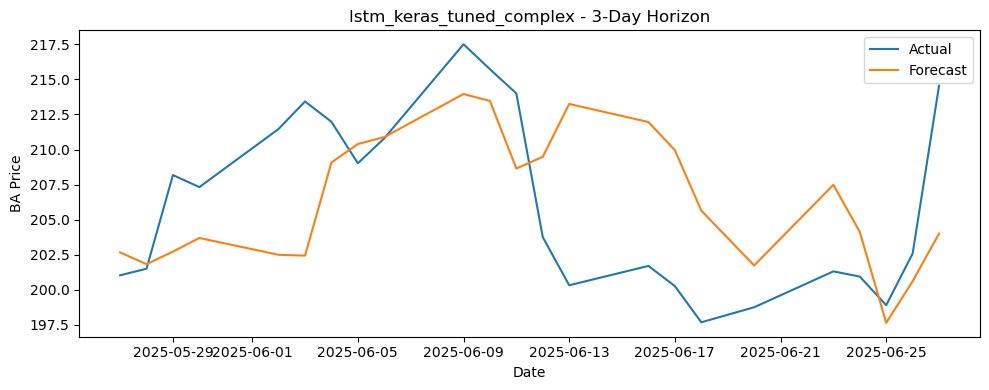

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Horizon 7: RMSE=9.14, MAE=8.26, MAPE=4.02


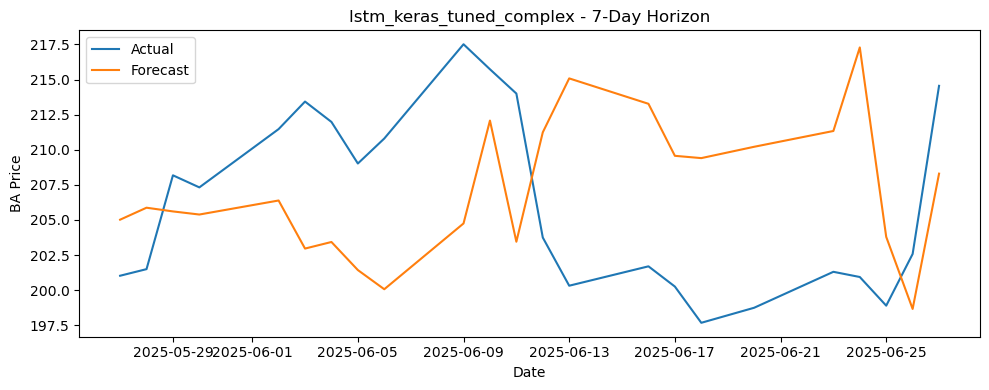


 Saved metrics to lstm_keras_tuned_metrics_2025.csv


,model,horizon,rmse,mae,mape
0,lstm_keras_tuned_complex,1,7.135504,5.745940,2.770898
1,lstm_keras_tuned_complex,3,6.395228,5.185337,2.517395
2,lstm_keras_tuned_complex,7,9.144172,8.260136,4.018115


In [153]:
#wrapper
def lstm_keras_tuned_complex(input_shape):
    return best_model_complex

#evaluate
evaluate_lstm_model(
    df=df,
    model_fn=lstm_keras_tuned_complex,
    forecast_horizons=[1, 3, 7],
    output_csv_path="lstm_keras_tuned_metrics_2025.csv",
    callbacks=[early_stop]
)

best LSTM model across the board- happy to proceed

In [155]:
#saving best model for use with exo variables later
best_hp = tuner.get_best_hyperparameters(1)[0]

def best_model_fn(input_shape):
    model = LSTMHyperModel(input_shape).build(best_hp)
    return model

In [156]:
# adapting evaluation function to handle exo variables
def evaluate_lstm_model_with_exo(
    df,
    exo_var=None,
    model_fn=None,
    forecast_horizons=[1, 3, 7],
    train_end="2025-05-23",
    test_start="2025-05-27",
    window_size=30,
    epochs=20,
    output_csv_path="metrics_2025.csv",
    plot=True,
    callbacks=None
):
    df = df.copy()
    df.index = pd.to_datetime(df.index)
    df = df.asfreq("B")
    
    features = ["BA"] + (exo_var if isinstance(exo_var, list) else [exo_var] if exo_var else [])
    df = df[features].dropna()

    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(df)

    split_train = df.index <= train_end
    split_test = df.index >= test_start

    all_metrics = []

    for h in forecast_horizons:
        preds, actuals, dates = [], [], []

        for i in range(window_size, len(data_scaled) - h):
            if not split_test[i + h]:
                continue

            X = data_scaled[i - window_size:i].reshape(1, window_size, len(features))
            y = data_scaled[i + h][0]

            X_train_full, y_train_full = [], []
            for j in range(window_size, i):
                X_train_full.append(data_scaled[j - window_size:j])
                y_train_full.append(data_scaled[j][0])
            X_train_full = np.array(X_train_full, dtype=np.float32)
            y_train_full = np.array(y_train_full, dtype=np.float32)

            model = model_fn((window_size, len(features)))
            model.fit(X_train_full, y_train_full, epochs=epochs, verbose=0, callbacks=callbacks)

            pred_scaled = model.predict(X)[0][0]
            pred = scaler.inverse_transform([[pred_scaled] + [0] * (len(features) - 1)])[0][0]
            actual = df.iloc[i + h]["BA"]

            preds.append(pred)
            actuals.append(actual)
            dates.append(df.index[i + h])

        if preds:
            rmse = np.sqrt(mean_squared_error(actuals, preds))
            mae = mean_absolute_error(actuals, preds)
            mape = mean_absolute_percentage_error(actuals, preds)
            print(f"Exo: {exo_var or 'None'} - Horizon {h} -> RMSE={rmse:.2f}, MAE={mae:.2f}, MAPE={mape:.2f}")

            all_metrics.append({
                "model": model_fn.__name__,
                "exo_var": exo_var or "None",
                "horizon": h,
                "rmse": rmse,
                "mae": mae,
                "mape": mape
            })

            if plot:
                plt.figure(figsize=(10, 4))
                plt.plot(dates, actuals, label="Actual")
                plt.plot(dates, preds, label="Forecast")
                plt.title(f"{exo_var or 'No Exo'} - {h}-Day Horizon")
                plt.xlabel("Date")
                plt.ylabel("BA Price")
                plt.legend()
                plt.tight_layout()
                plt.show()

        # Light memory cleanup after each horizon
        K.clear_session()
        gc.collect()

    df_metrics = pd.DataFrame(all_metrics)
    df_metrics.to_csv(output_csv_path, index=False)
    print(f"\n Saved metrics to {output_csv_path}")
    return df_metrics


 Evaluating with exogenous variable: SLX
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
Exo: SLX - Horizon 1 -> RMSE=8.57, MAE=7.18, MAPE=3.47


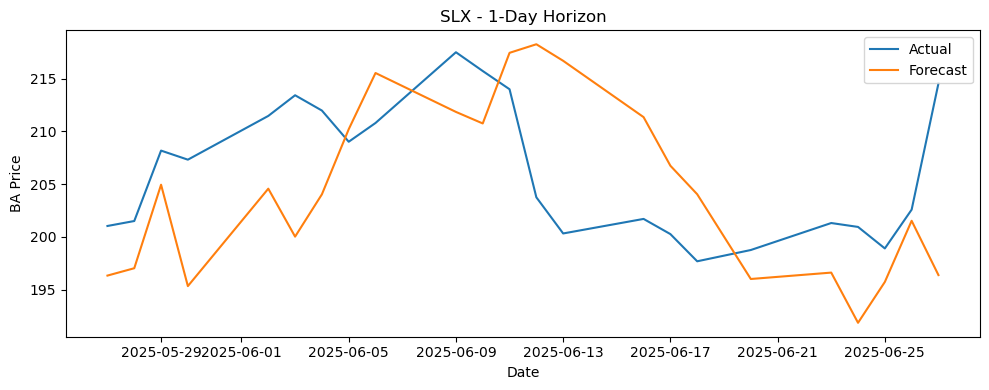


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
Exo: SLX - Horizon 3 -> RMSE=9.06, MAE=8.06, MAPE=3.92


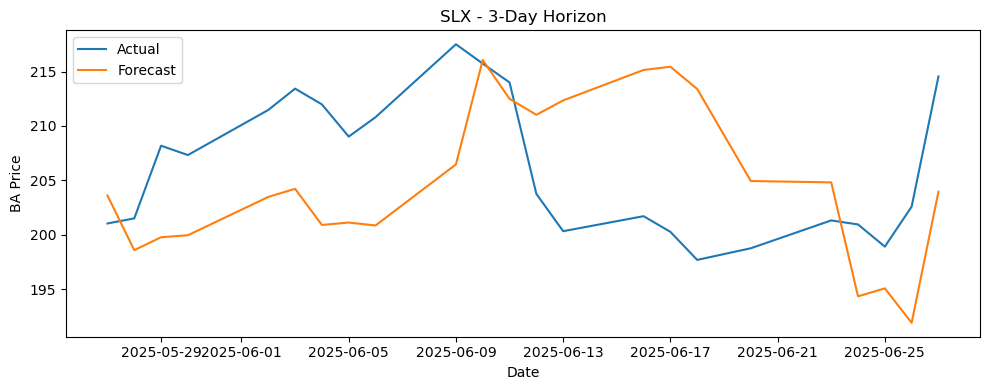

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
Exo: SLX - Horizon 7 -> RMSE=11.02, MAE=9.59, MAPE=4.65


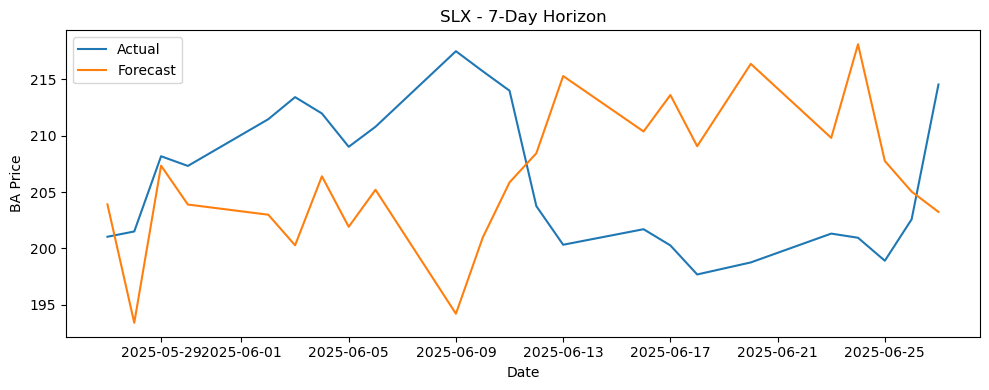


 Saved metrics to metrics_lstm_exo_SLX_2025.csv

 Evaluating with exogenous variable: CL=F
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
Exo: CL=F -

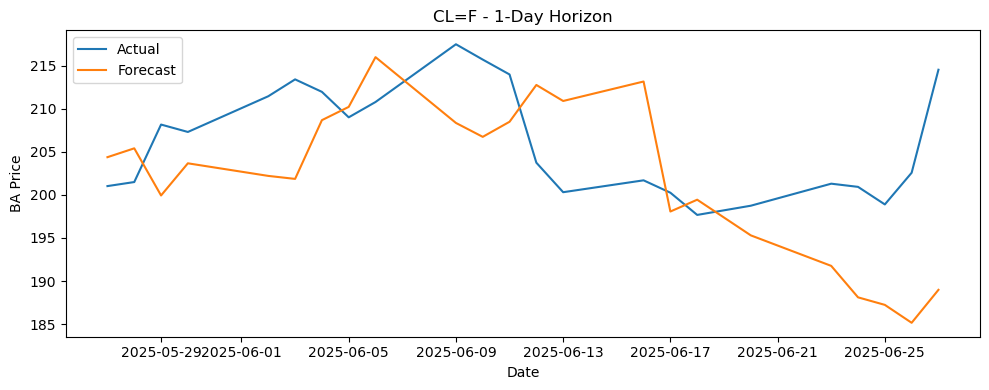

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
Exo: CL=F - Horizon 3 -> RMSE=9.96, MAE=8.01, MAPE=3.88


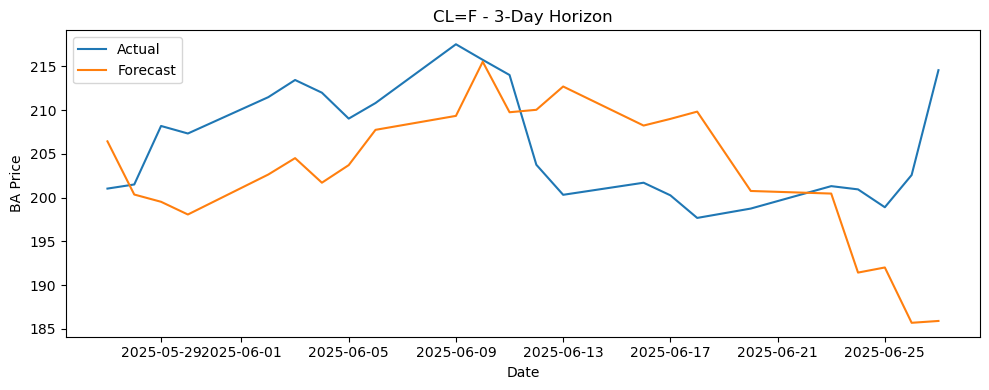

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
Exo: CL=F - Horizon 7 -> RMSE=10.13, MAE=8.86, MAPE=4.28


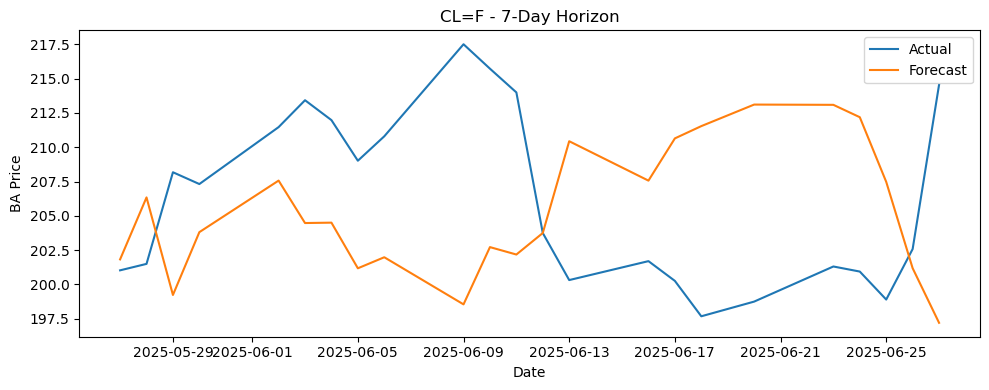


 Saved metrics to metrics_lstm_exo_CLF_2025.csv

 Evaluating with exogenous variable: ITA
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
Exo: ITA - H

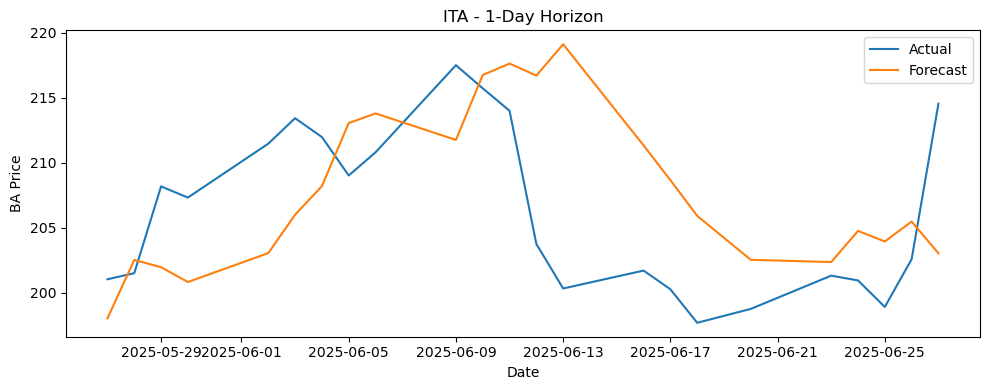

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
Exo: ITA - Horizon 3 -> RMSE=9.21, MAE=7.37, MAPE=3.60


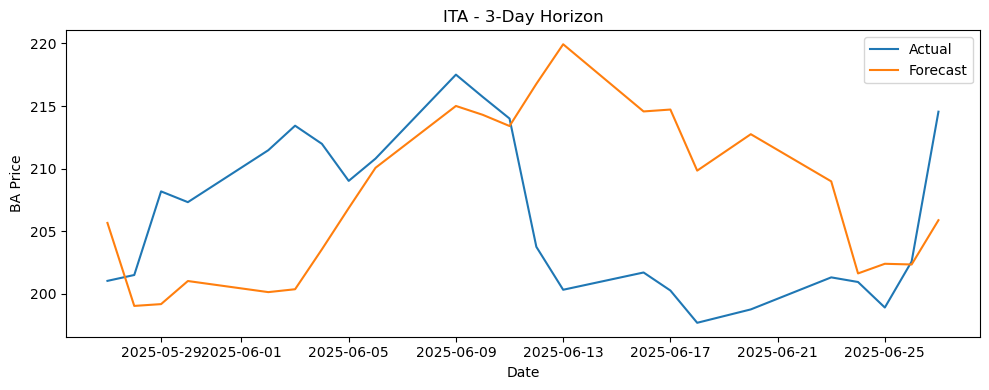

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
Exo: ITA - Horizon 7 -> RMSE=12.66, MAE=11.41, MAPE=5.55


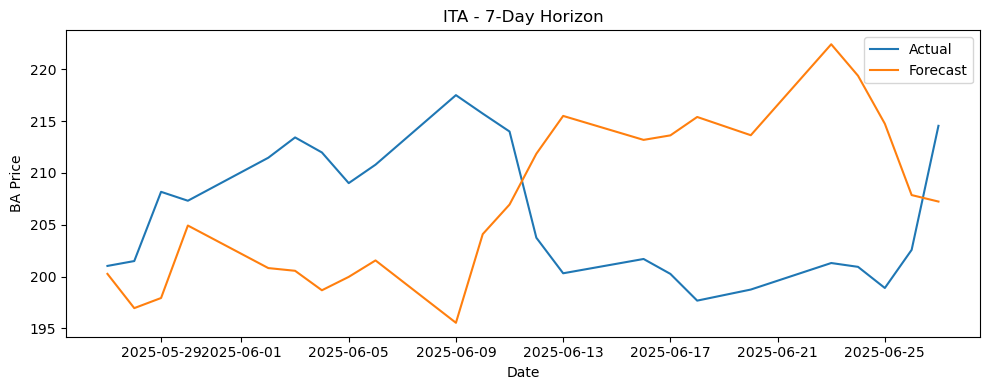


 Saved metrics to metrics_lstm_exo_ITA_2025.csv

 Evaluating with exogenous variable: ^VIX
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
Exo: ^VIX -

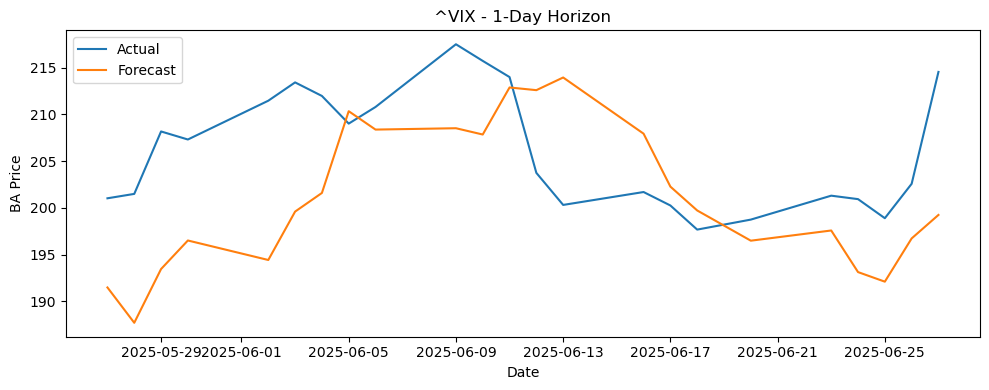

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
Exo: ^VIX - Horizon 3 -> RMSE=9.40, MAE=8.01, MAPE=3.86


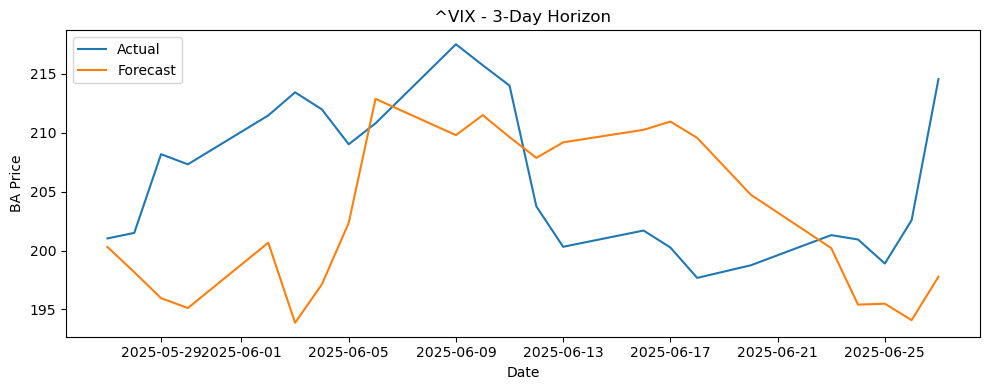

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
Exo: ^VIX - Horizon 7 -> RMSE=11.99, MAE=10.74, MAPE=5.17


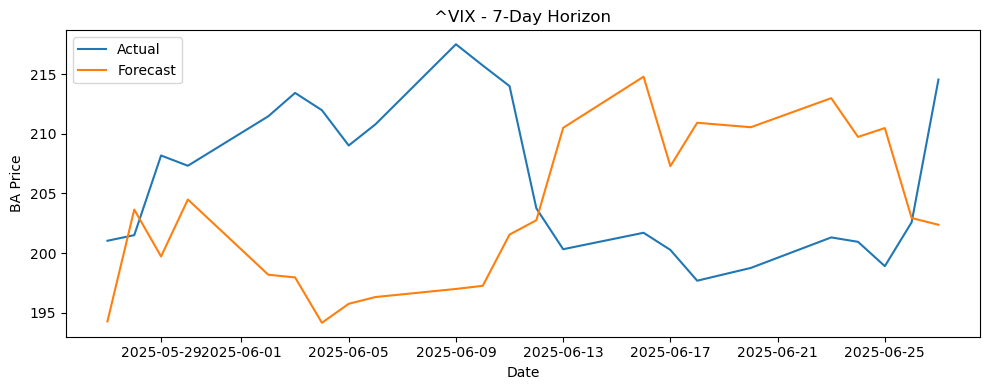


 Saved metrics to metrics_lstm_exo_VIX_2025.csv

 Evaluating with exogenous variable: ^TNX
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
Exo: ^TNX -

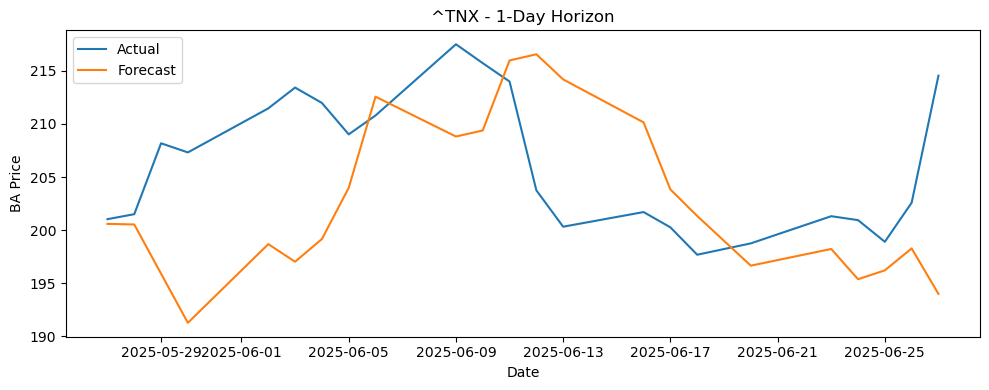

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
Exo: ^TNX - Horizon 3 -> RMSE=11.15, MAE=9.63, MAPE=4.66


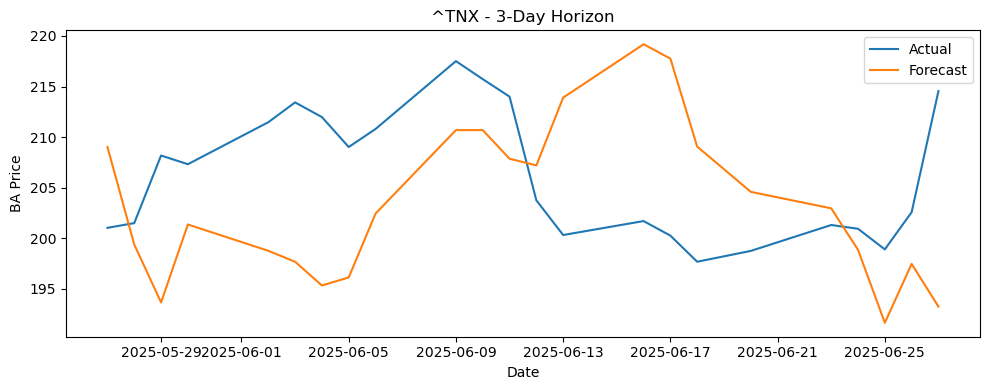

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
Exo: ^TNX - Horizon 7 -> RMSE=12.12, MAE=10.42, MAPE=5.01


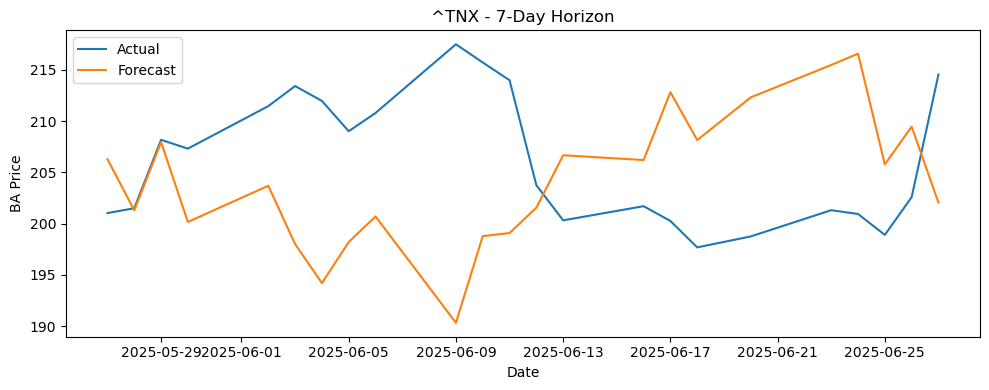


 Saved metrics to metrics_lstm_exo_TNX_2025.csv

 Evaluating with exogenous variable: DX-Y.NYB
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
Exo: DX

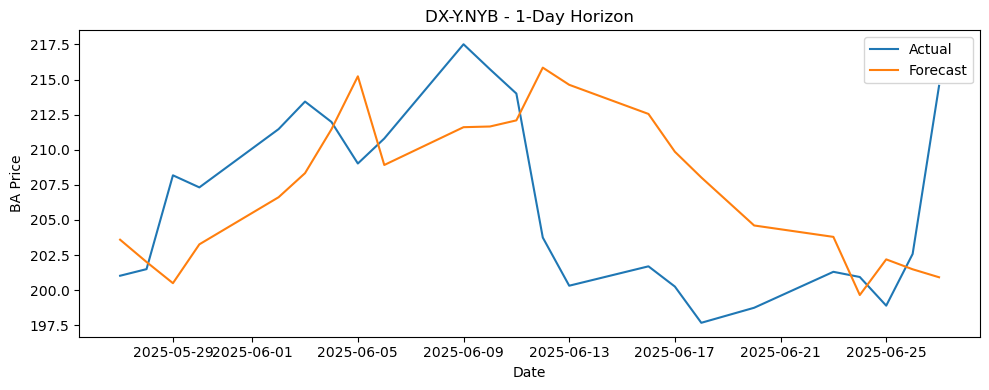

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
Exo: DX-Y.NYB - Horizon 3 -> RMSE=8.92, MAE=7.42, MAPE=3.61


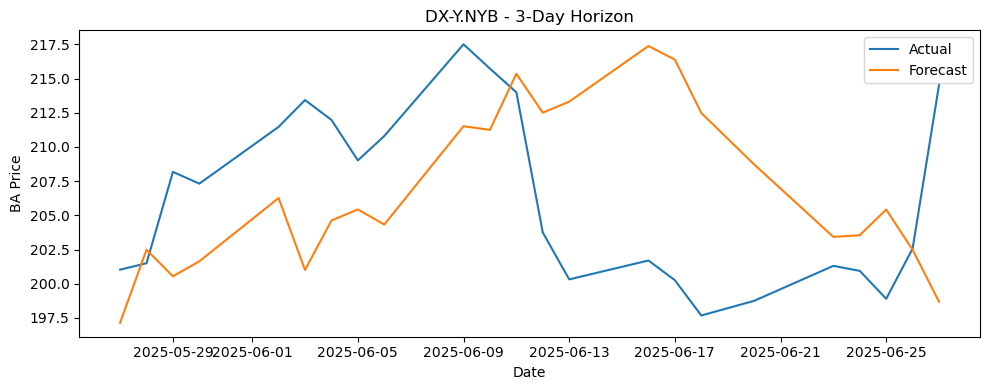

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
Exo: DX-Y.NYB - Horizon 7 -> RMSE=10.66, MAE=9.81, MAPE=4.78


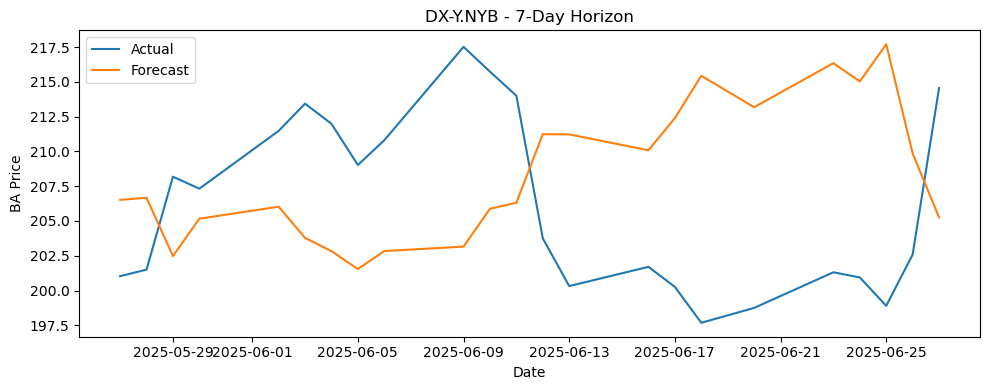


 Saved metrics to metrics_lstm_exo_DXY.NYB_2025.csv

 Evaluating with exogenous variable: JETS
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
Exo: JE

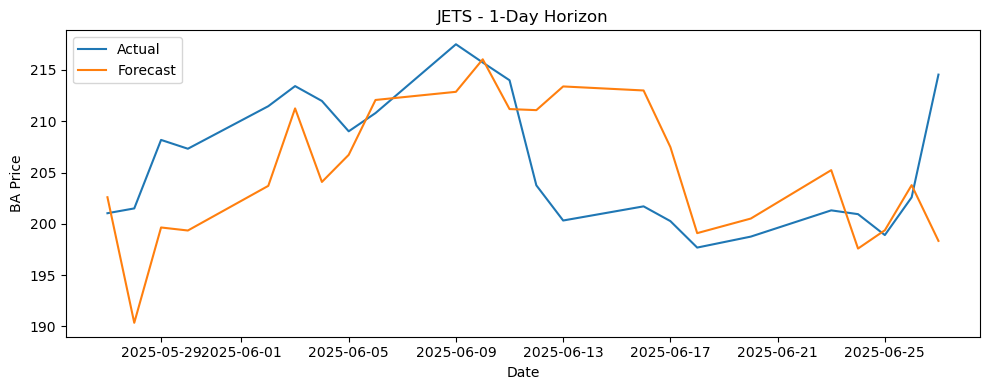

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
Exo: JETS - Horizon 3 -> RMSE=9.17, MAE=7.32, MAPE=3.54


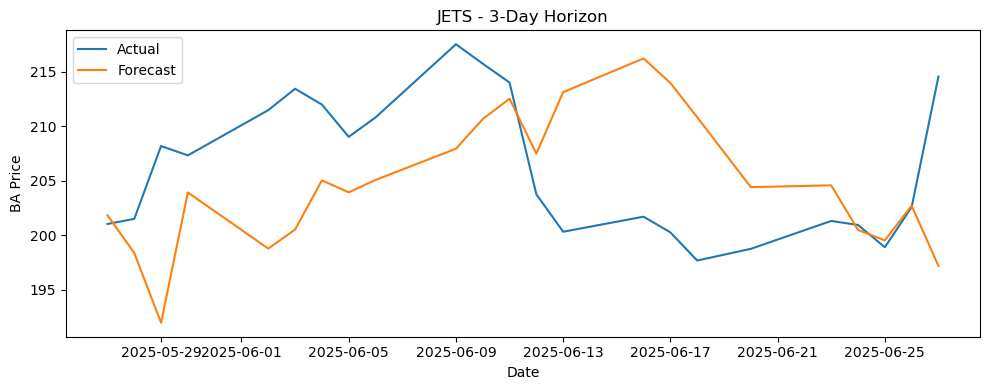

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
Exo: JETS - Horizon 7 -> RMSE=10.95, MAE=9.40, MAPE=4.54


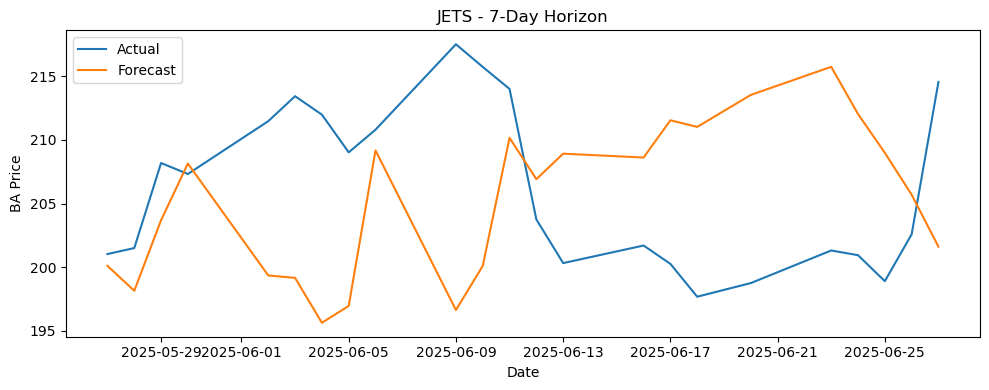


 Saved metrics to metrics_lstm_exo_JETS_2025.csv

 Evaluating with exogenous variable: XLI
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
Exo: XLI - 

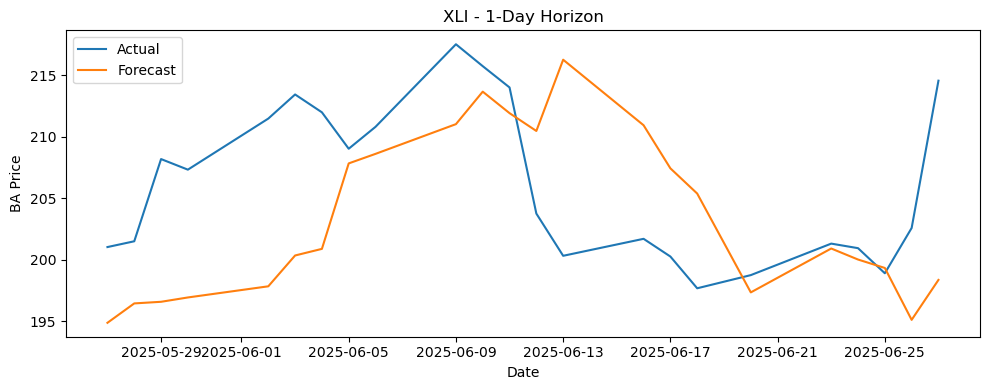

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
Exo: XLI - Horizon 3 -> RMSE=9.92, MAE=8.56, MAPE=4.13


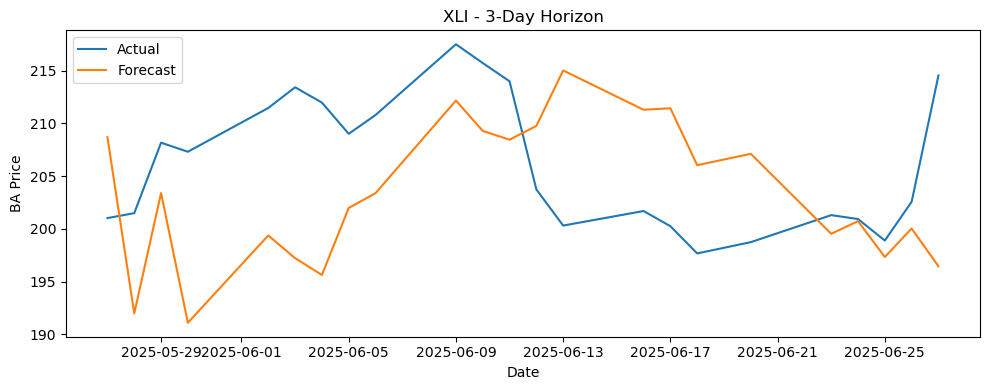

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
Exo: XLI - Horizon 7 -> RMSE=11.97, MAE=10.67, MAPE=5.14


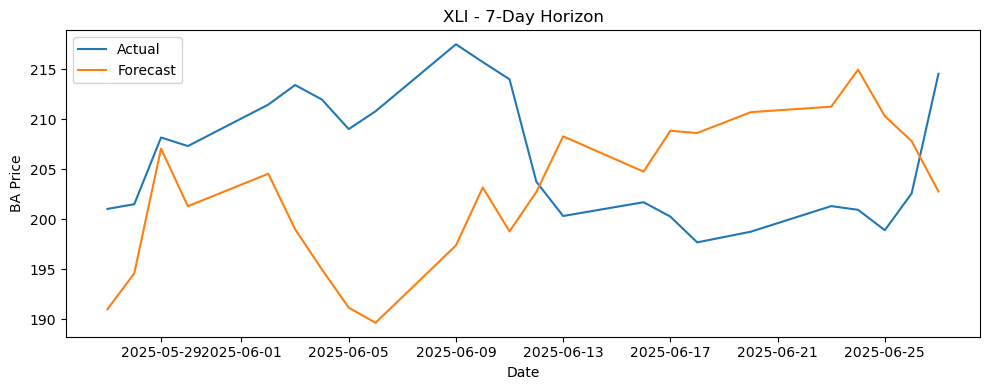


 Saved metrics to metrics_lstm_exo_XLI_2025.csv

 Evaluating with exogenous variable: IYT
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
Exo: IYT - H

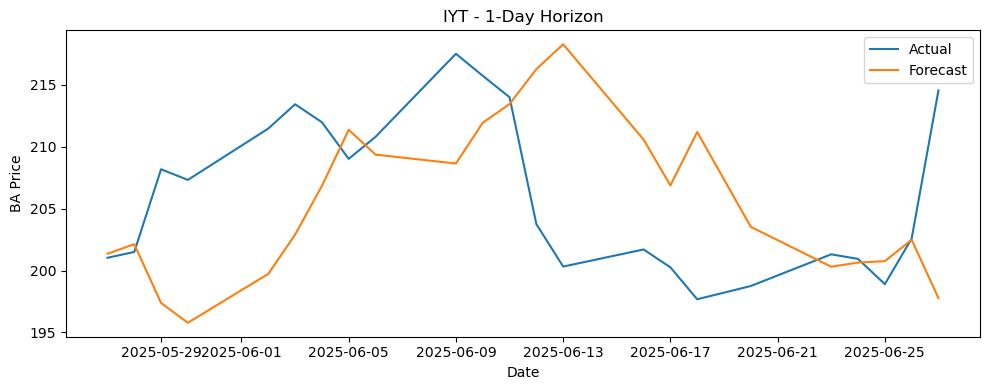

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
Exo: IYT - Horizon 3 -> RMSE=9.65, MAE=8.18, MAPE=3.97


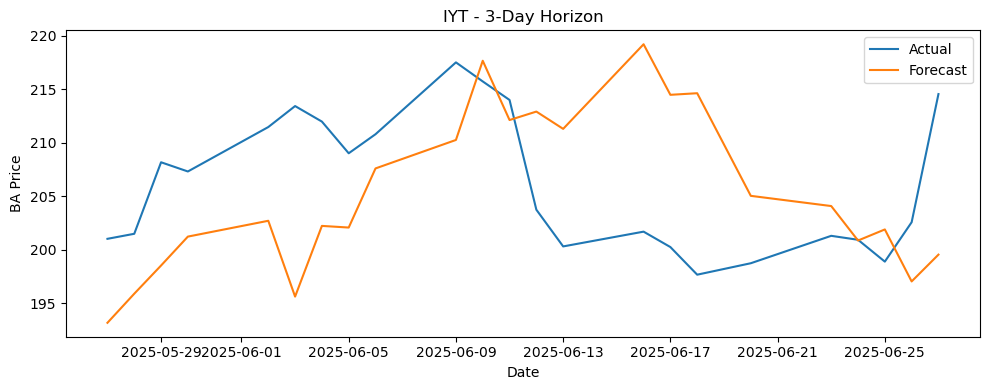

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
Exo: IYT - Horizon 7 -> RMSE=12.81, MAE=11.59, MAPE=5.59


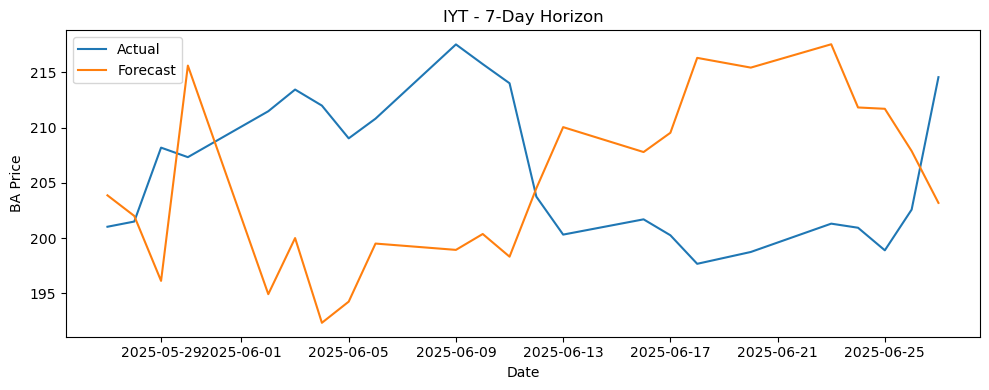


 Saved metrics to metrics_lstm_exo_IYT_2025.csv


In [157]:
# loop over exo variables one at a time
exo_vars = ["SLX", "CL=F", "ITA", "^VIX", "^TNX", "DX-Y.NYB", "JETS", "XLI", "IYT"]

for var in exo_vars:
    print(f"\n Evaluating with exogenous variable: {var}")
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=var,
        model_fn=best_model_fn,
        forecast_horizons=[1, 3, 7],
        output_csv_path=f"metrics_lstm_exo_{var.replace('=', '').replace('^', '').replace('-', '')}_2025.csv",
        callbacks=[early_stop]
    )

In [162]:
#grouping exo variables by type
grouped_exo_vars = {
    "commodities": ["CL=F", "DX-Y.NYB", "SLX"],           # Oil, Dollar Index, Steel ETF
    "macro": ["^VIX", "^TNX"],                     # Volatility index, treasury yield
    "sectoral": ["XLI", "JETS", "IYT", "ITA"]             # Sector-specific ETFs... Industrials, airlines
}


 Evaluating group: commodities with variables: ['CL=F', 'DX-Y.NYB', 'SLX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
Exo: ['CL=F', 'DX-Y.NYB', '

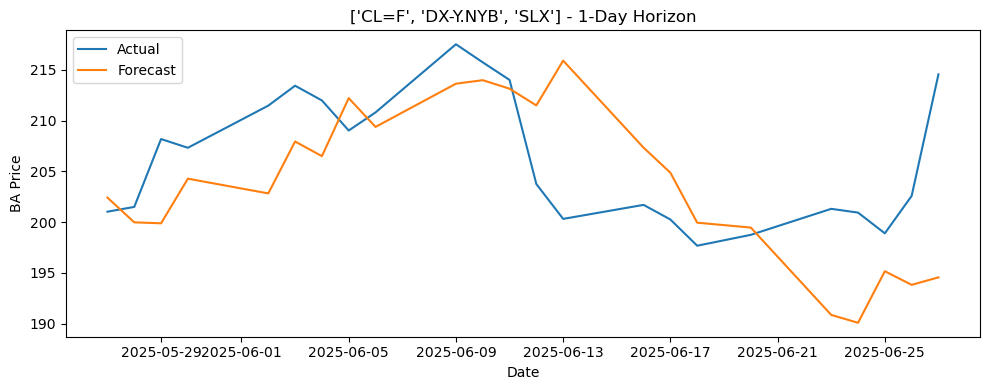


 Saved metrics to metrics_lstm_group_commodities_horizon_1_2025.csv

 Evaluating group: macro with variables: ['^VIX', '^TNX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━

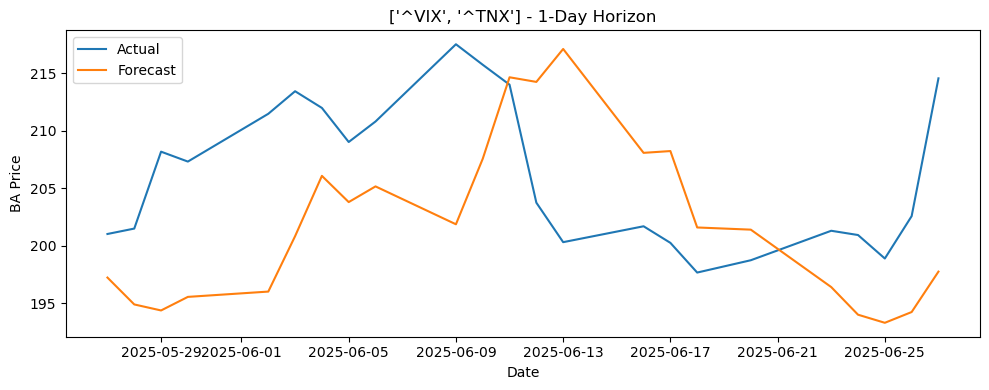


 Saved metrics to metrics_lstm_group_macro_horizon_1_2025.csv

 Evaluating group: sectoral with variables: ['XLI', 'JETS', 'IYT', 'ITA']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 

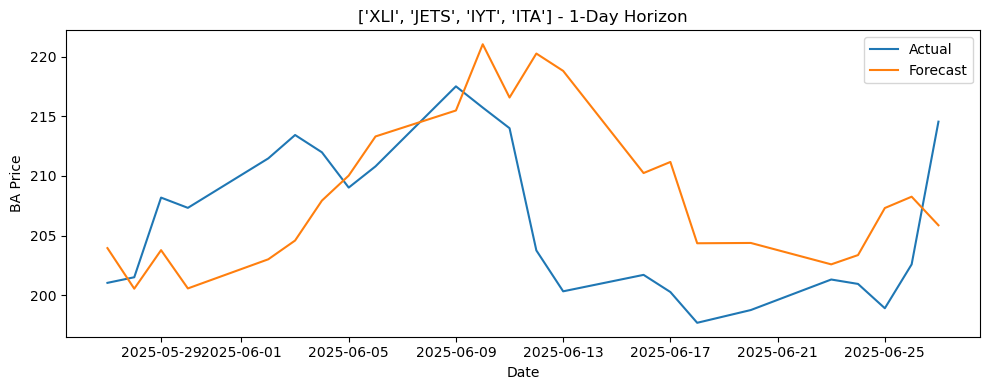


 Saved metrics to metrics_lstm_group_sectoral_horizon_1_2025.csv


In [164]:
#loop for evauating grouped variables
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating group: {group_name} with variables: {var_list}")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=var_list,  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[1], #trying one horizon at a time to deal with memory error
        output_csv_path=f"metrics_lstm_group_{group_name}_horizon_1_2025.csv",
        callbacks=[early_stop]
    )


 Evaluating group: commodities with variables: ['CL=F', 'DX-Y.NYB', 'SLX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
Exo: ['CL=F', 'DX-Y.NYB', '

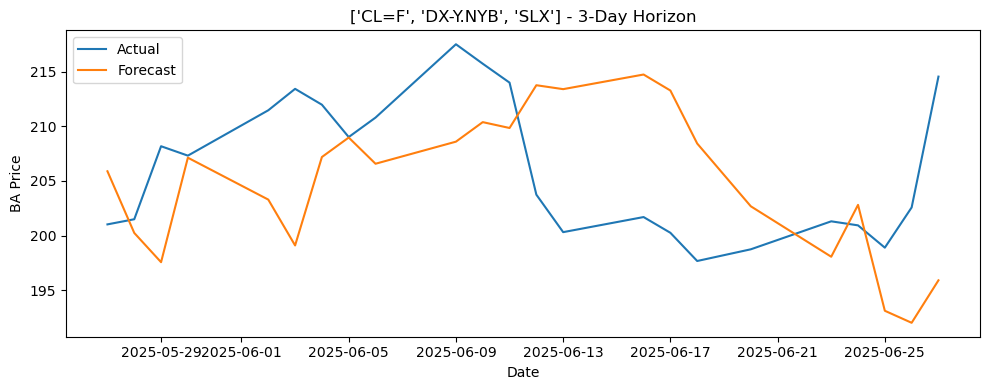


 Saved metrics to metrics_lstm_group_commodities_horizon_3_2025.csv

 Evaluating group: macro with variables: ['^VIX', '^TNX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━

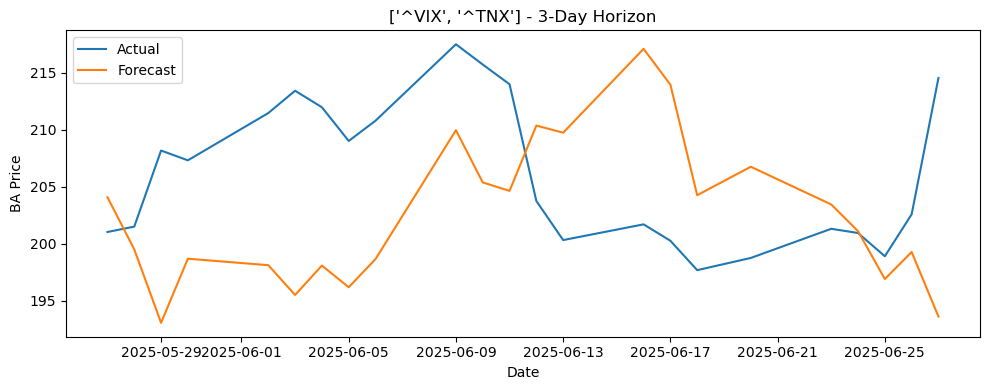


 Saved metrics to metrics_lstm_group_macro_horizon_3_2025.csv

 Evaluating group: sectoral with variables: ['XLI', 'JETS', 'IYT', 'ITA']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 

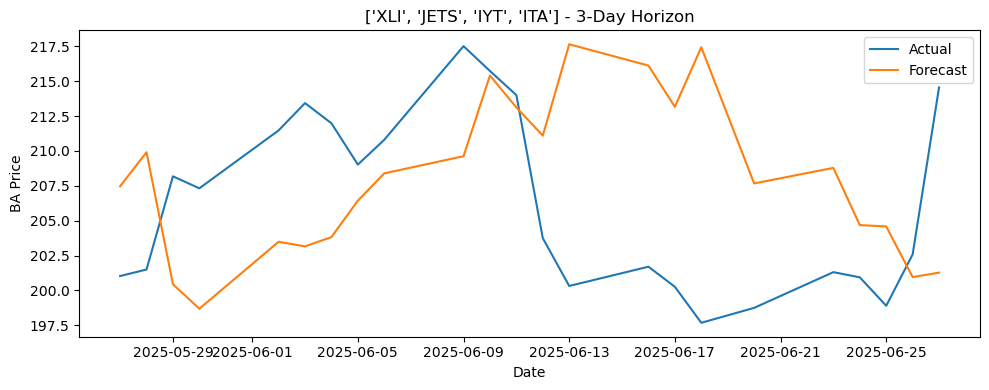


 Saved metrics to metrics_lstm_group_sectoral_horizon_3_2025.csv


In [165]:
#loop for evauating grouped variables
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating group: {group_name} with variables: {var_list}")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=var_list,  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[3],
        output_csv_path=f"metrics_lstm_group_{group_name}_horizon_3_2025.csv",
        callbacks=[early_stop]
    )


 Evaluating group: commodities with variables: ['CL=F', 'DX-Y.NYB', 'SLX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
Exo: ['CL=F', 'DX-Y.NYB', '

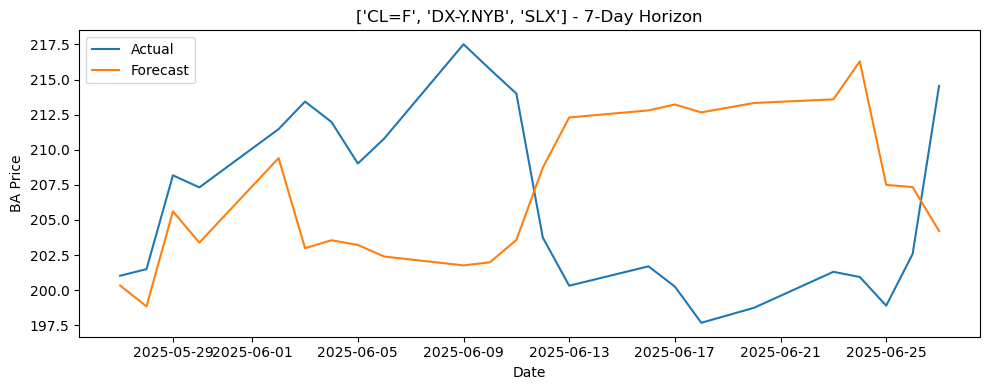


 Saved metrics to metrics_lstm_group_commodities_horizon_7_2025.csv

 Evaluating group: macro with variables: ['^VIX', '^TNX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━

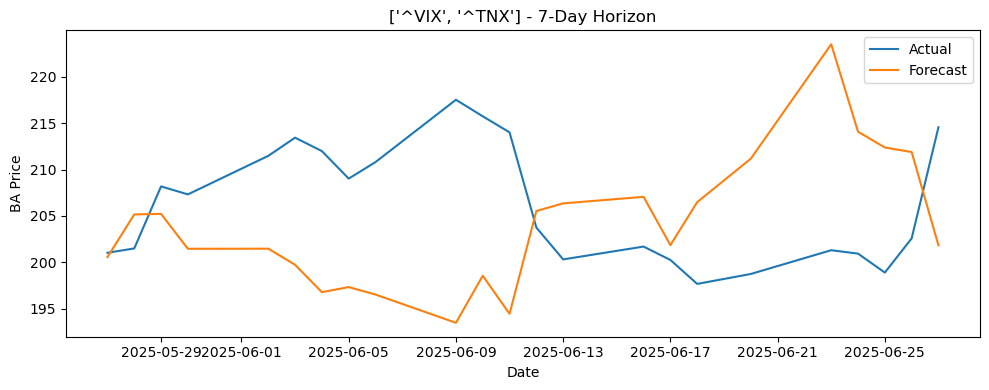


 Saved metrics to metrics_lstm_group_macro_horizon_7_2025.csv

 Evaluating group: sectoral with variables: ['XLI', 'JETS', 'IYT', 'ITA']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 

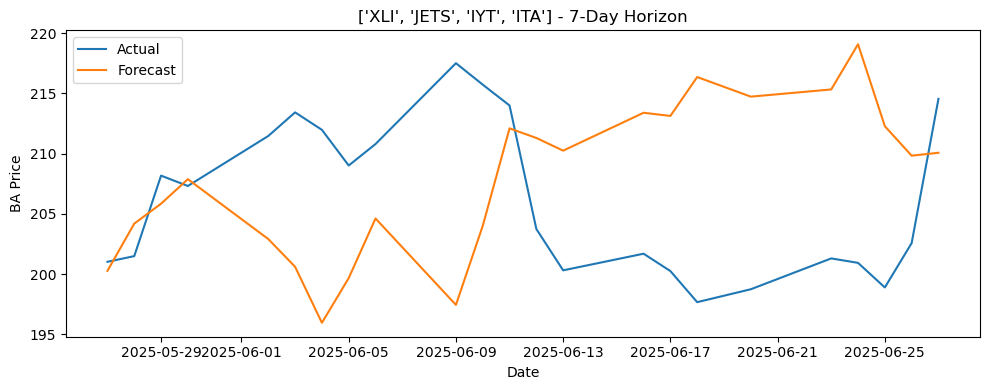


 Saved metrics to metrics_lstm_group_sectoral_horizon_7_2025.csv


In [166]:
#loop for evauating grouped variables
for group_name, var_list in grouped_exo_vars.items():
    print(f"\n Evaluating group: {group_name} with variables: {var_list}")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=var_list,  # List of multiple variables
        model_fn=best_model_fn,
        forecast_horizons=[7],
        output_csv_path=f"metrics_lstm_group_{group_name}_horizon_7_2025.csv",
        callbacks=[early_stop]
    )

### Getting best score from each exo variable type to include as exo variables 

In [168]:
# Defining the variables again to loop through
exo_vars = ["SLX", "CL=F", "ITA", "^VIX", "^TNX", "DX-Y.NYB", "JETS", "XLI", "IYT"]

combined_dfs = []

for var in exo_vars:
    safe_var = var.replace("=", "").replace("^", "").replace("-", "")
    filename = f"metrics_lstm_exo_{safe_var}_2025.csv"

    if os.path.exists(filename):
        df_temp = pd.read_csv(filename)
        df_temp["exo_var"] = var  # adding the original exogenous variable name
        combined_dfs.append(df_temp)
    else:
        print(f"Missing: {filename}")

# Combine and save
if combined_dfs:
    df_all = pd.concat(combined_dfs, ignore_index=True)
    df_all.to_csv("metrics_lstm_all_exo_combined_2025.csv", index=False)
    print("Combined results saved to: metrics_lstm_all_exo_combined_2025.csv")
else:
    print("No data to combine.")

Combined results saved to: metrics_lstm_all_exo_combined_2025.csv


In [169]:
df_all = df_all.drop_duplicates(subset=["exo_var", "horizon"])

#print best inputs
df_all.sort_values(by="mape").groupby("horizon").first()

,model,exo_var,rmse,mae,mape
horizon,,,,,
1,best_model_fn,JETS,7.004273,5.463766,2.648318
3,best_model_fn,JETS,9.167190,7.323497,3.538521
7,best_model_fn,CL=F,10.130368,8.861841,4.281949


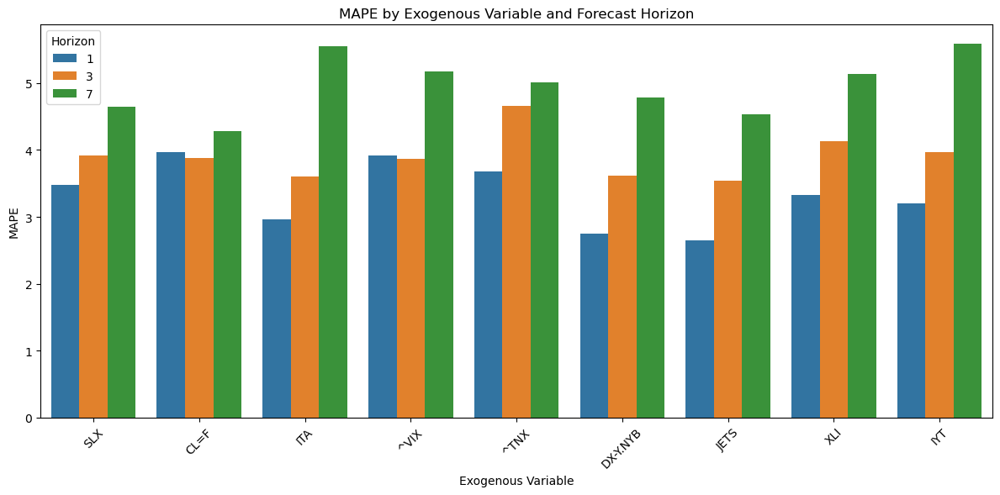

In [170]:
#plotting to compare across multiple horizons

plt.figure(figsize=(12, 6))
sns.barplot(
    data=df_all,
    x="exo_var",
    y="mape",
    hue="horizon",
    palette="tab10"
)
plt.title("MAPE by Exogenous Variable and Forecast Horizon")
plt.xlabel("Exogenous Variable")
plt.ylabel("MAPE")
plt.legend(title="Horizon")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

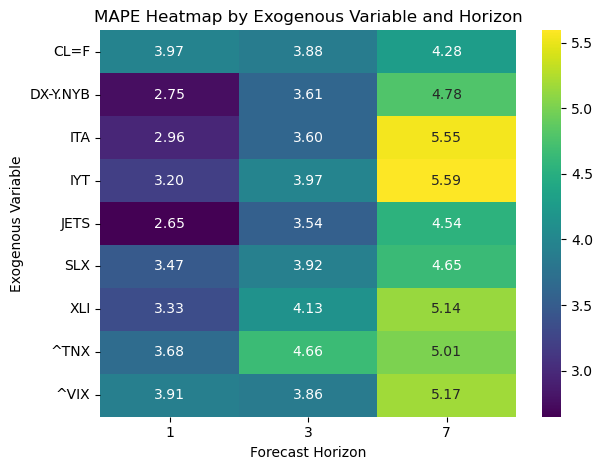

In [171]:
#heatmap
pivot = df_all.pivot(index="exo_var", columns="horizon", values="mape")
sns.heatmap(pivot, annot=True, fmt=".2f", cmap="viridis")
plt.title("MAPE Heatmap by Exogenous Variable and Horizon")
plt.ylabel("Exogenous Variable")
plt.xlabel("Forecast Horizon")
plt.tight_layout()
plt.show()

In [172]:
# mapping labels to tickers
label_mapping = {
    "commodities": ["CL=F", "DX-Y.NYB", "SLX"],
    "macro": ["^VIX", "^TNX"],
    "sectoral": ["XLI", "JETS", "IYT", "ITA"]
}

# inverting the mapping to map each ticker to its category
ticker_to_category = {ticker: label for label, tickers in label_mapping.items() for ticker in tickers}

# assigning the category to each row
df_all["category"] = df_all["exo_var"].map(ticker_to_category)

# Save the updated DataFrame with category column to a new CSV
df_all.to_csv("metrics_with_categories_2025.csv", index=False)

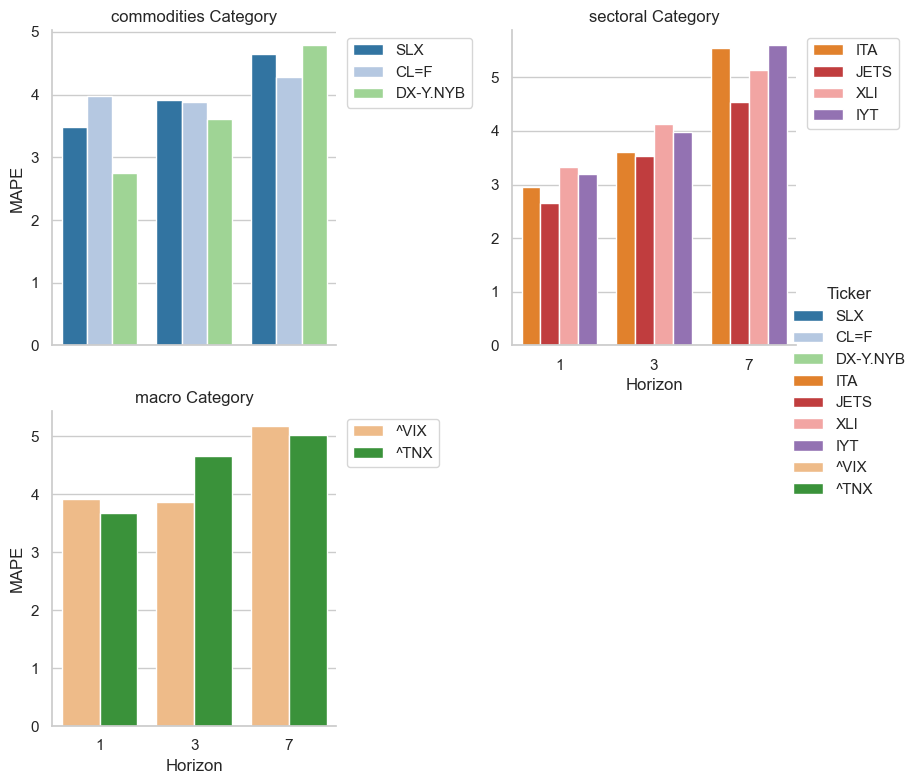

In [173]:
# setting style
sns.set(style="whitegrid")

# using unique color for each ticker
unique_tickers = df_all["exo_var"].unique()
palette = sns.color_palette("tab20", n_colors=len(unique_tickers))
color_map = dict(zip(unique_tickers, palette))

# FacetGrid creation
g = sns.FacetGrid(df_all, col="category", col_wrap=2, height=4, sharey=False)

# plot
g.map_dataframe(
    sns.barplot,
    x="horizon", y="mape", hue="exo_var",
    palette=color_map,
    errorbar=None
)

# key
g.add_legend(title="Ticker")
for ax in g.axes.flatten():
    ax.legend(loc='upper left', bbox_to_anchor=(1.01, 1))

# Set axis labels and titles
g.set_axis_labels("Horizon", "MAPE")
g.set_titles(col_template="{col_name} Category")
plt.tight_layout()
plt.show()


In [185]:
# best from each category identified - defining list to use in model
best_exo_by_horizon = {
    1: ["DX-Y.NYB", "JETS", "^TNX"],
    3: ["DX-Y.NYB", "JETS", "^VIX"],
    7: ["CL=F", "JETS", "^TNX"]
}


Evaluating best exogenous variables for horizon 1 with variables: ['DX-Y.NYB', 'JETS', '^TNX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
Exo: ['

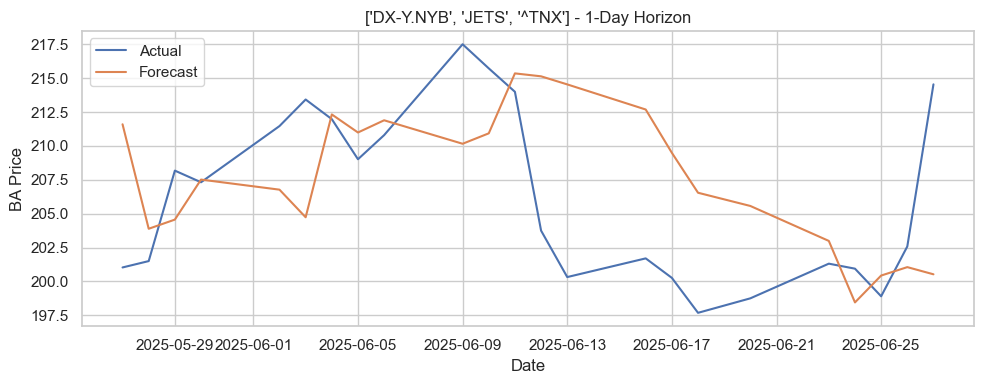


 Saved metrics to metrics_lstm_bestof_horizon_1_2025.csv

Evaluating best exogenous variables for horizon 3 with variables: ['DX-Y.NYB', 'JETS', '^VIX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

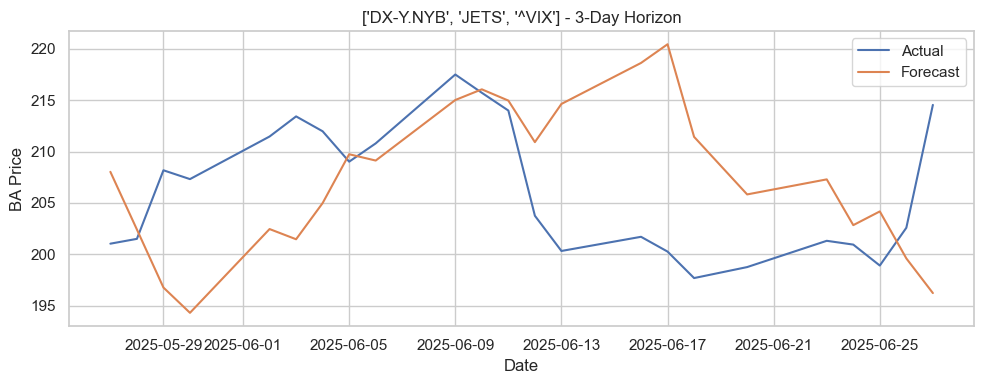


 Saved metrics to metrics_lstm_bestof_horizon_3_2025.csv

Evaluating best exogenous variables for horizon 7 with variables: ['CL=F', 'JETS', '^TNX']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157

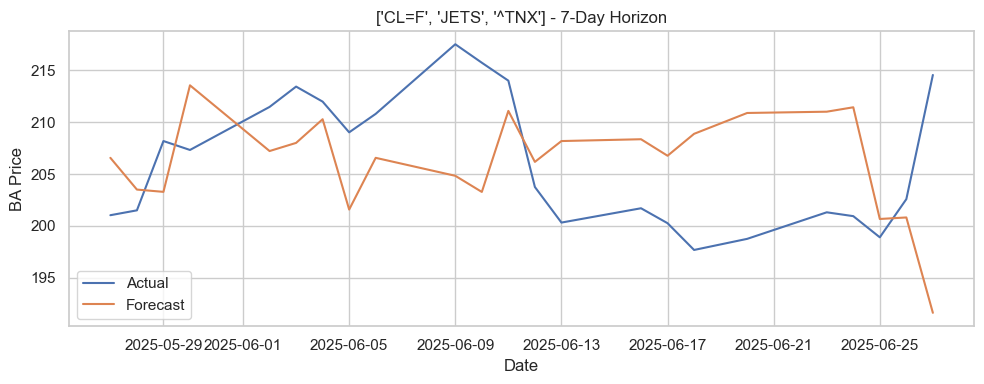


 Saved metrics to metrics_lstm_bestof_horizon_7_2025.csv


In [187]:
#loop for getting metrics for impact of "best" exo from each category as input
for h, exos in best_exo_by_horizon.items():
    print(f"\nEvaluating best exogenous variables for horizon {h} with variables: {exos}")
    
    evaluate_lstm_model_with_exo(
        df=df.copy(),
        exo_var=exos,
        model_fn=best_model_fn,
        forecast_horizons=[h],  # one at a time
        output_csv_path=f"metrics_lstm_bestof_horizon_{h}_2025.csv",
        callbacks=[early_stop]
    )